# Project Notebook Introduction

Welcome to the main project notebook! 

## What is the goal of this notebook?

This notebook should contain your project write-up and the analyses conducted on the provided data. For each project, the notebook provides links to a few articles on the subject of the notebook, and a few examples of analyses that you could/should do. But it is not at all exhaustive: If you need to install more python packages or other software, do so. If you want to search for additional literature to support your writing, do so!

Your goal is to work from these examples towards answering the list of questions specific to each of the projects, and write a coherent report following the structure at the bottom of this notebook. Your colleagues (and I) will read and grade the result. So, make sure that you provide ample and adequate descriptions of your results and methodologies. This notebook is likely going to get rather large as you add analyses, so best to use markdown cells and headings to create a table of contents structure, as you can see in the ToC menu on the left of the Colab user interface.  

If this project feels a bit open-ended, that's because it is - just like actual research! ***But you are not alone!*** You will collaborate with your fellow students in your group! I also want to push you towards asking any and all questions in the canvas discussions, and directly to me via email and the Friday Zoom meetings. I'm here to help, and will give hints if you ask me the right questions. 

You are free to make this as beautiful and far-reaching as you feel like. But keep track of time, you will need to finish this the week before the exam. Perfect is the enemy of good, beware. 


## Installation etc.

The first part of this notebook is shared across the different projects, as the notebook will download the data for all the projects in the same way. 

The first installation and setup cells may take a little while to run as they fetch and install all the required software. It's also likely there's going to be a LOT of outputs that are irrelevant. Feel free to delete the output of this cell after it runs to free up space. 

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex
!pip -qq install hrf_estimation



Extracting templates from packages: 100%
     |████████████████████████████████| 10.1 MB 4.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

import seaborn as sns
import cortex as cx 
import pandas as pd

### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine. You don't have to read/understand this code - it's all boilerplate stuff to set up Colab's virtual machine so that it works with our data. 

***More important:*** For a brief description of the data of the different projects, --and a couple of very important parameters of these acquisitions which you will need later-- please consult the [figshare website](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209)

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

# pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

# urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
# !unzip -qq /content/pycortex/db/hcp_999999.zip -d /content/pycortex/db/
pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /usr/share/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 23889, done.
remote: Counting objects: 100% (2293/2293), done.
remote: Compressing objects: 100% (785/785), done.
remote: Total 23889 (delta 1533), reused 2151 (delta 1449), pack-reused 21596
Receiving objects: 100% (23889/23889), 476.16 MiB | 23.66 MiB/s, done.
Resolving deltas: 100% (18215/18215), done.
Checking out files: 100% (529/529), done.


## Putting these tools to first use

Ok, why all this complicated hassle? Well, we want you to have a playground that allows you to really get to know the data. 

#### Where are the data files?

The data have now been downloaded, and you can check out the data on disk by using the command line. For example, in a code cell you can preface the line with an exclamation mark to give a commandline command: 

`!ls /content/data/prf_mapper_59k`

Will give you the contents of the prf experiment data folder. But, on the left in the CoLab UI you can also find a file navigator, next to the table of contents, search and code snippet elements. Feel free to have a look around!

#### Okay, but what can we do with these tools?

After downloading and auto-editing the data required for working with pycortex, we can now import pycortex. We'll use pycortex for plotting of the results, which is using only a subset of its awesome features. Remember that [brain viewer of semantic maps](http://gallantlab.org/huth2016/)? Also made using pycortex! If you have some spare time and want to play around with this awesome package, please have a look at the [pycortex docs](https://gallantlab.github.io/pycortex/)

In [ ]:
# !ls /content/data/prf_mapper_59k

And, just to highlight the type of visualisation we'll be doing, a quick demo of the way we'll be using it. We'll be using the surface from the Human Connectome Project, which we named `hcp_999999`. So that's the 'subject' name we use to get and plot surface data using pycortex. 

Don't worry if you see a bunch of warnings and stuff - it will create the figure we asked for from what is in essence a single line of code: the curvature of the cortical surface of this standard surface. **Gorgeous!** 

Feel free to change the datatype to `'thickness'`, for example. Also **Gorgeous!**

Failed to get connection
** (inkscape:4044): CRITICAL **: 08:55:45.135: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4044): CRITICAL **: 08:55:45.135: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4044): CRITICAL **: 08:55:45.135: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


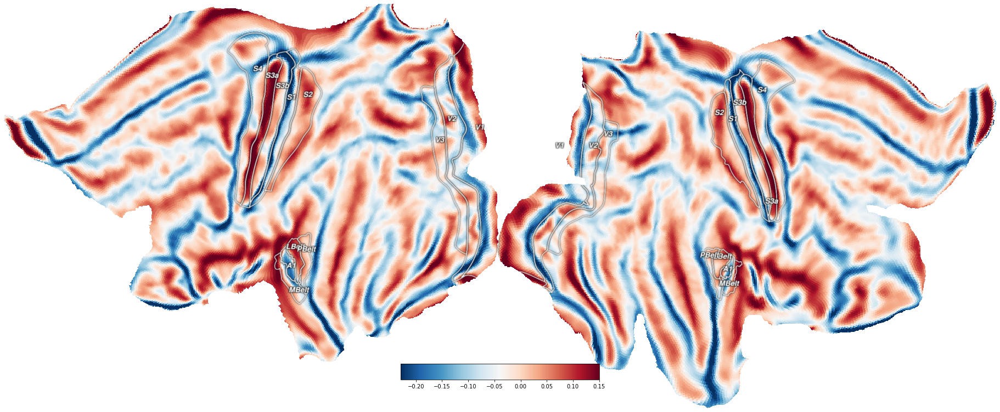

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

Failed to get connection
** (inkscape:4071): CRITICAL **: 08:55:53.539: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4071): CRITICAL **: 08:55:53.539: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4071): CRITICAL **: 08:55:53.539: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


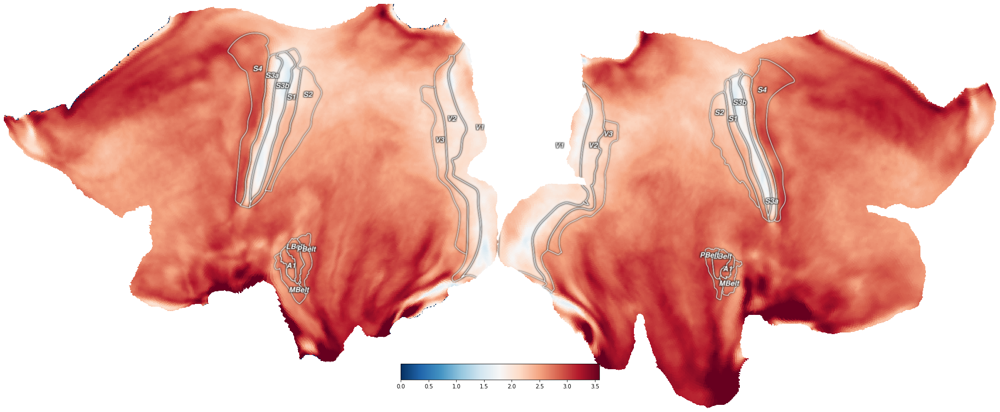

In [ ]:
thic_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='thickness')
cx.quickshow(thic_vertices );

### Flatmaps?

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, but ours are rendered side-by-side. Recognize them from the curvature figure?

Take a few minutes to orient yourself on these surfaces, using the atlas in the right figure. Where are the darker areas of this atlas on the inflated surfaces, and where do they end up on the flattened surface? Same for the coloured regions - make sure you have an idea of where things are. This will greatly increase your maneuverability in the brain. 

You'll need that maneuverability because we'll be working with surface data in this project: all the data you will load is surface-based, and should be visualized as shown in this introduction. In many ways, surface-based fMRI data is simpler than volume-based data. Instead of 4-dimensional, it's 2-dimensional: vertices by timepoints. This makes it less of a bookkeeping hassle to use. Let's have a look at some of your fMRI time-course data!


## Loading the functional data for your project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
        os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
         for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

# tseries_raw = np.concatenate([load_surf_data(
#         os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
#          for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

# tseries_raw = np.concatenate([load_surf_data(
#         os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
#          for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 120)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Like we learned in the preprocessing lecture and practical, the standard deviation over time also gives us a lot of valuable information regarding signal quality in non-z-scored data. Let's have a quick look at these different aspects of the data on flatmaps. This will also show us whether we were scanning the whole brain or not - an aspect of the data acquisition that you may want to mention in your report...

**Note**
If we plot data that didn't come from pycortex's surface data itself, but from our own files, we need to supply a subject. Adding the colormap is just for clarity. 

Failed to get connection
** (inkscape:4078): CRITICAL **: 08:56:12.265: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4078): CRITICAL **: 08:56:12.265: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4078): CRITICAL **: 08:56:12.265: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:4081): CRITICAL **: 08:56:19.096: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4081): CRITICAL **: 08:56:19.096: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4081): CRITICAL **: 08:56:19.096: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


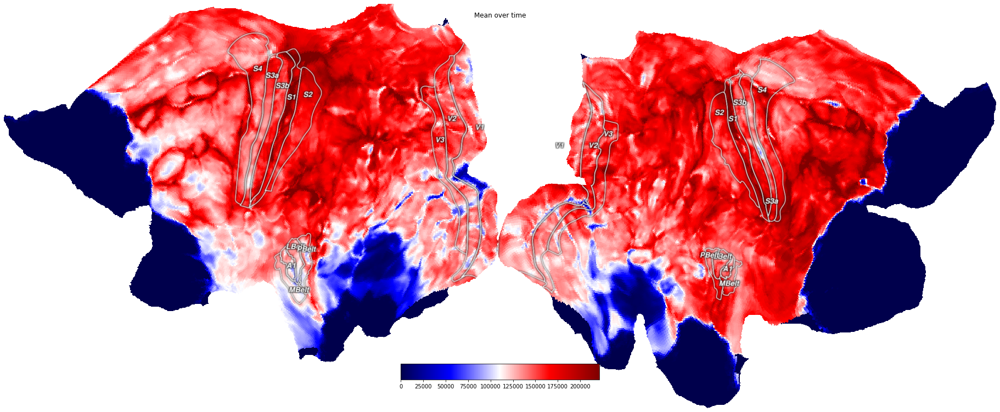

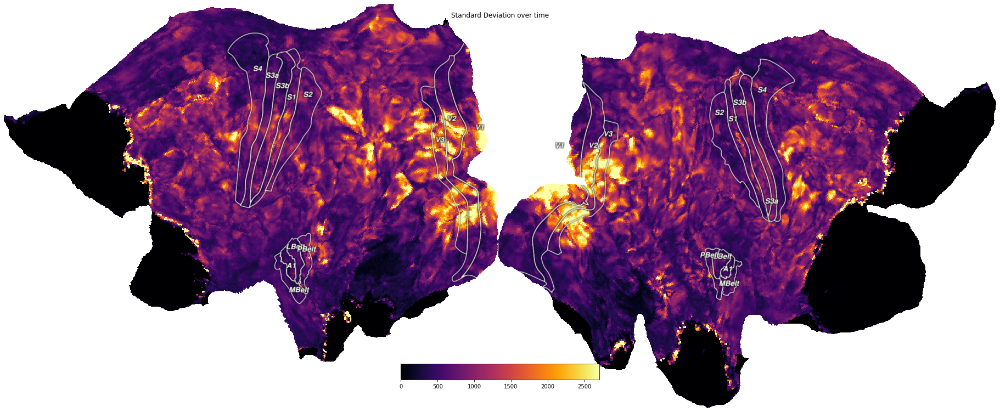

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

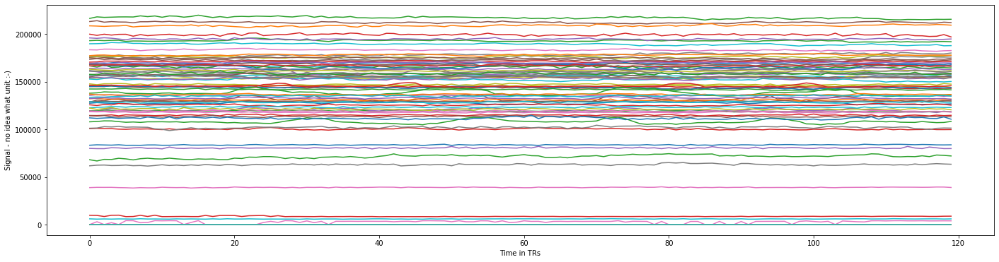

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

Now, depending on your dataset you may see that the top of the brain is brighter than the bottom. This is due to the fact that the top of the brain is closer to the coils. Moreover, you may see some really interesting web-like pattern on the surfaces that you've plotted. Like this:

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/lqPTAzK.png" alt="Model pipeline" width="500" align="right" />

What is that stuff? Why isn't it homogeneous? The answer is, we're looking at blood, and at 7 Tesla (at which all these data were acquired) these veins show up very strongly. Their presence has a strong influence on whether you can find any 'activation', as they may get in the way of what you want to find. Keep this in mind!

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?
2.   have these data been high-pass filtered? **Check the timecourses!**
3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 

You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

Conclusion:
1. No z-scored, the mean is not 0
2. yes beiing high-pass filtered, no drift over time
3. High standard deviation, because of visual task, their is activation.

What we need now is to z-score the raw data.

## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [ ]:
#######################################################################################################
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)
atlas_data_both_hemis_v123 = np.mod(atlas_data, 180)

total_voxels, = atlas_data.shape # 118584

for i in range(total_voxels):
  if atlas_data_both_hemis_v123[i] == 1 or atlas_data_both_hemis_v123[i] == 4 or atlas_data_both_hemis_v123[i] == 5:
    atlas_data_both_hemis_v123[i] = -1

### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

Failed to get connection
** (inkscape:4092): CRITICAL **: 08:56:56.673: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4092): CRITICAL **: 08:56:56.673: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4092): CRITICAL **: 08:56:56.673: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:4097): CRITICAL **: 08:57:02.956: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4097): CRITICAL **: 08:57:02.956: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4097): CRITICAL **: 08:57:02.957: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


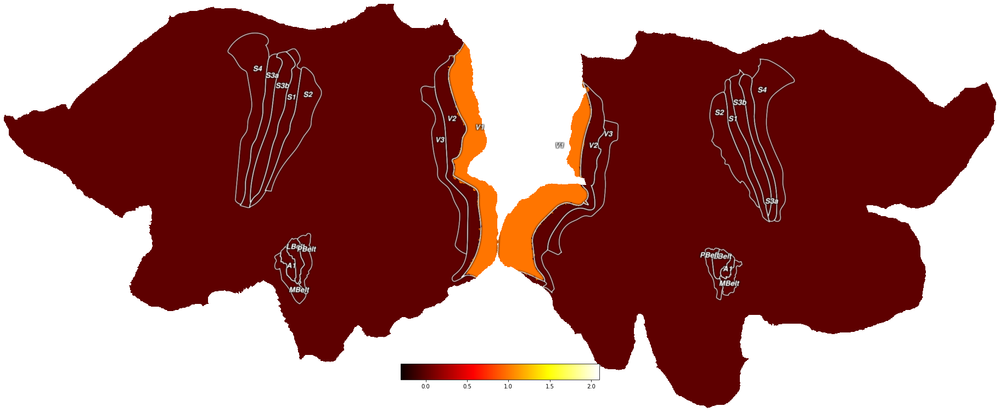

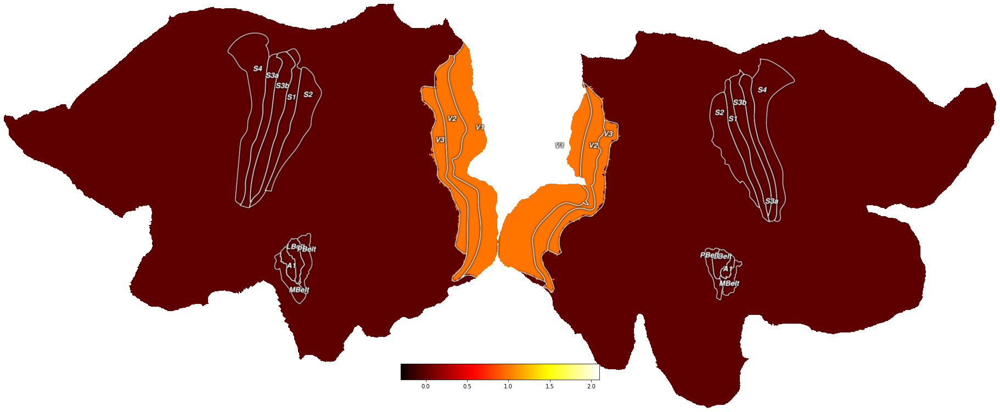

In [ ]:
# Here atlas_data_both_hemis represent the selected ROI index
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));
f2 = cx.quickshow(cx.Vertex(atlas_data_both_hemis_v123 == -1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable. For now, we'll select the region we highlighted above, V1 - the first region of the cortical visual hierarchy. It turns out that 2 out of our 3 experiments did something very very visual, with the third also showing visual stimuli. So let's see what we end up with! Once you've understood the idea of the following code cell, feel free to experiment with the actual index of the ROI this analysis works with!

***Note 1:*** whether this raw data visualization is very informative depends on your experiment. So, don't worry if this doesn't show you anything here. 

***Note 2:*** See how I'm trying to label all my figure axes so that it's clear what the units and elements of the data are? **It's very important that you do the same for your report!**

[False False False ... False False False]
(2939, 120)


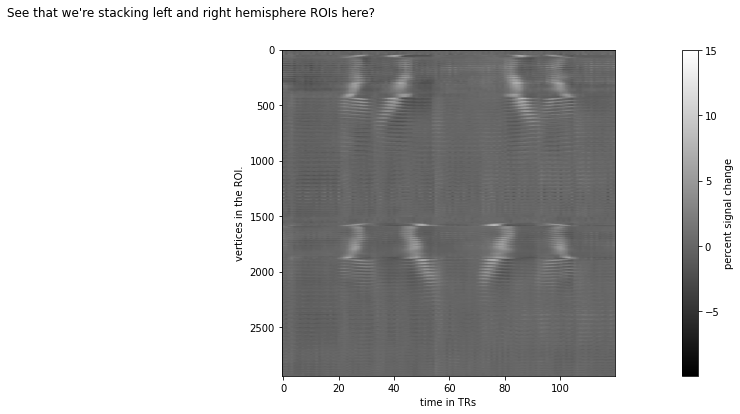

In [ ]:
#######################################################################################################
roi_boolean_mask = atlas_data_both_hemis == 1
print(roi_boolean_mask)

# but let's look at the actual signals after percent signal change conversion. 
def psc(data):
  """take percent signal change of data along axis 1. 
  This implementation is a bit idiosyncratic since 
  it uses the median instead of the mean of the signal.
  For sparse signals with very strong activations (such as those at 7T)
  this approach makes sense. Can you imagine why?"""
  # crudely checking whether psc hasn't already happened, in which case do nothing
  if np.mean(data) < 0.5:
    return data
  return ((data.T/np.median(data, 1)).T - 1) * 100

print(tseries_raw[roi_boolean_mask].shape)

f = plt.figure(figsize=(24,6))
plt.imshow(psc(tseries_raw[roi_boolean_mask]), aspect=1/25, cmap='gray')
plt.xlabel('time in TRs')
plt.ylabel('vertices in the ROI.')
plt.colorbar(label='percent signal change')
f.suptitle("See that we're stacking left and right hemisphere ROIs here?");

(2939, 120)
[ 0.02014478  0.03565327  0.0028338  ...  0.02047385 -0.07069767
 -0.0490348 ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


Failed to get connection
** (inkscape:4102): CRITICAL **: 08:57:17.257: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4102): CRITICAL **: 08:57:17.257: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4102): CRITICAL **: 08:57:17.257: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed


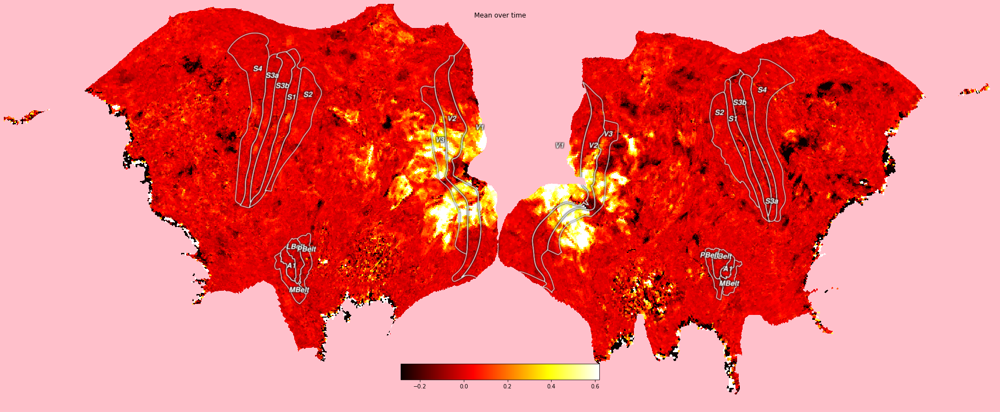

In [ ]:
# raw data afer percent signal change conversion
print(psc(tseries_raw[roi_boolean_mask]).shape)
print(psc(tseries_raw[roi_boolean_mask]).mean(axis=1))
f = cx.quickshow(cx.Vertex(psc(tseries_raw).mean(axis=1), subject='hcp_999999', cmap='hot'));
f.suptitle('Mean over time')
f.set_facecolor('pink')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


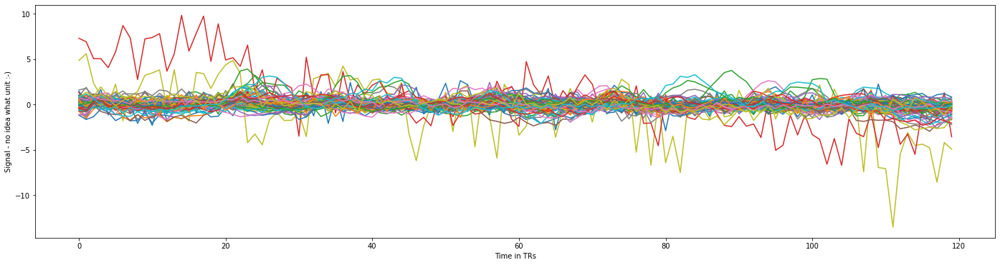

In [ ]:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(psc(tseries_raw)[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    'V123': -1,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159,
    'AV': -7
    }

# Project 1: Population Receptive Field Mapping

This section will explain the experiment, background and analysis plans for your project's dataset. You should feel free to use any and all information in this "Project Explanation" section in your own report. 

Before reading this Project Explanation, please read, as a group, the relevant articles: [Population receptive field estimates in human visual cortex, Dumoulin & Wandell, 2008](https://www.spinozacentre.nl/dumoulin/PDFs/Dumoulin-NI-2008.pdf), and [Visual Field Maps in Human Cortex, Brewer, Dumoulin & Wandell, 2007](https://www.cns.nyu.edu/~david/courses/sm12/Readings/Wandell-Neuron2007.pdf). If you have any questions about the type of experiment we're going to be looking at, and the different analysis steps, please ask me. 


<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/ionIYpH.png" alt="Model pipeline" width="300" align="right" />

## Computational Neuroimaging: the pRF Model

The Population Receptive Field (pRF) approach is a nice example of how recently, computational modeling of fMRI BOLD responses has become *the* way to go about analyzing your data. The method and model fit not only into the neuroimaging literature, but extend the idea of the receptive field from single-cell electrophysiology into fMRI. For more background on this, you can look back to the two lecture videos on this topic [here (part 1)](https://youtu.be/LRp1ecAO1HQ) and [here (part 2)](https://youtu.be/t7cslFH1VYg).
 

The basic idea of this approach is that we explicitly model the mechanism that generates our BOLD responses, purely in spatial terms (we could have added features such as orientation, colour, etc, but let's keep it simple for now). This pRF model mathematically describes the region of visual space that a voxel's neural *population* responds to. 

In this case, the model is really elementary; it's a Gaussian function in Cartesian 2-dimensional space. That is, it has a peak location in 2D space, and a width - also in 2 dimensions. This Gaussian is `isotropic`, which just means that it's circular in our 2D space (it could also be elliptical, although recent research shows that a circular, `isotropic` model actually works better). Now, because of our conceptualization of the model the peak location and width of the Gaussian correspond to parameters in our mathematical model. Specifically, our equation for the Gaussian is 
\begin{align*}
  G_*=exp\left(-\frac{(x-x_0)^2+(y-y_0)^2}{2\sigma_*^2}\right), \quad \quad G_*\cdot S \equiv \sum\limits_{x,y} (G_*\circ S),
\end{align*}, 
where $x_0$ and $y_0$ are the horizontal and vertical location of the peak, and $\sigma$ is the width of the pRF's region of activation. Whenever the stimulus is in this Gaussian window, we expect a BOLD response. This notion is implemented by the $G_*\cdot S$ part of the equation, which means that we take the dot product of the stimulus with the spatial profile of the model Gaussian. 

This means that with a few parameters ${x_0, y_0, \sigma}$ and knowing what stimulus we presented when, we can create a model timecourse for the response of the neurons in our voxel - and we can do so at each timepoint of our experiment. Of course, then we have to convolve with the HRF to generate an actual model-predicted BOLD response. By comparing our model-predicted BOLD response to the data, we can vary the parameters of our model (the stimulus remains the same, of course) to find the parameter values that best explain our data. This sequence of steps is outlined in the figure to the right, taken from the original [pRF article](https://www.spinozacentre.nl/dumoulin/PDFs/Dumoulin-NI-2008.pdf). 

The cells below go through these steps in code. 



In [ ]:
def gauss2D_iso_cart(x, y, mu=(0.0, 0.0), sigma=1.0, normalize_RFs=False):
    """gauss2D_iso_cart
    gauss2D_iso_cart takes two-dimensional arrays x and y, containing
    the x and y coordinates at which to evaluate the 2D isotropic gaussian 
    function, with a given sigma, and returns a 2D array of Z values.
    Parameters
    ----------
    x : numpy.ndarray, 2D or flattened by masking
        2D, containing x coordinates
    y : numpy.ndarray, 2D or flattened by masking
        2D, containing y coordinates
    mu : tuple, optional
        mean, 2D coordinates of mean/mode of gauss (the default is (0.0,0.0))
    sigma : float, optional
        standard deviation of gauss (the default is 1.0)
    Returns 
    -------
    numpy.ndarray, 2D or flattened by masking
        gaussian values evaluated at (x,y)
    """
    if normalize_RFs:
        return np.exp(-((x-mu[0])**2 + (y-mu[1])**2)/(2*sigma**2)) /(2*np.pi*sigma**2)
    else:
        return np.exp(-((x-mu[0])**2 + (y-mu[1])**2)/(2*sigma**2))

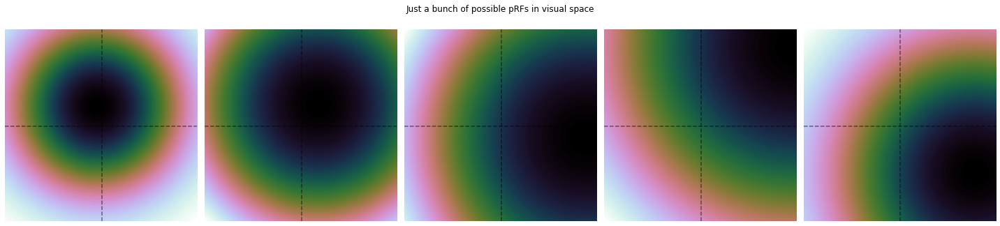

In [ ]:
########################################################
# set up the metrics of visual space
space_1D = np.linspace(-10,10,100,endpoint=True) # separate -10 to 10 into 100 value (等差数列)
X, Y = np.meshgrid(space_1D, space_1D) # Return coordinate matrices from coordinate vectors. (生成100x100的网格点)

f, sps = plt.subplots(1,5,figsize=(20,5))
for i in range(5):
    x0, y0, sigma = -10+np.random.rand()*20, -10+np.random.rand()*20, 0.5 + np.random.exponential()*10
    sps[i].imshow(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False), cmap='cubehelix_r')
    sps[i].axvline(50, color='k', ls='--', alpha=0.5)
    sps[i].axhline(50, color='k', ls='--', alpha=0.5)
    sps[i].axis('off')
f.suptitle('Just a bunch of possible pRFs in visual space');
plt.tight_layout()

Cool, so now we have our pRF model. We can use it to define different receptive field instances by varying these parameters. The next step would be to combine these models with the stimulus (you know, that $G_*\cdot S$ part of the equation above), so that we can create neural model timecourses. Luckily, we have the stimulus that was shown to the subject saved as a convenient file. 

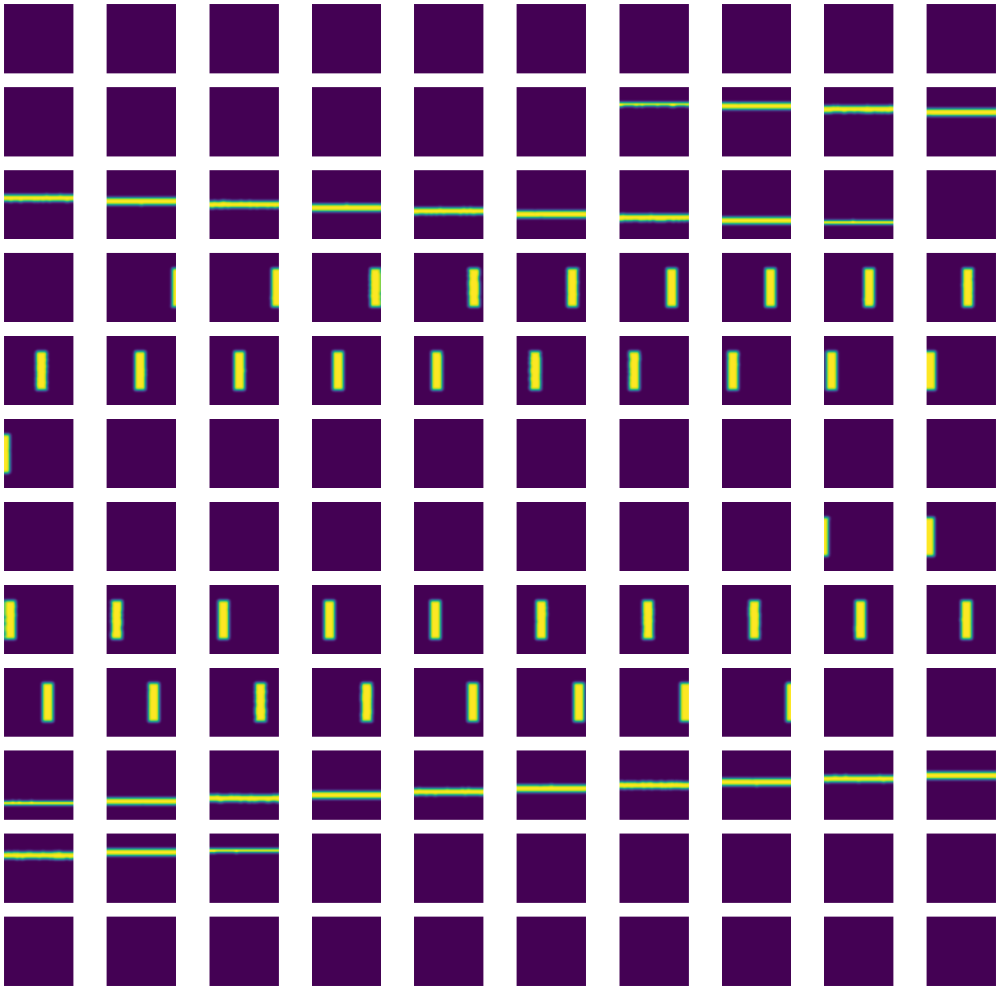

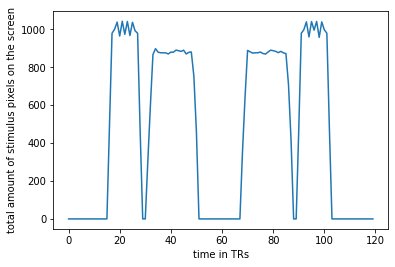

In [ ]:
from scipy.io import loadmat
from scipy.ndimage import median_filter, gaussian_filter, binary_propagation
import matplotlib.animation as animation

"""
STIMULUS:
dms: shape is (120, 500, 281)
  TR: 120 - 120 time point of the stimulas
new_dms: shape is (120, 500, 500) 120 time point 500x500 pixels
We expand the original dms into the new dms using zero panding
And then zip the new_dms into (120, 100, 100)
"""
dms = loadmat('/content/data/prf_mapper_59k/vis_design.mat')['stim'].T

# we have to do a bit of processing on the design matrix. 
# in essence this is a very slowly sampled movie of where the stimulus was on the screen
# you have one frame per TR, so that the analysis becomes easier. 

pixel_offset = int((dms.shape[1] - dms.shape[2]) / 2)
new_dms = np.zeros((dms.shape[0], dms.shape[1], dms.shape[1]))
for timepoint in range(dms.shape[0]):
    square_screen = np.zeros_like(new_dms[timepoint])
    square_screen[:,pixel_offset:pixel_offset+dms.shape[2]] = (dms[timepoint]!=0).astype(float)
    new_dms[timepoint,:,] = gaussian_filter(square_screen, sigma=10).T

# if we then re-sample this design matrix to the same 100 x 100
# pixel space of our models above, our model space and stimulus space align. 

new_dms = new_dms[:,::5,::5]

# But what does it look like? Let's plot the design we're using!
# we could do this by creating a whole sequence of imshow plots,
# but this turns ugly pretty quickly. 

f, ss = plt.subplots(12,10, figsize=(30,30))
shp = 0
for i in range(12):
    for j in range(10):
        ss[i,j].imshow(new_dms[shp])
        ss[i,j].axis('off')
        shp += 1

# perhaps it's best to try to visualize this as it was in the actual experiment.
# but Google Colab doesn't do interactive plots....

# f, ax = plt.subplots(1, 1, figsize=(8,8))
# ax.axis('off')
# ims = []
# for i in range(new_dms.shape[0]):
#     if i == 0:
#         ax.imshow(new_dms[i])  # show an initial one first
#     im = ax.imshow(new_dms[i], animated=True)
#     ims.append([im])

# ani = animation.ArtistAnimation(f, ims, interval=50, blit=True,
#                                 repeat_delay=1000)

# ani
# by plotting the total amount of stimulus pixels on the screen over time
# we get a handle on the structure of the experiment


# check in the specific timepoint how many stimulus pixels is on the screen
# sos is our design matrix
sos = new_dms.sum((1,2))
plt.figure()
plt.plot(sos)
plt.xlabel('time in TRs')
plt.ylabel('total amount of stimulus pixels on the screen');

A couple of things are evident from what we see here, and I want to highlight those. Even though we're making a square matrix as a design matrix, you see that the screen we used was a widescreen device (wider than tall). Actually, the screen was fullHD, or 1920x1080 pixels. But using that many pixels in a design matrix would make little sense, it would add a whole bunch of numbers and make the calculations slow. In fact, we're not doing anything with that level of precision: the great majority of pRFs in cortex have a larger $\sigma$ than ***0.5 degrees of visual angle***, so that's more than 100 voxels across. So, it's quite reasonable if we reduce the size of our stimulus array to 100x100. You've noticed, I'm sure; we're making the stimulus movie square, now. It's no accident that this is exactly the same size as the pRF models we created above. Indeed, this makes the stimulus design matrix and the model parameters fit completely: our models are defined in degrees of visual angles, and our stimulus lives in this same space: the screen was 20 degrees wide, fitting with the `space1D` variable we defined up there. If you were to run your own pRF experiment and analysis, you'd have to take a lot of care that all of these align, but our 100x100 design matrix and model dimensions take care of this for you. 

### Combining pRF model with our Stimulus

Now that we have our pRF model and our Stimulus in the same space, we can start to apply the pRF to the stimulus to create a model-predicted time-course. We'll walk through a couple of example pRFs.

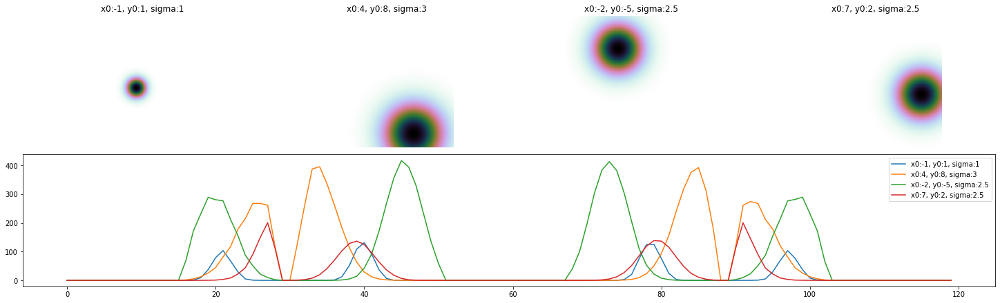

In [ ]:
# For clarity of the calculation, we make a vector out of the images 
# of both the stimulus and the pRF model by raveling them. 

def model_timecourse(model, stimulus):
    # print('--- Model shape', model.ravel().shape,"---")
    # print('--- Stimu shape', stimulus.T.reshape((-1,stimulus.shape[0])).shape,"---")
    return np.dot(model.ravel(), stimulus.T.reshape((-1,stimulus.shape[0])))

# and we can plot these for a bunch of different pRFs
# and to make it nice, we use a gridspec. Remember this for your report :)
from matplotlib.gridspec import GridSpec

fig = plt.figure(constrained_layout=True, figsize=(20,6))
gs = GridSpec(2, 4, figure=fig)
ax_tc = fig.add_subplot(gs[1,:])

for x0,y0,sigma,i in zip([-1,4,-2,7], [1, 8, -5, 2], [1, 3, 2.5, 2.5], [0,1,2,3]):
    pRF = gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False)
    ax_prf = fig.add_subplot(gs[0,i])
    ax_prf.imshow(pRF, cmap='cubehelix_r')
    ax_prf.set_title(f'x0:{x0}, y0:{y0}, sigma:{sigma}')
    ax_prf.axis('off')
    # ax_tc.plot(model_timecourse(np.rot90(pRF), new_dms), label=f'x0:{x0}, y0:{y0}, sigma:{sigma}')
    ax_tc.plot(model_timecourse(pRF, new_dms), label=f'x0:{x0}, y0:{y0}, sigma:{sigma}')
ax_tc.legend();

You see how these predict completely different timecourses of the signals? So, just by varying the parameters of the model, we can create vastly different timecourses. This also means that we can fit the model to our data, even if  very different timecourses exist in our data: one model to capture them all! Even nicer: the differences between these model timecourses are generated by changing just 3 parameters! 

### Grid Search

To find the optimal parameters settings to explain the brain time-courses, our first (and, for this project, only) analysis step is to create a grid of predictions, and fit them to the data. We'll then find the best-fitting model out of all models we tried. 

In [ ]:
# first, we'll get some data from a single ROI:

ROI_tcs = psc(tseries_raw[atlas_data_both_hemis == roi_index_dict['V1']])

# then, we'll define the grid of possible pRF parameters that we want to try out.
# we have to be very careful in changing the amount of different grid points, 
# since computation time goes with the cube of this number.
n_grid_points = 15
xes, yes, sizes = np.linspace(-10,10,n_grid_points,endpoint=True), np.linspace(-10,10,n_grid_points,endpoint=True), np.linspace(0.25,10,n_grid_points,endpoint=True)
xgrid, ygrid, sgrid = np.meshgrid(xes, yes, sizes)
xgrid, ygrid, sgrid = xgrid.ravel(), ygrid.ravel(), sgrid.ravel()

# this will then allow us to create model time-courses for all of these. 
# this operation is rather computationally expensive, but for the grid fit, 
# it's the most time-consuming step (if we maintain a moderate number of grid points!)

# np.rot90: Rotate an array by 90 degrees in the plane specified by axes. Don't know why here need to rotate??
grid_model_timecourses = np.array([model_timecourse(np.rot90(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False)), new_dms) for x0,y0,sigma in zip(xgrid, ygrid, sgrid)])
print(f'{grid_model_timecourses.shape[0]} grid_model_timecourses created!')

3375 grid_model_timecourses created!


That took a while, right? Let's take care of these model time-courses so that we don't have to re-compute them. But, we're still missing something. We have a model but it predicts neural population time-courses instead of BOLD signal time-courses. You know what to do, right? Luckily, the entire pRF experimental design is discretized on the TR: the bar stimulus jumps whenever an new TR starts. This means no ugly stuff in resampling the HRF relative to the time-points. 

For our HRF definition, we'll use a standard model which we'll steal from a package we're already importing. I know from experience that the 7T HRF looks a bit different, though, so it makes sense to shift it by half a TR (See that `onset=-tr/2`?)

<class 'numpy.ndarray'>


/usr/local/lib/python3.7/dist-packages/nilearn/glm/__init__.py:56: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  'It may change in any future release of Nilearn.', FutureWarning)


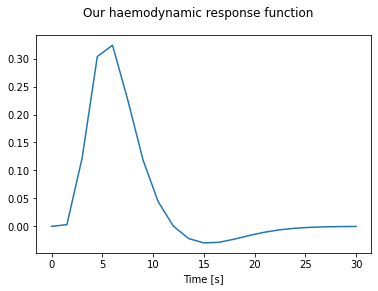

In [ ]:
from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf
#
"""
tr: Scan repeat time, in seconds.
oversampling : int, optional
      Temporal oversampling factor.
onset : float, optional   
      Onset time of the hrf.

"""
tr = 1.5

hrf = _gamma_difference_hrf(tr=tr ,oversampling=1, onset=-tr/2)[np.newaxis,:]  # np.newaxis used to add a new dimension  [] -> [[]]
plt.plot(np.arange(hrf.shape[-1])*tr, hrf.ravel())
plt.suptitle('Our haemodynamic response function')
plt.xlabel('Time [s]')

# and we perform the actual convolution in a fast way. 
grid_model_timecourses_conv = sp.signal.fftconvolve(grid_model_timecourses, hrf, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]
# grid_model_timecourses_conv = (grid_model_timecourses_conv - np.mean(grid_model_timecourses_conv)) / np.mean(grid_model_timecourses_conv)
print(type(grid_model_timecourses_conv))

### Bringing it all together for a single voxel

If you look back at the computational workflow figure on the right when we introduced the pRF model, you can see that we now have all the ingredients for our analysis to take place. The grid search procedure changed the layout of the diagram a bit, but all the ingredients are there. Please have a look and check. 

In the following code, we'll be putting the different steps together, and you'll be surprised: The workhorse behind this analysis is the same method that powered the first notebook on the GLM: `np.linalg.lstsq`! The difference now is that we're going to do a whole sequence of GLMs, one for each model. It's a simple model, with only a single actual timecourse regressor, but a GLM nonetheless!

In [ ]:
def rsq_for_model(data, model_tcs, return_yhat=False):
    """
    Parameters
    ----------
    data : numpy.ndarray
        1D or 2D, containing single time-course or multiple
    model_tcs : numpy.ndarray
        1D, containing single model time-course
    Returns 
    -------
    rsq : float or numpy.ndarray
        R-squared
        within-set rsq for this model's GLM fit, for all voxels in the data
    yhat : numpy.ndarray
        1D or 2D, model time-course for all voxels in the data

    """
    dm = np.vstack([np.ones(data.shape[-1]), model_tcs]).T
    betas = np.linalg.lstsq(dm, data.T)[0]
    yhat = np.dot(dm, betas).T
    rsq = 1-(data-yhat).var(-1)/data.var(-1)
    if return_yhat:
        return rsq, yhat
    else:
        return rsq

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


Text(0.5, 1.0, 'profile of best-fitting pRF model')

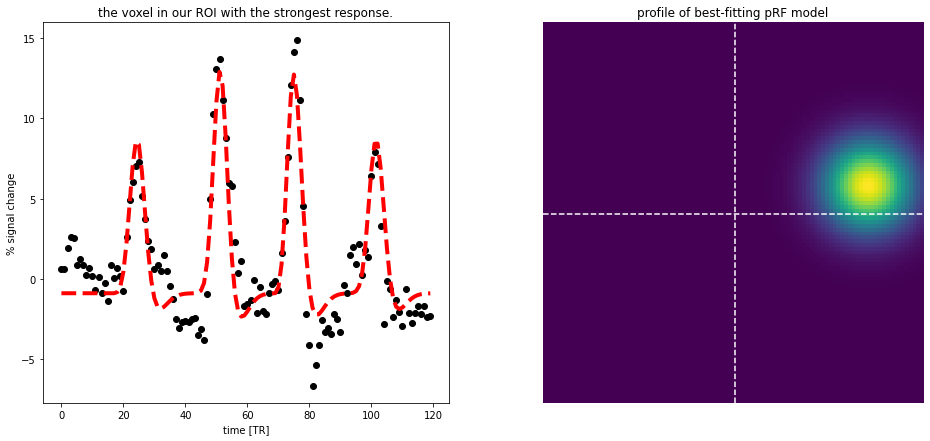

In [ ]:
# NOT NECESSARY!!!!!!!!!!!!!!!!!!!!!!!!


# let's first exemplify the whole thing with a single BOLD time-course 
# This we'll first inspect a bit.

sv_tcs = ROI_tcs[np.argmax(ROI_tcs.std(1))] # <- select the voxel with the strongest response
f, sps = plt.subplots(1,2,figsize=(16,7))
sps[0].plot(sv_tcs, 'ko', label='data')
sps[0].set_ylabel('% signal change')
sps[0].set_xlabel('time [TR]')
sps[0].set_title('the voxel in our ROI with the strongest response.')

rsqs = np.array([rsq_for_model(sv_tcs, mtcs) for mtcs in grid_model_timecourses_conv])
best_fitting_model = np.argmax(rsqs)

x0, y0, sigma = xgrid[best_fitting_model], ygrid[best_fitting_model], sgrid[best_fitting_model]
# # re-run the model fit for the best-fitting model to look at its time-course
yhat = rsq_for_model(sv_tcs, grid_model_timecourses_conv[best_fitting_model], return_yhat=True)
sps[0].plot(yhat[1], 'r--', lw=4, label='model fit')

sps[1].imshow(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False))
sps[1].axvline(50, color='w', ls='--')
sps[1].axhline(50, color='w', ls='--')
sps[1].axis('off')
sps[1].set_title('profile of best-fitting pRF model')
# feel free to try this out with a different vertex from our ROI!

Great. You've performed an actual pRF fit on the voxel with the highest standard deviation. But was that all? No! we recorded these timecourses throughout the brain so we'll try to fit them all. Well, at first we'll do this per ROI. The `rsq_for_model` function is set up such that you can also push in an entire 2D dataset. Just keep in mind that this is going to take a lot more time to compute - that's also why we're not doing the whole brain at once. 

In [ ]:
# %%timeit
# fitting for the entire ROI at once. It will give us a large output:
# an rsq array of nr_vertices by nr_models. 
# for the entire brain (or for a more finely spaced parameter space) 
# that would be a very large array to keep in memory, 
# so we'll do this on a per-ROI basis.
# if you can write a routine that makes this possible nonetheless, 
# that's part of the advanced questions for the report (see below)

### Visual Field Parameters

Well, that's great - we have a well-fitting model! And even for each voxel/vertex in V1! But what we're really interested in is what this voxel represents: a specific visual field location! 

To check this out, we can plot the pRF in the visual field, like we did a couple of cells back. But in the report you'll want to describe the results of fitting on more than one voxel, more at the level of an entire ROI. At that point it becomes easier to inspect the model parameters across the population of voxels/vertices. These informative measures you can then plot in scatter plots (for all voxels in an ROI, for example), or onto the flatmap (by filling in the full cortex according to the binary ROI mask you used to select the timecourses in the first place). Whenever you do this, make sure to take explained variance into account. Specifically, in this experiment, we don't want to be looking at voxels with an rsq lower than 0.15 or so, so you should convert all measures in these badly fitting voxels to `np.nan`. This will prevent them from being rendered on the flatmap.

In [ ]:
# once we have the best-fitting model for the different vertices/voxels, 
# we can look up what their visual field parameters are. This means that
# for each voxel/vertex, we now have an rsq and everything we need to 
# plot the voxel's pRF!

# x_y_s = np.array([[xgrid[bfm], ygrid[bfm], sgrid[bfm]] for bfm in best_fitting_model])

In [ ]:
from tqdm import tqdm

def find_valid_voxel_information(ROI_tcs, grid_model_timecourses_conv, threshold=0.15, flag=True):
    """
    Parameters
    ----------
    ROI_tcs : numpy.ndarray
        2D, containing time-course for all voxels in ROI
    grid_model_timecourses_conv : numpy.ndarray
        2D, containing time-course after convolving with HRF
        template databas
    Returns 
    -------
    valid_index_in_roi : numpy.ndarray 
        Except the rsq<threshold voxels' index in the range of all roi voxel
    x0 : numpy.ndarray  voxel -> best rsq -> x0
        shape is (valid_index.shape, )
    y0 : numpy.ndarray
        shape is (valid_index.shape, )
    sigma : numpy.ndarray
        shape is (valid_index.shape, )
    best_rsqs : numpy.ndarray
        shape is (ROI_tcs.shape, )

    """
    rsqs = np.array([rsq_for_model(ROI_tcs, mtcs) for mtcs in tqdm(grid_model_timecourses_conv)])
    print('rsqs shape: ',rsqs.shape)
    best_fitting_model = np.argmax(rsqs, axis=0) #??
    print('best_fitting_model:', best_fitting_model)
    
    # Same as np.amax(x, axis=-1, keepdims=True)
    # best_rsqs = np.take_along_axis(rsqs, np.expand_dims(best_fitting_model, axis=0), axis=0).ravel()
    best_rsqs = np.max(rsqs, axis=0)

    best_rsqs[np.where(best_rsqs<threshold)] = np.nan

    print(f"Count the rsq-less-than-0.15 voxels number is {np.count_nonzero(np.isnan(best_rsqs))}")

    if flag:
      # Extract the valid index and that voxels' highest rsq's related x0, y0, sigma
      valid_index_in_roi = np.argwhere(~np.isnan(best_rsqs)).ravel()
      print(f"Valid index in the cortex {valid_index_in_roi}")

      valid_index = best_fitting_model[valid_index_in_roi]
      print('valid_index shape: ',valid_index.shape)
    else:
      valid_index = best_fitting_model
      valid_index_in_roi = np.zeros(valid_index.shape)
      print(f"Count the voxels number is {np.count_nonzero(valid_index)}")

    x0, y0, sigma = xgrid[valid_index], ygrid[valid_index], sgrid[valid_index]

    print(f"Valid   x0  in the cortex {x0}")
    print(f"Valid   y0  in the cortex {y0}")
    print(f"Valid sigma in the cortex {sigma}")

    return valid_index_in_roi, x0, y0, sigma, best_rsqs

# zero filling the x_y_s getten from the find_valid_voxel_information by the valid_index
def zero_filling(voxels, valid_index, x_y_s):
    # print(x_y_s.shape)
    dest_x0 = [-10]*voxels
    dest_y0 = [-10]*voxels
    dest_si = [0]*voxels
    for count, idx in enumerate(valid_index):
      dest_si[idx] = x_y_s[count][2]
      dest_x0[idx] = x_y_s[count][0]
      dest_y0[idx] = x_y_s[count][1]
    print(f'Sigma in zero_filling: {dest_si}')
    return np.array([dest_x0, dest_y0, dest_si])

def expand_to_hemis(total_voxels, voxels, roi, x_y_s):
    index = []
    if roi == 'AB':  # all brain
      index = list(range(total_voxels))
    elif roi == 'V123':
      for i in range(total_voxels):
        if atlas_data_both_hemis_v123[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    elif roi == 'AV':
      for i in range(total_voxels):
        if atlas_data_both_hemis_av[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    else:
      for i in range(total_voxels):
        if atlas_data_both_hemis[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    output = [0] * total_voxels
    output_x0 = [-10] * total_voxels
    output_y0 = [-10] * total_voxels
    if voxels == total_voxels:
      output = x_y_s[:,2]
      output_x0 = x_y_s[:,0]
      output_y0 = x_y_s[:,1]
    else:
      for k in range(voxels):
        output[index[k]] = x_y_s[k][2]
        output_x0[index[k]] = x_y_s[k][0]
        output_y0[index[k]] = x_y_s[k][1]
    return output, output_x0, output_y0

def expand_rsq_to_hemis(total_voxels, voxels, roi, rsq):
    index = []
    if roi == 'AB':  # all brain
      index = list(range(total_voxels))
    elif roi == 'V123':
      for i in range(total_voxels):
        if atlas_data_both_hemis_v123[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    elif roi == 'AV':
      for i in range(total_voxels):
        if atlas_data_both_hemis_av[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    else:
      for i in range(total_voxels):
        if atlas_data_both_hemis[i] == roi_index_dict[roi]:
          index.append(i)
      print(f'Index in expand_to_hemis: {index}')
    output = [0] * total_voxels
    for count, r in enumerate(rsq):
      if np.isnan(r):
        rsq[count] = 0
    for k in range(voxels):
      output[index[k]] = rsq[k]
    return output

#plot the scatter plot
def plot_scatter(x0, y0, sigma, roi, fig):
    title = 'Figure' + str(fig) + '  ' + roi + ' scatter plot'
    plt.title(title)
    plt.scatter(x0, y0, c=sigma, s=230*sigma, alpha=0.4,
                cmap='viridis')
    cbar = plt.colorbar();  # show color scale
    cbar.set_label('sigma', rotation=270)
    plt.show()
    

# zoom into the roi regions
def zoom_to_roi(subject, roi=list(['V1', 'V2', 'V3']), hem=list(['left','right']), margin=50.0):
    """zoom_to_roi
    zoom_to_roi use to zoom in the hemisphere map
    Parameters
    ----------
    subject : string
        here is hcp_999999
    roi : string or string list, optional
        the roi you want to zoom into
    hem : string or string list, optional
        the side of hemisphere you want to select, should be 'left' or 'right'
    margin : int, optional
        standard deviation of gauss (the default is 1.0)
    """
    if isinstance(roi, list):
      roi_ptss = []
      for r in roi:
        roi_verts = cx.get_roi_verts(subject, r)[r]
        roi_map = cx.Vertex.empty(subject)
        roi_map.data[roi_verts] = 1
        
        if isinstance(hem, list):
          for h in hem:
            (lflatpts, lpolys), (rflatpts, rpolys) = cx.db.get_surf(subject, "flat", nudge=True)
            sel_pts = dict(left=lflatpts, right=rflatpts)[h]
            roi_pts = sel_pts[np.nonzero(getattr(roi_map, h))[0],:2]
            roi_ptss.extend(roi_pts)
        else:
          (lflatpts, lpolys), (rflatpts, rpolys) = cx.db.get_surf(subject, "flat", nudge=True)
          sel_pts = dict(left=lflatpts, right=rflatpts)[hem]
          roi_pts = sel_pts[np.nonzero(getattr(roi_map, hem))[0],:2]
      roi_ptss = np.array(roi_ptss)
      xmin, ymin = roi_ptss.min(0) - margin
      xmax, ymax = roi_ptss.max(0) + margin
      plt.axis([xmin, xmax, ymin, ymax])
    if isinstance(roi, str) and isinstance(hem, str):
      roi_verts = cx.get_roi_verts(subject, roi)[roi]
      roi_map = cx.Vertex.empty(subject)
      roi_map.data[roi_verts] = 1

      (lflatpts, lpolys), (rflatpts, rpolys) = cx.db.get_surf(subject, "flat", nudge=True)
      sel_pts = dict(left=lflatpts, right=rflatpts)[hem]
      roi_pts = sel_pts[np.nonzero(getattr(roi_map, hem))[0],:2]

      xmin, ymin = roi_pts.min(0) - margin
      xmax, ymax = roi_pts.max(0) + margin
      plt.axis([xmin, xmax, ymin, ymax])

Without Threshold


  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [01:31<00:00, 36.87it/s]


rsqs shape:  (3375, 6613)
best_fitting_model: [1605 2077  435 ... 1365 1112 1112]
Count the rsq-less-than-0.15 voxels number is 2389
Count the voxels number is 6613
Valid   x0  in the cortex [-7.14285714 -5.71428571 10.         ... -8.57142857 10.
 10.        ]
Valid   y0  in the cortex [ 0.          2.85714286 -8.57142857 ... -1.42857143 -4.28571429
 -4.28571429]
Valid sigma in the cortex [0.25       5.125      0.25       ... 0.25       1.64285714 1.64285714]


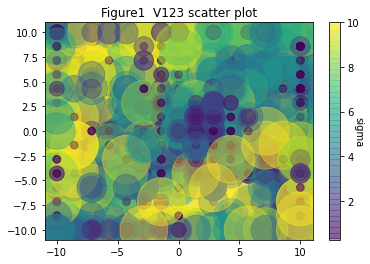





With Threshold


100%|██████████| 3375/3375 [01:32<00:00, 36.64it/s]


rsqs shape:  (3375, 6613)
best_fitting_model: [1605 2077  435 ... 1365 1112 1112]
Count the rsq-less-than-0.15 voxels number is 2389
Valid index in the cortex [  26   30   35 ... 6591 6607 6608]
valid_index shape:  (4224,)
Valid   x0  in the cortex [ 1.42857143 -4.28571429 -1.42857143 ... 10.         10.
 10.        ]
Valid   y0  in the cortex [ 4.28571429  2.85714286  0.         ... -4.28571429 -4.28571429
 -4.28571429]
Valid sigma in the cortex [7.91071429 6.51785714 4.42857143 ... 0.25       0.94642857 0.25      ]


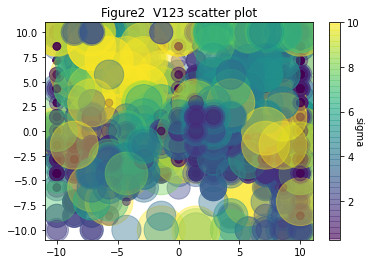

In [ ]:
# plot for V1 AND V2 AND V3
fig = 0
roi_v123 = 'V123'

ROI_tcs_v123 = psc(tseries_raw[atlas_data_both_hemis_v123 == roi_index_dict[roi_v123]])
print('Without Threshold')
valid_index_v123_n, x0_v123_n, y0_v123_n, sigma_v123_n, _ = find_valid_voxel_information(ROI_tcs_v123, grid_model_timecourses_conv, flag=False)

fig += 1
plot_scatter(x0_v123_n, y0_v123_n, sigma_v123_n, roi_v123, fig)

print('\n\n\n')
print('With Threshold')
valid_index_v123, x0_v123, y0_v123, sigma_v123, rsqs_v123 = find_valid_voxel_information(ROI_tcs_v123, grid_model_timecourses_conv)

fig += 1
plot_scatter(x0_v123, y0_v123, sigma_v123, roi_v123, fig)

Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.910714285714286, 0, 0, 0, 6.517857142857142, 0, 0, 0, 0, 4.428571428571429, 5.821428571428571, 7.2142857142857135, 0, 5.821428571428571, 0, 5.821428571428571, 7.2142857142857135, 9.303571428571429, 0, 6.517857142857142, 5.125, 6.517857142857142, 8.607142857142858, 0, 0, 0, 0, 0, 7.2142857142857135, 6.517857142857142, 0, 10.0, 5.821428571428571, 4.428571428571429, 5.821428571428571, 6.517857142857142, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 4.428571428571429, 7.910714285714286, 5.821428571428571, 5.821428571428571, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.0357142857142856, 0, 0, 0, 0, 0, 0, 0.25, 0, 0.25, 0, 0, 0, 0, 0, 0, 0, 4.428571428571429, 0.25, 0.25, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.0357142857142856, 7.910714285714286, 7.2142857142857135, 2.3392857142857144, 0, 3.7321428571428568, 0.25, 1.64285714

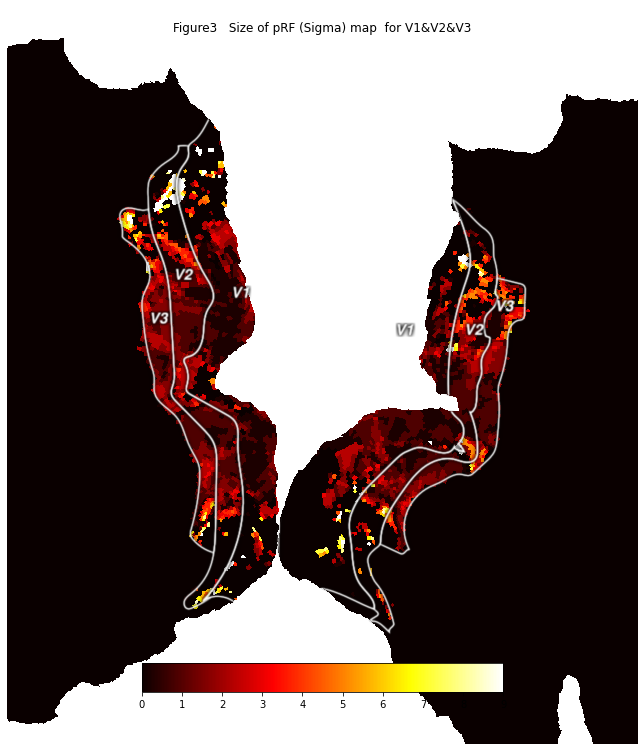

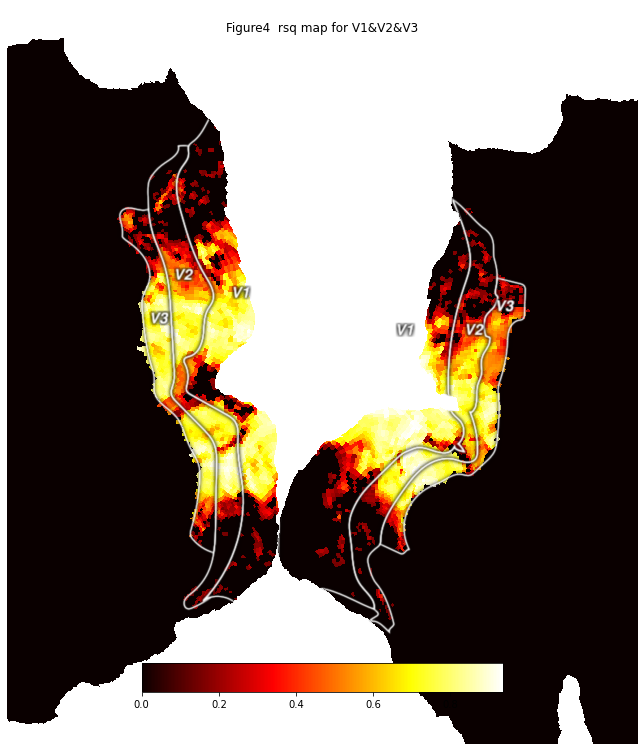

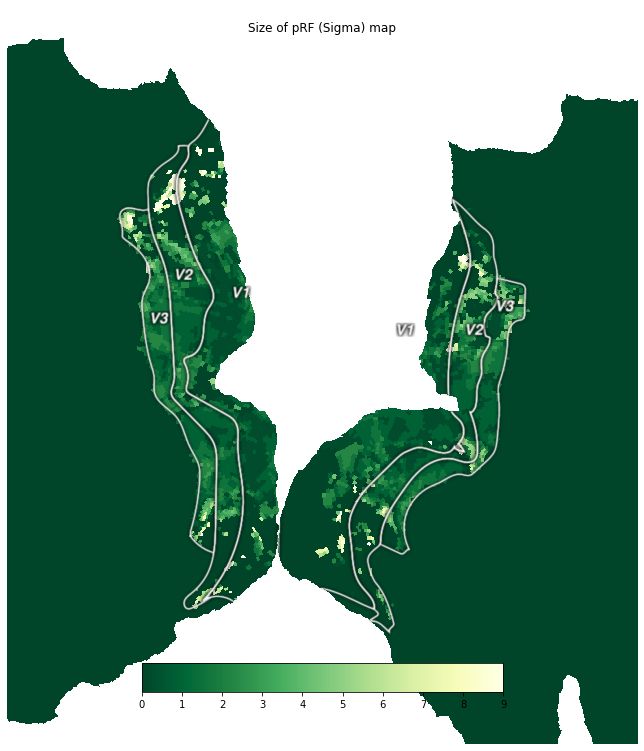

In [ ]:
# plot V1&V2&V3 size map and rsq map
voxels_v123, _ = ROI_tcs_v123.shape
x_y_s_v123 = zero_filling(voxels_v123, valid_index_v123, np.array([x0_v123, y0_v123, sigma_v123]).T)
output_v123, output_x0_v123, output_y0_v123 = expand_to_hemis(total_voxels, voxels_v123, roi_v123, x_y_s_v123.T)

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_v123), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '   Size of pRF (Sigma) map  for V1&V2&V3')
zoom_to_roi('hcp_999999')
 
output_rsq_v123 = expand_rsq_to_hemis(total_voxels, voxels_v123, roi_v123, rsqs_v123)

print(f'Range of rsq: 0 to {max(output_rsq_v123)}')
fig += 1
f2 = cx.quickshow(cx.Vertex(np.array(output_rsq_v123), subject='hcp_999999', cmap='hot', vmin=0, vmax=max(output_rsq_v123)));
f2.suptitle('Figure' + str(fig) + '  rsq map for V1&V2&V3')
zoom_to_roi('hcp_999999')

f = cx.quickshow(cx.Vertex(np.array(output_v123), subject='hcp_999999', cmap='YlGn_r', vmin=0, vmax=9));
f.suptitle('Size of pRF (Sigma) map')
zoom_to_roi('hcp_999999')

**Units**

Because of the organization of the visual system, we'll now want to convert the parameters of the best-fitting model from x0 and y0 to eccentricity and polar angle, as you saw in the Dumoulin 2008 paper. The functions to do this are given below: 

In [ ]:
# But working with polar coordinates is a bit hairy.
# The easiest way to go is through complex numbers. 
# you don't need to understand the following completely, 
# but you can use the code. It will also take arrays for 
# x0 and y0.

def angle(x0, y0):
    return np.angle(x0 + y0 * 1j)

def ecc(x0, y0):
    return np.abs(x0 + y0 * 1j)

Range of x0 is from -10 to 10.0
Range of y0 is from -10 to 10.0
Range of eccentricity is from 0.0 to 14.142135623730951
Range of angle is from -3.141592653589793 to 3.141592653589793
Failed to get connection
** (inkscape:4181): CRITICAL **: 09:03:24.729: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4181): CRITICAL **: 09:03:24.729: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4181): CRITICAL **: 09:03:24.729: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:4184): CRITICAL **: 09:03:27.301: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:4184): CRITICAL **: 09:03:27.301: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:4184): CRITICAL **: 09:03:27.301: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Failed to get connection
** (inkscape:4187): CRITICAL **: 09:03:30.366: dbus_g_pr

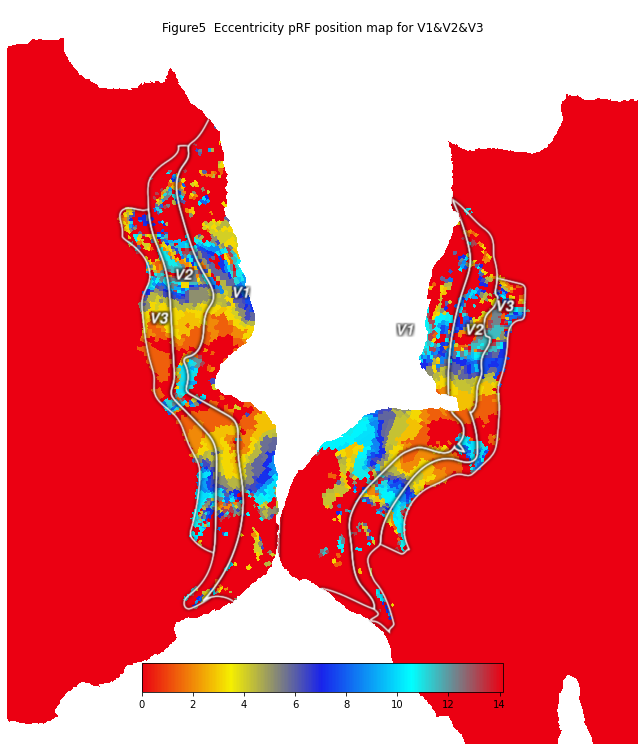

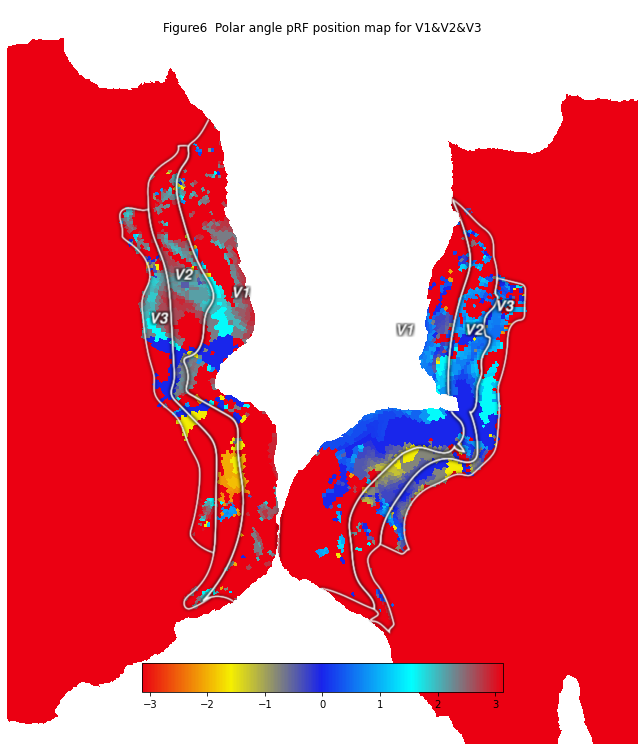

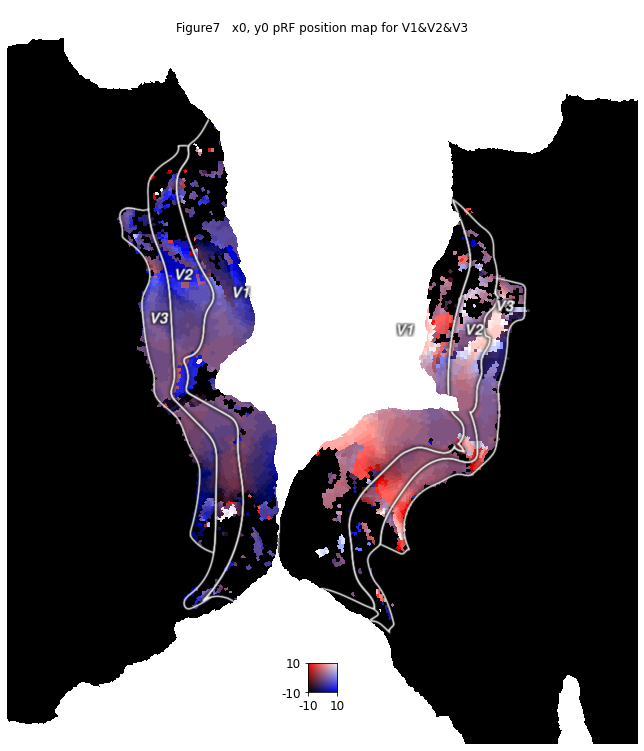

In [ ]:
output_eccs_v123 = ecc(np.array(output_x0_v123), np.array(output_y0_v123)) 
output_angles_v123 = angle(np.array(output_x0_v123), np.array(output_y0_v123))
threshold = angle(-10, -10)
output_angles_v123[output_angles_v123 <= threshold] = -np.pi

print(f"Range of x0 is from {min(output_x0_v123)} to {max(output_x0_v123)}")
print(f"Range of y0 is from {min(output_y0_v123)} to {max(output_y0_v123)}")
print(f"Range of eccentricity is from {min(output_eccs_v123)} to {max(output_eccs_v123)}")
print(f"Range of angle is from {min(output_angles_v123)} to {max(output_angles_v123)}")

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_eccs_v123), subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=min(output_eccs_v123), vmax=max(output_eccs_v123)));
f.suptitle('Figure' + str(fig) + '  Eccentricity pRF position map for V1&V2&V3')
f.set_facecolor('white')
zoom_to_roi('hcp_999999')

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_angles_v123), subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=min(output_angles_v123), vmax=max(output_angles_v123)));
f.suptitle('Figure' + str(fig) + '  Polar angle pRF position map for V1&V2&V3')
zoom_to_roi('hcp_999999')

fig += 1
f = cx.quickshow(cx.Vertex2D(np.array(output_y0_v123), np.array(output_x0_v123), subject='hcp_999999', cmap='RdBu_covar', vmin=-10, vmax=10, vmin2=-10, vmax2=10));  # RdBu_covar
f.suptitle('Figure' + str(fig) + '   x0, y0 pRF position map for V1&V2&V3')
f.set_facecolor('white')
zoom_to_roi('hcp_999999')


Extra figures for single V1 OR V2 OR V3 using for comparsion and analysis in discussion, but need to run this part code, because we will use the variable when plotting FIGURE 8

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [00:38<00:00, 88.60it/s]


rsqs shape:  (3375, 2939)
best_fitting_model: [1605 2077  435 ... 2460 2685 2910]
Count the rsq-less-than-0.15 voxels number is 1416
Valid index in the cortex [  22   31   33 ... 2836 2900 2912]
valid_index shape:  (1523,)
Valid   x0  in the cortex [  1.42857143   1.42857143  -2.85714286 ...   2.85714286 -10.
   2.85714286]
Valid   y0  in the cortex [ 4.28571429 -1.42857143 -1.42857143 ...  2.85714286  8.57142857
  1.42857143]
Valid sigma in the cortex [7.91071429 5.82142857 5.82142857 ... 5.125      0.25       1.64285714]


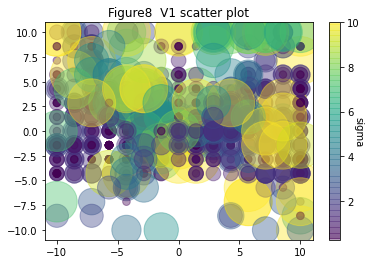

Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.910714285714286, 0, 0, 0, 0, 0, 0, 0, 0, 5.821428571428571, 0, 5.821428571428571, 7.2142857142857135, 9.303571428571429, 0, 0, 7.2142857142857135, 6.517857142857142, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 0, 0, 0, 0, 0.9464285714285714, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.9464285714285714, 1.6428571428571428, 1.6428571428571428, 1.6428571428571428, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.9464285714285714, 3.0357142857142856, 3.0357142857142856, 2.3392857142857144, 1.6428571428571428, 2.3392857142857144, 2.3392857142857144, 2.3392857142857144, 1.6428571428571428, 2.3392857142857144, 2.3392857142857144, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.25, 0.25, 0.9464285714285714, 2.3392857142857144, 2.3392857142857144, 2.3392857142857144, 1.6428571428571428, 2.33

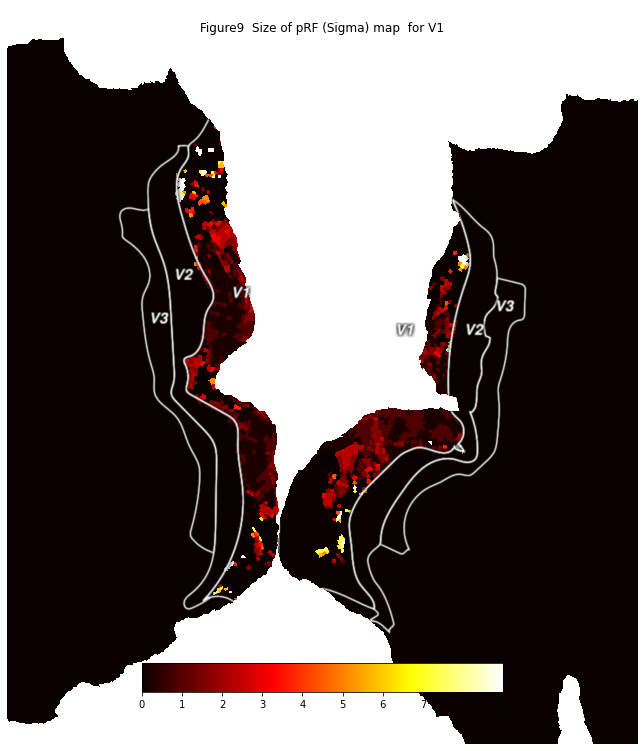

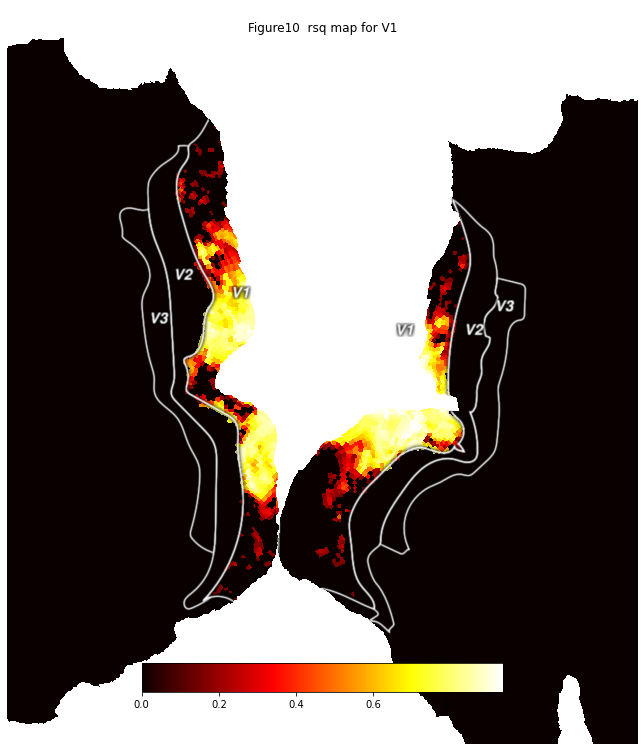

In [ ]:
# V1
roi_v1 = 'V1'

ROI_tcs_v1 = psc(tseries_raw[atlas_data_both_hemis == roi_index_dict[roi_v1]])
valid_index_v1, x0_v1, y0_v1, sigma_v1, rsqs_v1 = find_valid_voxel_information(ROI_tcs_v1, grid_model_timecourses_conv)

fig += 1
plot_scatter(x0_v1, y0_v1, sigma_v1, roi_v1, fig)

ecc_v1 = ecc(x0_v1, y0_v1)

# plot v1 size map
voxels_v1, _ = ROI_tcs_v1.shape
x_y_s_v1 = zero_filling(voxels_v1, valid_index_v1, np.array([x0_v1, y0_v1, sigma_v1]).T)
output_v1, _, _ = expand_to_hemis(total_voxels, voxels_v1, roi_v1, x_y_s_v1.T)

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_v1), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of pRF (Sigma) map  for V1')
zoom_to_roi('hcp_999999')
 
output_rsq_v1 = expand_rsq_to_hemis(total_voxels, voxels_v1, roi_v1, rsqs_v1)

print(f'Range of rsq: 0 to {max(output_rsq_v1)}')
fig += 1
f2 = cx.quickshow(cx.Vertex(np.array(output_rsq_v1), subject='hcp_999999', cmap='hot', vmin=0, vmax=max(output_rsq_v1)));
f2.suptitle('Figure' + str(fig) + '  rsq map for V1')
zoom_to_roi('hcp_999999')

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [00:28<00:00, 117.56it/s]


rsqs shape:  (3375, 2202)
best_fitting_model: [1412 3333 3135 ... 1365 1112 1112]
Count the rsq-less-than-0.15 voxels number is 768
Valid index in the cortex [   4    5    6 ... 2180 2196 2197]
valid_index shape:  (1434,)
Valid   x0  in the cortex [-4.28571429 -1.42857143 -2.85714286 ... 10.         10.
 10.        ]
Valid   y0  in the cortex [ 2.85714286  0.          2.85714286 ... -4.28571429 -4.28571429
 -4.28571429]
Valid sigma in the cortex [6.51785714 4.42857143 5.82142857 ... 0.25       0.94642857 0.25      ]


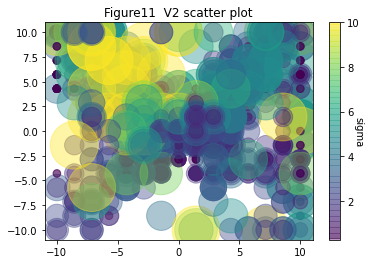

Sigma in zero_filling: [0, 0, 0, 0, 6.517857142857142, 4.428571428571429, 5.821428571428571, 7.2142857142857135, 0, 6.517857142857142, 5.125, 6.517857142857142, 8.607142857142858, 0, 0, 0, 10.0, 5.821428571428571, 4.428571428571429, 5.821428571428571, 6.517857142857142, 0, 0, 0, 0, 4.428571428571429, 7.910714285714286, 5.821428571428571, 5.821428571428571, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 0, 0, 0, 0, 0, 3.0357142857142856, 0, 0, 0, 0, 0, 0, 0.25, 0, 0.25, 0, 0, 0, 0, 0, 0, 4.428571428571429, 0.25, 0.25, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.6428571428571428, 1.6428571428571428, 1.6428571428571428, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 1.6428571428571428, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.25, 1.6428571428571428, 0.9464285714285714, 0.9464285714285714, 1.6428571428571428, 2.3392857142857144, 0.25, 0.9464285714285714, 1.6428571428571428, 1.6428571428571428, 1.64285714

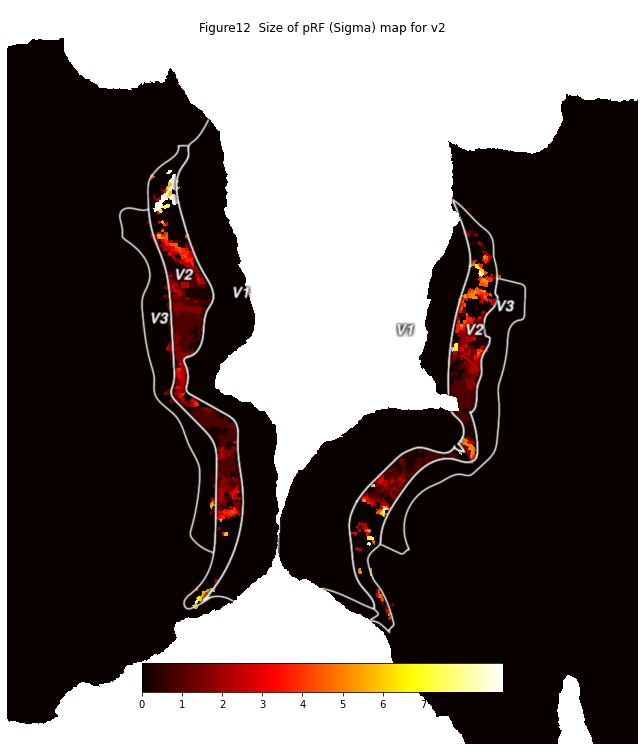

In [ ]:
# V2
roi_v2 = 'V2'

ROI_tcs_v2 = psc(tseries_raw[atlas_data_both_hemis == roi_index_dict[roi_v2]])
valid_index_v2, x0_v2, y0_v2, sigma_v2, _ = find_valid_voxel_information(ROI_tcs_v2, grid_model_timecourses_conv)

fig += 1
plot_scatter(x0_v2, y0_v2, sigma_v2, roi_v2, fig)

ecc_v2 = ecc(x0_v2, y0_v2)

# plot v2 size map
voxels_v2, _ = ROI_tcs_v2.shape
x_y_s_v2 = zero_filling(voxels_v2, valid_index_v2, np.array([x0_v2, y0_v2, sigma_v2]).T)
output_v2, _, _ = expand_to_hemis(total_voxels, voxels_v2, roi_v2, x_y_s_v2.T)

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_v2), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of pRF (Sigma) map for v2')
zoom_to_roi('hcp_999999')

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [00:20<00:00, 168.37it/s]


rsqs shape:  (3375, 1472)
best_fitting_model: [1669 1931 1675 ... 1907 1906 1924]
Count the rsq-less-than-0.15 voxels number is 205
Valid index in the cortex [   0    1    2 ... 1469 1470 1471]
valid_index shape:  (1267,)
Valid   x0  in the cortex [-1.42857143  1.42857143 -1.42857143 ...  0.          0.
  1.42857143]
Valid   y0  in the cortex [0.         1.42857143 0.         ... 1.42857143 1.42857143 1.42857143]
Valid sigma in the cortex [3.03571429 7.91071429 7.21428571 ... 1.64285714 0.94642857 3.03571429]


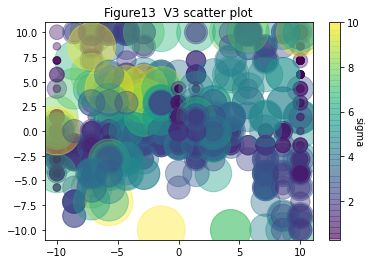

In [ ]:
# V3
roi_v3 = 'V3'

ROI_tcs_v3 = psc(tseries_raw[atlas_data_both_hemis == roi_index_dict[roi_v3]])

valid_index_v3, x0_v3, y0_v3, sigma_v3, _ = find_valid_voxel_information(ROI_tcs_v3, grid_model_timecourses_conv)

fig += 1
plot_scatter(x0_v3, y0_v3, sigma_v3, roi_v3, fig)

ecc_v3 = ecc(x0_v3, y0_v3)

FIGURE 8

In [ ]:
#######################################################
def data_processing(ecc, sigma):
    arr = np.vstack((ecc, sigma)).T
    ecc_max = round(max(ecc))
    ecc_range = list(range(ecc_max+1))
    sigma_arr = [[] for m in range(ecc_max+1)]
    for i in arr:
        id = round(i[0])
        sigma_arr[id].append(i[1])
    sigma_mean = [0]*len(sigma_arr)
    sigma_std = [0]*len(sigma_arr)
    for count, value in enumerate(sigma_arr):
        if ~np.isnan(np.mean(value)):
          sigma_mean[count] = np.mean(value)
          sigma_std[count] = np.std(value)
        else:
          print("nan!!!!!!!!!!!!!!!!")
          sigma_mean[count] = 0.0
          sigma_std[count] = 0.0
    invalid = np.argwhere(np.array(sigma_mean) < 0.21)
    
    sigma_mean = np.delete(sigma_mean, invalid)
    sigma_std = np.delete(sigma_std, invalid)
    ecc_range = np.delete(ecc_range, invalid)

    return ecc_range, sigma_mean, sigma_std

def linear_regression(x, y):
    # Fit linear regression via least squares with numpy.polyfit
    # It returns an slope (b) and intercept (a)
    # deg=1 means linear fit (i.e. polynomial of degree 1)
    b, a = np.polyfit(x, y, deg=1)
    return a, b

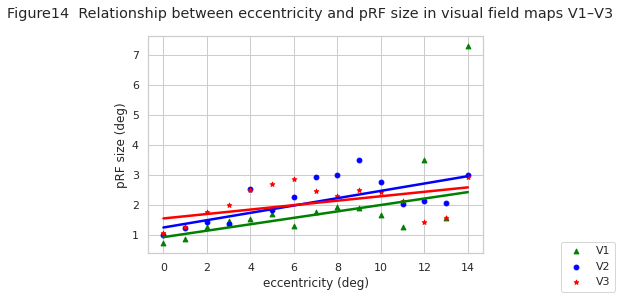

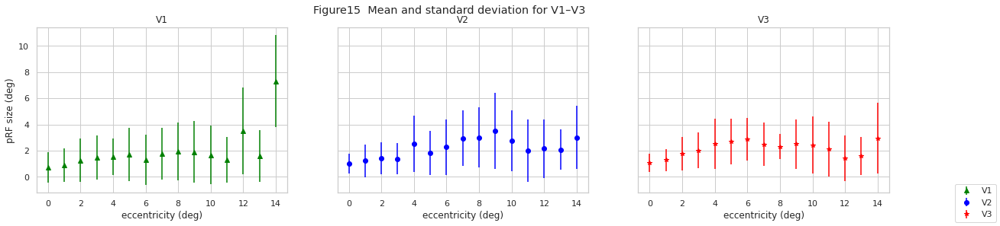

In [ ]:
sns.set_theme(style="whitegrid")

ecc_range_v1, sigma_mean_v1, sigma_std_v1 = data_processing(ecc_v1, sigma_v1)
ecc_range_v2, sigma_mean_v2, sigma_std_v2 = data_processing(ecc_v2, sigma_v2)
ecc_range_v3, sigma_mean_v3, sigma_std_v3 = data_processing(ecc_v3, sigma_v3)


figure = plt.figure()
ax = figure.add_subplot(111)

ax.scatter(ecc_range_v1, sigma_mean_v1, s=23, marker='^', c="green", label='V1')
ax.scatter(ecc_range_v2, sigma_mean_v2, s=23, marker='o', c="blue", label='V2')
ax.scatter(ecc_range_v3, sigma_mean_v3, s=23, marker='*', c="red", label='V3')

#create scatterplot with regression line
# sns.regplot(ecc_v1, sigma_v1, ci=None)
# sns.regplot(ecc_v2, sigma_v2, ci=None)
# sns.regplot(ecc_v3, sigma_v3, ci=None)

a_v1, b_v1 = linear_regression(ecc_v1, sigma_v1)
# Plot regression line
ax.plot((np.array(ecc_range_v1).astype(int)), a_v1 + b_v1 * (np.array(ecc_range_v1).astype(int)), color="green", lw=2.5);

a_v2, b_v2 = linear_regression(ecc_v2, sigma_v2)
# Plot regression line
ax.plot((np.array(ecc_range_v2).astype(int)), a_v2 + b_v2 * (np.array(ecc_range_v2).astype(int)), color="blue", lw=2.5);

a_v3, b_v3 = linear_regression(ecc_v3, sigma_v3)
# Plot regression line
ax.plot((np.array(ecc_range_v3).astype(int)), a_v3 + b_v3 * (np.array(ecc_range_v3).astype(int)), color="red", lw=2.5);



# plt.xticks([])
ax.set_xlabel("eccentricity (deg)")
ax.set_ylabel("pRF size (deg)")

figure.legend(loc='lower right')
fig = 14
figure.suptitle('Figure' + str(fig) + '  Relationship between eccentricity and pRF size in visual field maps V1–V3')


fig2, axs = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(20, 4))
# axs[0, 0].plot(x, y)
# axs[0, 0].set_title('Axis [0, 0]')
# axs[0, 1].plot(x, y, 'tab:orange')
# axs[0, 1].set_title('Axis [0, 1]')
# axs[1, 0].plot(x, -y, 'tab:green')
# axs[1, 0].set_title('Axis [1, 0]')
# axs[1, 1].plot(x, -y, 'tab:red')
# axs[1, 1].set_title('Axis [1, 1]')

axs[0].errorbar(ecc_range_v1, sigma_mean_v1, sigma_std_v1, linestyle='None', marker='^', c="green", label='V1')
axs[0].set_title('V1')
axs[1].errorbar(ecc_range_v2, sigma_mean_v2, sigma_std_v2, linestyle='None', marker='o', c="blue", label='V2')
axs[1].set_title('V2')
axs[2].errorbar(ecc_range_v3, sigma_mean_v3, sigma_std_v3, linestyle='None', marker='*', c="red", label='V3')
axs[2].set_title('V3')

for ax in axs.flat:
    ax.set(xlabel='eccentricity (deg)', ylabel='pRF size (deg)')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

fig2.legend(loc='lower right')
fig += 1
fig2.suptitle('Figure' + str(fig) + '  Mean and standard deviation for V1–V3')

plt.show()

# QUESTION **1**

In [ ]:
# roi_index_dict = {
#     # low-level visual:
#     'V1': 1, 'V2': 4, 'V3': 5,
#     # mid-level and high-level visual:
#     'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
#     'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159,
#     'AV': -7
#     }

atlas_data_both_hemis_av = np.mod(atlas_data, 180)

total_voxels, = atlas_data.shape # 118584

all_visual = [1, 2, 4, 5, 10, 13, 17, 19, 20, 21, 23, 48, 49, 95, 159]

for i in range(total_voxels):
  if atlas_data_both_hemis_av[i] in all_visual:
    atlas_data_both_hemis_av[i] = -7

roi_av = 'AV'

ROI_tcs_av = psc(tseries_raw[atlas_data_both_hemis_av == roi_index_dict[roi_av]])

valid_index_av, x0_av, y0_av, sigma_av, rsqs_av = find_valid_voxel_information(ROI_tcs_av, grid_model_timecourses_conv)

ecc_av = ecc(x0_av, y0_av)

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [03:43<00:00, 15.10it/s]


rsqs shape:  (3375, 10881)
best_fitting_model: [2253 1605 2077 ... 2339 2564 2354]
Count the rsq-less-than-0.15 voxels number is 2724
Valid index in the cortex [    0    27    31 ... 10878 10879 10880]
valid_index shape:  (8157,)
Valid   x0  in the cortex [-10.           1.42857143  -4.28571429 ...  -2.85714286  -2.85714286
  -1.42857143]
Valid   y0  in the cortex [4.28571429 4.28571429 2.85714286 ... 4.28571429 5.71428571 4.28571429]
Valid sigma in the cortex [ 2.33928571  7.91071429  6.51785714 ... 10.         10.
 10.        ]


roi size map angle map and eccentricity map for all visual cortex

Sigma in zero_filling: [2.3392857142857144, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7.910714285714286, 0, 0, 0, 6.517857142857142, 0, 0, 0, 0, 4.428571428571429, 5.821428571428571, 7.2142857142857135, 0, 5.821428571428571, 0, 5.821428571428571, 7.2142857142857135, 9.303571428571429, 0, 6.517857142857142, 5.125, 6.517857142857142, 8.607142857142858, 0, 0, 0, 0, 0, 7.2142857142857135, 6.517857142857142, 0, 10.0, 5.821428571428571, 4.428571428571429, 5.821428571428571, 6.517857142857142, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 4.428571428571429, 7.910714285714286, 5.821428571428571, 5.821428571428571, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3.0357142857142856, 0, 0, 0, 0, 0, 0, 0.25, 0, 0.25, 0, 0, 0, 0, 0, 0, 0, 4.428571428571429, 0.25, 0.25, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0.25, 0.25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 0, 0, 0, 0, 0, 0, 10.0, 7.2142857142857135, 

Text(0.5, 0.98, 'Figure18  Eccentricity map for all visual (Q1)')

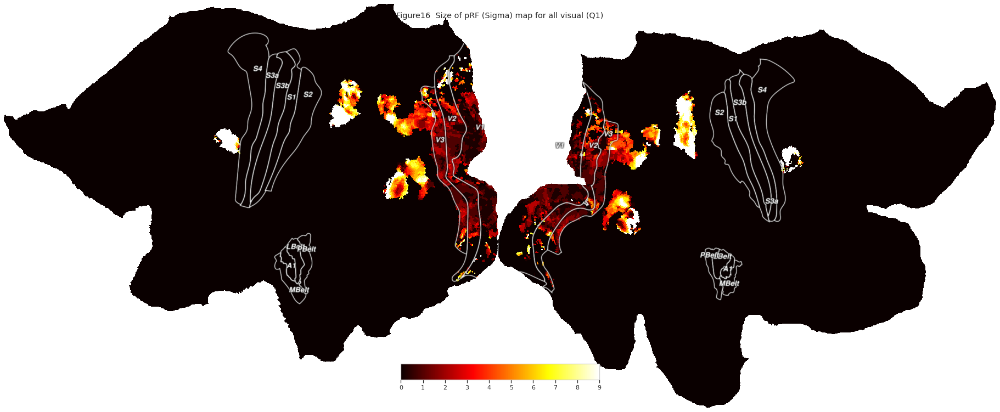

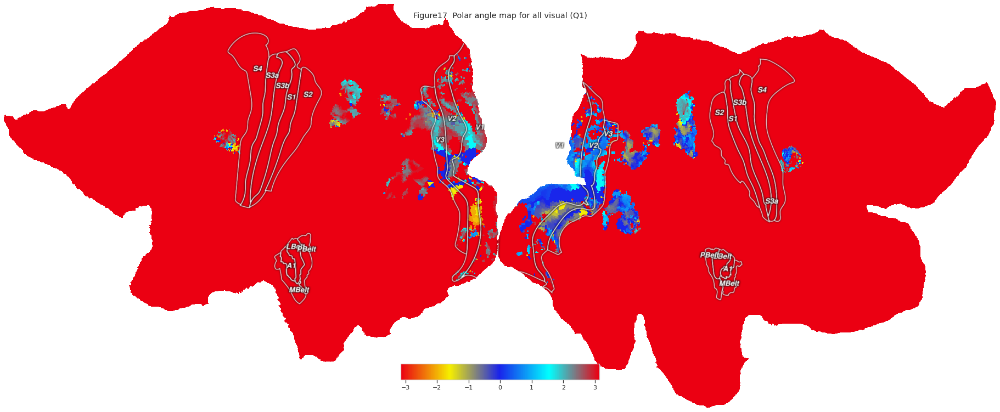

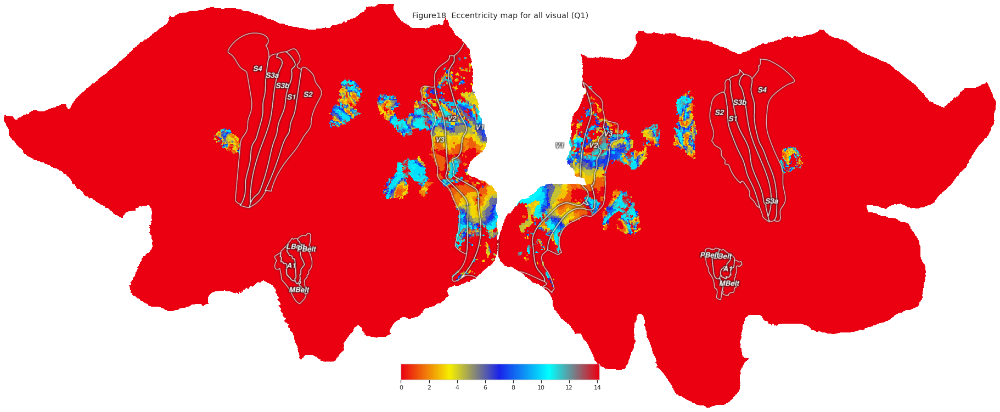

In [ ]:
# plot all visual roi size map
voxels_av, _ = ROI_tcs_av.shape
x_y_s_av = zero_filling(voxels_av, valid_index_av, np.array([x0_av, y0_av, sigma_av]).T)
output_av, output_x0_av, output_y0_av = expand_to_hemis(total_voxels, voxels_av, roi_av, x_y_s_av.T)

fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_av), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of pRF (Sigma) map for all visual (Q1)')
# zoom_to_roi('hcp_999999')

# plot the angle map
output_angles_av = angle(np.array(output_x0_av), np.array(output_y0_av))
threshold = angle(-10, -10)
output_angles_av[output_angles_av <= threshold] = -np.pi
fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_angles_av), subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=min(output_angles_av), vmax=max(output_angles_av)));
f.suptitle('Figure' + str(fig) + '  Polar angle map for all visual (Q1)')

# plot the eccentricity map
output_ecc_av = ecc(np.array(output_x0_av), np.array(output_y0_av))
fig += 1
f = cx.quickshow(cx.Vertex(np.array(output_ecc_av), subject='hcp_999999', cmap='Retinotopy_RYBCR', vmin=min(output_ecc_av), vmax=max(output_ecc_av)));
f.suptitle('Figure' + str(fig) + '  Eccentricity map for all visual (Q1)')

Figure 8 advanced

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


nan!!!!!!!!!!!!!!!!


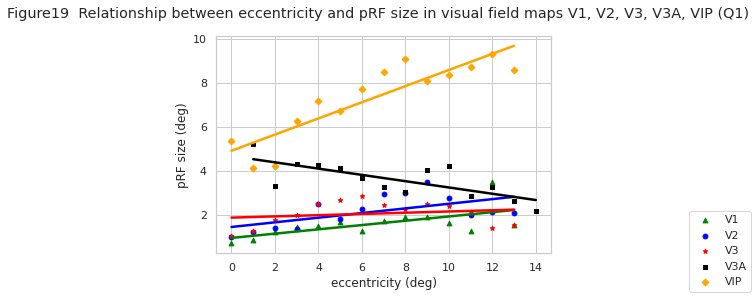

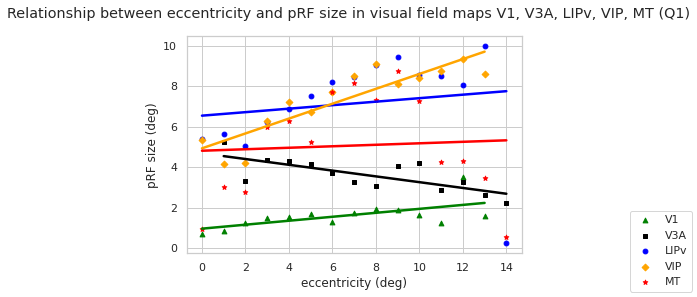

In [ ]:
# from networkx.algorithms.distance_measures import eccentricity
# We only plot seven roi we selected
visual_list = ['V1', 'V2', 'V3', 'V3A', 'V3B', 'IPS1', 'LIPv', 'LIPd', 'VIP', 'FEF', 'MST', 'MT', 'LO1', 'LO2', 'LO3']

for l in visual_list:
  name = l + "_index"
  locals()[l + "_index"] = []

for i in range(total_voxels):
  for li in visual_list:
    if atlas_data_both_hemis[i] == roi_index_dict[li]:
     locals()[li + "_index"].append(i)

output_ecc_av = ecc(np.array(output_x0_av), np.array(output_y0_av))

ecc_range_v1, sigma_mean_v1, sigma_std_v1 = data_processing(np.array(output_ecc_av)[V1_index], np.array(output_av)[V1_index])
ecc_range_v2, sigma_mean_v2, sigma_std_v2 = data_processing(np.array(output_ecc_av)[V2_index], np.array(output_av)[V2_index])
ecc_range_v3, sigma_mean_v3, sigma_std_v3 = data_processing(np.array(output_ecc_av)[V3_index], np.array(output_av)[V3_index])
ecc_range_v3A, sigma_mean_v3A, sigma_std_v3A = data_processing(np.array(output_ecc_av)[V3A_index], np.array(output_av)[V3A_index])
ecc_range_LIPv, sigma_mean_LIPv, sigma_std_LIPv = data_processing(np.array(output_ecc_av)[LIPv_index], np.array(output_av)[LIPv_index])
ecc_range_VIP, sigma_mean_VIP, sigma_std_VIP = data_processing(np.array(output_ecc_av)[VIP_index], np.array(output_av)[VIP_index])
ecc_range_MT, sigma_mean_MT, sigma_std_MT = data_processing(np.array(output_ecc_av)[MT_index], np.array(output_av)[MT_index])

figure = plt.figure()
ax = figure.add_subplot(111)

ax.scatter(ecc_range_v1, sigma_mean_v1, s=23, marker='^', c="green", label='V1')
ax.scatter(ecc_range_v2, sigma_mean_v2, s=23, marker='o', c="blue", label='V2')
ax.scatter(ecc_range_v3, sigma_mean_v3, s=23, marker='*', c="red", label='V3')
ax.scatter(ecc_range_v3A, sigma_mean_v3A, s=23, marker='s', c="black", label='V3A')
ax.scatter(ecc_range_VIP, sigma_mean_VIP, s=23, marker='D', c="orange", label='VIP')

a_v1, b_v1 = linear_regression(ecc_range_v1, sigma_mean_v1)
# Plot regression line
ax.plot((np.array(ecc_range_v1).astype(int)), a_v1 + b_v1 * (np.array(ecc_range_v1).astype(int)), color="green", lw=2.5);

a_v2, b_v2 = linear_regression(ecc_range_v2, sigma_mean_v2)
# Plot regression line
ax.plot((np.array(ecc_range_v2).astype(int)), a_v2 + b_v2 * (np.array(ecc_range_v2).astype(int)), color="blue", lw=2.5);

a_v3, b_v3 = linear_regression(ecc_range_v3, sigma_mean_v3)
# Plot regression line
ax.plot((np.array(ecc_range_v3).astype(int)), a_v3 + b_v3 * (np.array(ecc_range_v3).astype(int)), color="red", lw=2.5);

a_v3A, b_v3A = linear_regression(ecc_range_v3A, sigma_mean_v3A)
# Plot regression line
ax.plot((np.array(ecc_range_v3A).astype(int)), a_v3A + b_v3A * (np.array(ecc_range_v3A).astype(int)), color="black", lw=2.5);

a_VIP, b_VIP = linear_regression(ecc_range_VIP, sigma_mean_VIP)
# Plot regression line
ax.plot((np.array(ecc_range_VIP).astype(int)), a_VIP + b_VIP * (np.array(ecc_range_VIP).astype(int)), color="orange", lw=2.5);

# plt.xticks([])
ax.set_xlabel("eccentricity (deg)")
ax.set_ylabel("pRF size (deg)")

fig = 19
figure.legend(loc='lower right')
figure.suptitle('Figure' + str(fig) + '  Relationship between eccentricity and pRF size in visual field maps V1, V2, V3, V3A, VIP (Q1)')



fig2 = plt.figure()
ax2 = fig2.add_subplot(111)

ax2.scatter(ecc_range_v1, sigma_mean_v1, s=23, marker='^', c="green", label='V1')
ax2.scatter(ecc_range_v3A, sigma_mean_v3A, s=23, marker='s', c="black", label='V3A')
ax2.scatter(ecc_range_LIPv, sigma_mean_LIPv, s=23, marker='o', c="blue", label='LIPv')
ax2.scatter(ecc_range_VIP, sigma_mean_VIP, s=23, marker='D', c="orange", label='VIP')
ax2.scatter(ecc_range_MT, sigma_mean_MT, s=23, marker='*', c="red", label='MT')

a_v1, b_v1 = linear_regression(ecc_range_v1, sigma_mean_v1)
# Plot regression line
ax2.plot((np.array(ecc_range_v1).astype(int)), a_v1 + b_v1 * (np.array(ecc_range_v1).astype(int)), color="green", lw=2.5);

a_v3A, b_v3A = linear_regression(ecc_range_v3A, sigma_mean_v3A)
# Plot regression line
ax2.plot((np.array(ecc_range_v3A).astype(int)), a_v3A + b_v3A * (np.array(ecc_range_v3A).astype(int)), color="black", lw=2.5);

a_LIPv, b_LIPv = linear_regression(ecc_range_LIPv, sigma_mean_LIPv)
# Plot regression line
ax2.plot((np.array(ecc_range_LIPv).astype(int)), a_LIPv + b_LIPv * (np.array(ecc_range_LIPv).astype(int)), color="blue", lw=2.5);

a_VIP, b_VIP = linear_regression(ecc_range_VIP, sigma_mean_VIP)
# Plot regression line
ax2.plot((np.array(ecc_range_VIP).astype(int)), a_VIP + b_VIP * (np.array(ecc_range_VIP).astype(int)), color="orange", lw=2.5);

a_MT, b_MT = linear_regression(ecc_range_MT, sigma_mean_MT)
# Plot regression line
ax2.plot((np.array(ecc_range_MT).astype(int)), a_MT + b_MT * (np.array(ecc_range_MT).astype(int)), color="red", lw=2.5);

# plt.xticks([])
ax2.set_xlabel("eccentricity (deg)")
ax2.set_ylabel("pRF size (deg)")

fig2.legend(loc='lower right')
fig2.suptitle('Relationship between eccentricity and pRF size in visual field maps V1, V3A, LIPv, VIP, MT (Q1)')

plt.show()

# **QUESTION** 2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in true_divide
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app
  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [27:18<00:00,  2.06it/s]


rsqs shape:  (3375, 118584)
best_fitting_model: [1469 3268 2159 ...  315   78 2108]
Count the rsq-less-than-0.15 voxels number is 62896
Valid index in the cortex [     0      1      2 ... 118573 118576 118577]
valid_index shape:  (55688,)
Valid   x0  in the cortex [ 0.          0.          1.42857143 ... -1.42857143 -1.42857143
  2.85714286]
Valid   y0  in the cortex [-1.42857143 10.          2.85714286 ...  4.28571429  7.14285714
  1.42857143]
Valid sigma in the cortex [10.          9.30357143 10.         ... 10.         10.
 10.        ]
Failed to get connection
** (inkscape:5887): CRITICAL **: 12:50:18.152: dbus_g_proxy_new_for_name: assertion 'connection != NULL' failed
** (inkscape:5887): CRITICAL **: 12:50:18.153: dbus_g_proxy_call: assertion 'DBUS_IS_G_PROXY (proxy)' failed
** (inkscape:5887): CRITICAL **: 12:50:18.153: dbus_g_connection_register_g_object: assertion 'connection != NULL' failed
Sigma in zero_filling: [10.0, 9.303571428571429, 10.0, 10.0, 2.3392857142857144, 10.0,

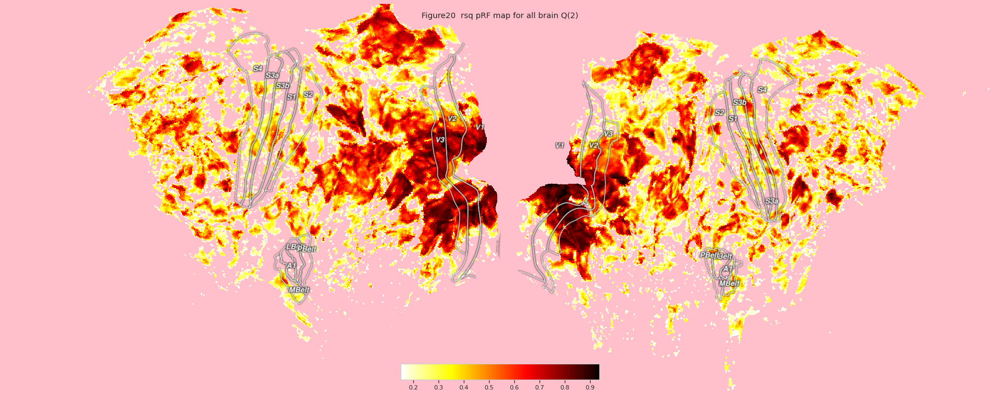

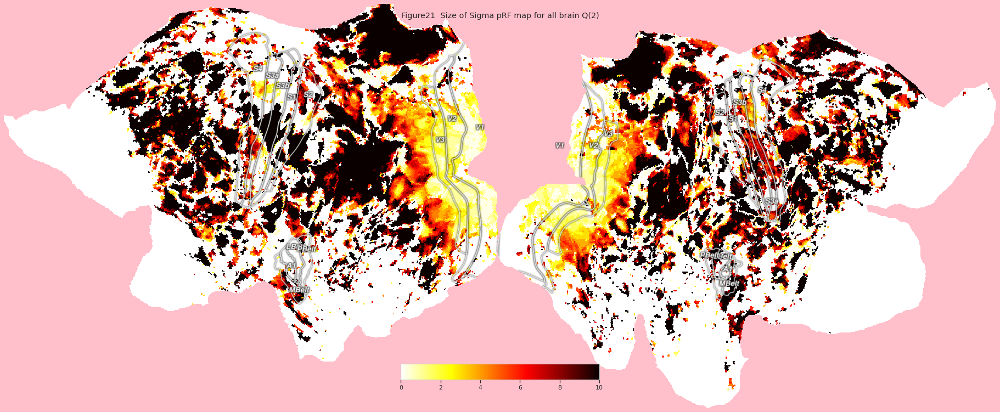

In [ ]:
# All brain
valid_index_ab, x0_ab, y0_ab, sigma_ab, rsqs_ab = find_valid_voxel_information(psc(tseries_raw), grid_model_timecourses_conv)

# rsqs_ab = np.array([rsq_for_model(psc(tseries_raw), mtcs) for mtcs in (grid_model_timecourses_conv)])
# bfms_ab = np.max(rsqs_ab, axis=0)
# print(max(bfms_ab))
# print(min(bfms_ab))
fig += 1
f = cx.quickshow(cx.Vertex(rsqs_ab, subject='hcp_999999', cmap='hot_r', vmin=0.15, vmax=max(rsqs_ab)));
# f = cx.quickshow(cx.Vertex(np.array(output_ab), subject='hcp_999999', cmap='hot', vmin=0, vmax=10));
f.suptitle('Figure' + str(fig) + '  rsq pRF map for all brain Q(2)')
f.set_facecolor('pink')

# zero-fill to non-valid cortex
voxels_ab, _ = tseries_raw.shape
x_y_s_ab = zero_filling(voxels_ab, valid_index_ab, np.array([x0_ab, y0_ab, sigma_ab]).T)
# output_ab = expand_to_hemis(total_voxels, voxels_ab, 'AB', x_y_s_ab.T)

fig += 1
f = cx.quickshow(cx.Vertex(x_y_s_ab[2], subject='hcp_999999', cmap='hot_r', vmin=0, vmax=10));
# f = cx.quickshow(cx.Vertex(np.array(output_ab), subject='hcp_999999', cmap='hot', vmin=0, vmax=10));
f.suptitle('Figure' + str(fig) + '  Size of Sigma pRF map for all brain Q(2)')
f.set_facecolor('pink')

# **QUESTION** 3

https://nbviewer.org/github/fabianp/hrf_estimation/blob/master/examples/hrf_estimation%20example.ipynb

HRF estimation based on V1, V2 and V3

In [ ]:
import hrf_estimation as he

def hrf_estimation(voxels, tr = 1.5):
    """
    Parameters
    ----------
    voxels : numpy.ndarray
        1D or 2D, containing single time-course or multiple
    tr : float
        Scan repeat time, in seconds.
    Returns 
    -------
    hrfs : numpy.ndarray
        Estimate hrf with three dimension
    betas : numpy.ndarray

    """
    print('You are running hrf_estimation version %s' % he.__version__)

    voxels = voxels.T
    ### perform detrending: Savitzky-Golay filter
    n_voxels = voxels.shape[-1]
    voxels = voxels - he.savitzky_golay.savgol_filter(voxels, 91, 3, axis=0)
    voxels /= voxels.std(axis=0)
    print("Performed detrending of the BOLD timecourse using a Savitzky-Golay filter")

    # plot one voxel
    plt.figure(figsize=(18, 6))
    plt.plot(voxels[:2 * 672, 0], lw=2)
    plt.xlabel('Timecourse (in seconds)')
    plt.show()

    # we construct the matrix of drifts as the matrix of ones that account for
    # the intercept term. If you have drifts estimated by e.g. SPM you can add
    # them here.
    drifts = np.ones((voxels.shape[0], 1))

    # we call he.glm with our data and a TR of 1 second. This will return the 
    # estimated HRF and the 
    # we also specify the basis function for the HRF estimation
    hrfs, betas = he.glm(tr, -tr/2, 1, voxels, drifts=drifts, mode='r1glm', basis='3hrf', verbose=1)
    return hrfs, betas

def generated_hrf(hrfs, t=30):
    xx = np.linspace(0, t) # range of values for time
    # construct the final HRF by multiplying by its basis
    generated_hrfs = hrfs[0] * he.hrf.spmt(xx)[:, None] + hrfs[1] * he.hrf.dspmt(xx)[:, None] + hrfs[2] * he.hrf.ddspmt(xx)[:, None]

    generated_hrfs = generated_hrfs.mean(1)[np.newaxis,:]

    plt.figure(figsize=(12, 6))
    plt.plot(xx, generated_hrfs.T)
    plt.ylim((-.5, 1.))
    plt.suptitle('Figure 27   Our haemodynamic response function')
    plt.xlabel('Time [s]')
    plt.show()
    return generated_hrfs

You are running hrf_estimation version 1.1
Performed detrending of the BOLD timecourse using a Savitzky-Golay filter


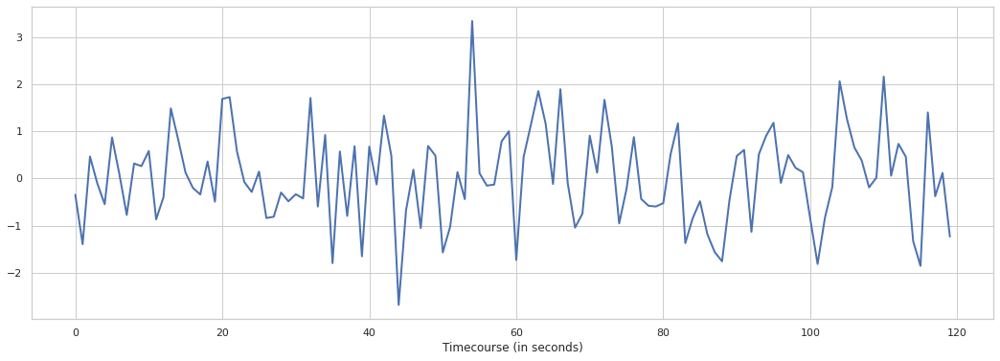

.. creating design matrix ..
.. done creating design matrix ..
.. computing initialization ..
.. done initialization ..
.. completed 500 out of 6613 ..
.. completed 1000 out of 6613 ..
.. completed 1500 out of 6613 ..
.. completed 2000 out of 6613 ..
.. completed 2500 out of 6613 ..
.. completed 3000 out of 6613 ..
.. completed 3500 out of 6613 ..
.. completed 4000 out of 6613 ..
.. completed 4500 out of 6613 ..
.. completed 5000 out of 6613 ..
.. completed 5500 out of 6613 ..
.. completed 6000 out of 6613 ..
.. completed 6500 out of 6613 ..


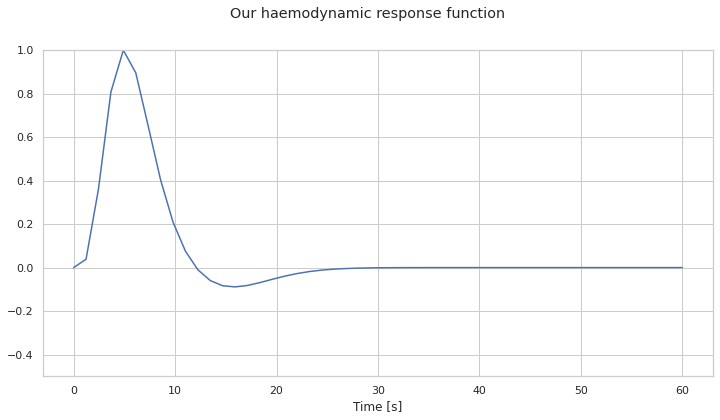

In [ ]:
roi_v123 = 'V123'

ROI_tcs_v123 = psc(tseries_raw[atlas_data_both_hemis_v123 == roi_index_dict[roi_v123]])

hrfs, _ = hrf_estimation(ROI_tcs_v123)

hrf_v123 = generated_hrf(hrfs, 60)

grid_model_timecourses_conv_v123 = sp.signal.fftconvolve(grid_model_timecourses, hrf_v123, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]


  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [02:08<00:00, 26.17it/s]


rsqs shape:  (3375, 6613)
best_fitting_model: [1620 1620  435 ... 1351  149  211]
Count the rsq-less-than-0.15 voxels number is 2362
Valid index in the cortex [  16   26   30 ... 6595 6607 6608]
valid_index shape:  (4251,)
Valid   x0  in the cortex [ 10.           1.42857143  -2.85714286 ...   1.42857143 -10.
  10.        ]
Valid   y0  in the cortex [10.          4.28571429  2.85714286 ...  1.42857143 -4.28571429
 -4.28571429]
Valid sigma in the cortex [0.25       5.125      4.42857143 ... 1.64285714 0.25       0.25      ]
Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.25, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.125, 0, 0, 0, 4.428571428571429, 0, 0, 0, 0, 0, 3.7321428571428568, 5.125, 0, 3.0357142857142856, 0, 4.428571428571429, 4.428571428571429, 0, 0, 0.9464285714285714, 1.6428571428571428, 3.7321428571428568, 4.428571428571429, 0, 0, 0, 0, 0, 5.125, 4.428571428571429, 0, 5.125, 1.6428571428571428, 1.6428571428571428, 2.3392857142857144, 3.7321428571428568, 0, 0, 0, 

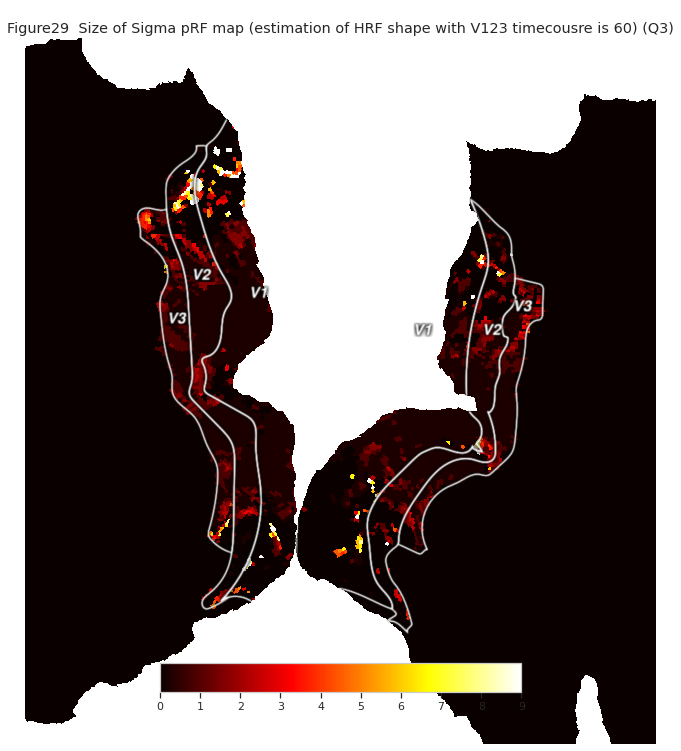

In [ ]:
valid_index_v123_hrf, x0_v123_hrf, y0_v123_hrf, sigma_v123_hrf, rsqs_v123_hrf = find_valid_voxel_information(ROI_tcs_v123, grid_model_timecourses_conv_v123)
# plot v123 size map
voxels_v123, _ = ROI_tcs_v123.shape
x_y_s_v123_hrf = zero_filling(voxels_v123, valid_index_v123_hrf, np.array([x0_v123_hrf, y0_v123_hrf, sigma_v123_hrf]).T)
output_v123_hrf, _, _ = expand_to_hemis(total_voxels, voxels_v123, roi_v123, x_y_s_v123_hrf.T)

fig = 29
f = cx.quickshow(cx.Vertex(np.array(output_v123_hrf), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of Sigma pRF map (estimation of HRF shape with V123 timecousre is 60) (Q3)')
zoom_to_roi('hcp_999999')

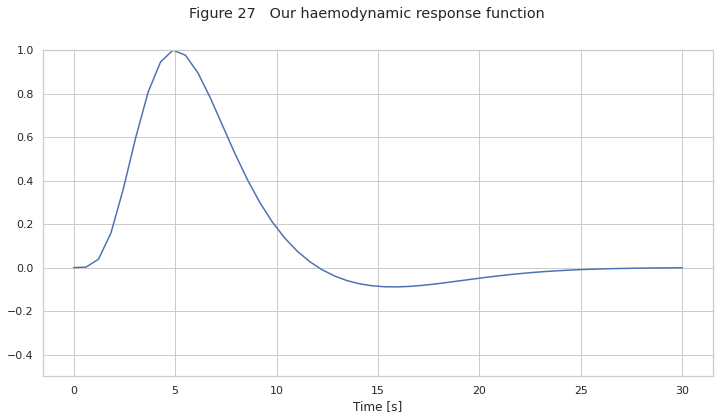

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [02:11<00:00, 25.61it/s]


rsqs shape:  (3375, 6613)
best_fitting_model: [3240 3225 1110 ... 1427 3337 3369]
Count the rsq-less-than-0.15 voxels number is 5406
Valid index in the cortex [  30   36   37 ... 6606 6611 6612]
valid_index shape:  (1207,)
Valid   x0  in the cortex [-10.         -10.         -10.         ...  10.           7.14285714
  10.        ]
Valid   y0  in the cortex [10.          2.85714286 10.         ...  2.85714286 10.
 10.        ]
Valid sigma in the cortex [8.60714286 7.21428571 5.82142857 ... 8.60714286 5.125      6.51785714]
Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8.607142857142858, 0, 0, 0, 0, 0, 7.2142857142857135, 5.821428571428571, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.125, 5.125, 3.7321428571428568, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.125, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.9464285714285714, 2.33928571

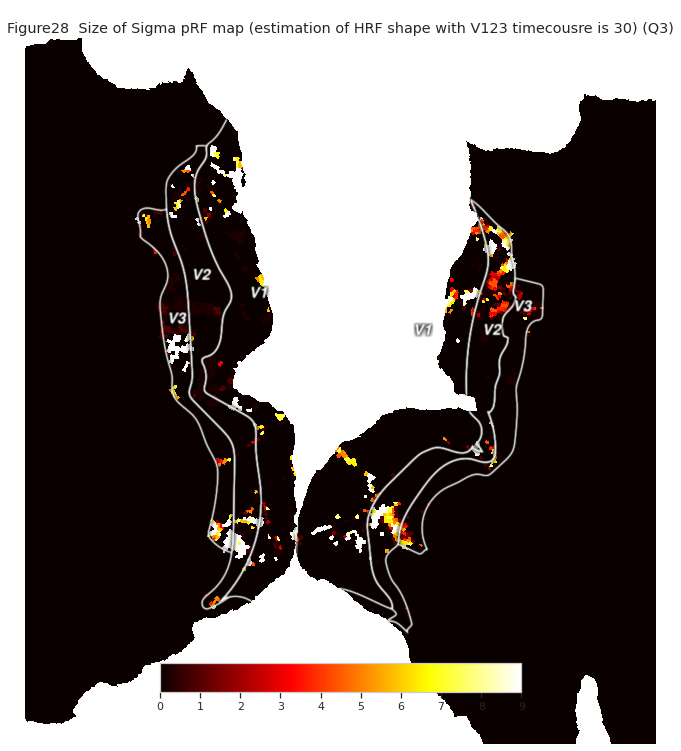

In [ ]:
hrf_v123_2 =  generated_hrf(hrfs, 30)
grid_model_timecourses_conv_v123_2 = sp.signal.fftconvolve(grid_model_timecourses, hrf_v123_2, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]
valid_index_v123_hrf_2, x0_v123_hrf_2, y0_v123_hrf_2, sigma_v123_hrf_2, rsqs_v123_hrf_2 = find_valid_voxel_information(ROI_tcs_v123, grid_model_timecourses_conv_v123_2)
# plot v123 size map
voxels_v123, _ = ROI_tcs_v123.shape
x_y_s_v123_hrf_2 = zero_filling(voxels_v123, valid_index_v123_hrf_2, np.array([x0_v123_hrf_2, y0_v123_hrf_2, sigma_v123_hrf_2]).T)
output_v123_hrf_2, _, _ = expand_to_hemis(total_voxels, voxels_v123, roi_v123, x_y_s_v123_hrf_2.T)

fig = 28
f = cx.quickshow(cx.Vertex(np.array(output_v123_hrf_2), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of Sigma pRF map (estimation of HRF shape with V123 timecousre is 30) (Q3)')
zoom_to_roi('hcp_999999')

Index in expand_to_hemis: [135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 2739, 2740, 2765, 2766, 2767, 2790, 2791, 2792, 2814, 2815, 2816, 2817, 2825, 2837, 2838, 2839, 2840, 2845, 2846, 2848, 2859, 2860, 2861, 2862, 2863, 2864, 2865, 2866, 2867, 2868, 2869, 2870, 2871, 2872, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2919, 2920, 2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2937, 2938, 2939, 2940, 2941, 2942, 2943, 2944, 2945, 2946, 2947, 2948, 2954, 2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965, 2970, 2971, 2972, 2973, 2974, 2975, 2976, 2977, 2978, 2985, 2986, 2987, 2988, 2999, 3000, 3001, 3012, 3013, 3024, 21380, 21381, 21382, 21383, 21384, 21385, 21386, 21387, 22487, 22545, 22603, 22716, 22717, 22771, 22825, 42043, 42044, 42045, 42046, 42047, 42048, 42049, 42050, 42051, 42052, 42053,

Text(0.5, 0.98, 'Figure26   Cross-validation accuracy for standard hrf and V123 fitted hrf Q(3)')

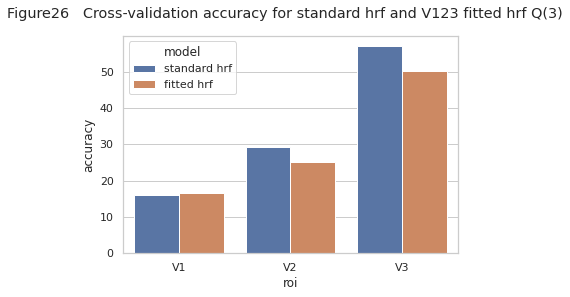

In [ ]:
rsqs_hemis_v123_hrf = np.array(expand_rsq_to_hemis(total_voxels, voxels_v123, roi_v123, rsqs_v123_hrf))*100
rsqs_hemis_v123 = np.array(expand_rsq_to_hemis(total_voxels, voxels_v123, roi_v123, rsqs_v123))*100

names = locals()
viusal_list_v123 = ['V1', 'V2', 'V3']
for l in viusal_list_v123:
  name1 = 'accuracy_' + l + '_hrf'
  name2 = 'accuracy_' + l
  locals()['accuracy_' + l + '_hrf'] = rsqs_hemis_v123_hrf[names.get(str(l) + '_index')]
  locals()['accuracy_' + l] = rsqs_hemis_v123[names.get(str(l) + '_index')]

for l in viusal_list_v123:
  name1 = 'median_accuracy_' + l + '_hrf'
  locals()['median_accuracy_' + l + '_hrf'] = np.median(names.get('accuracy_' + l + '_hrf'))
  name2 = 'median_accuracy_' + l
  locals()['median_accuracy_' + l] = np.median(names.get('accuracy_' + l))

median_list = []
median_list_hrf = []
for l in viusal_list_v123:
  median_list_hrf.append(names.get('median_accuracy_' + l + '_hrf'))
  median_list.append(names.get('median_accuracy_' + l))

median_list = median_list + median_list_hrf
name_list = viusal_list_v123 + viusal_list_v123
model_list = ['standard hrf'] * len(viusal_list_v123) + ['fitted hrf'] * len(viusal_list_v123)
df_hrf = pd.DataFrame(np.array([median_list, name_list, model_list]).T,
                   columns=['accuracy', 'roi', 'model'])
df_hrf = df_hrf.explode('accuracy')
df_hrf['accuracy'] = df_hrf['accuracy'].astype('float')

sns.set_theme(style="whitegrid")
ax = sns.barplot(x="roi", y="accuracy", hue="model", data=df_hrf, ci="sd")
fig = 26
plt.suptitle('Figure' + str(fig) + '   Cross-validation accuracy for standard hrf and V123 fitted hrf Q(3)')

# HRF estimation only based on V1
You can see the difference by changing the timeline of HRF model **bold text**

You are running hrf_estimation version 1.1
Performed detrending of the BOLD timecourse using a Savitzky-Golay filter


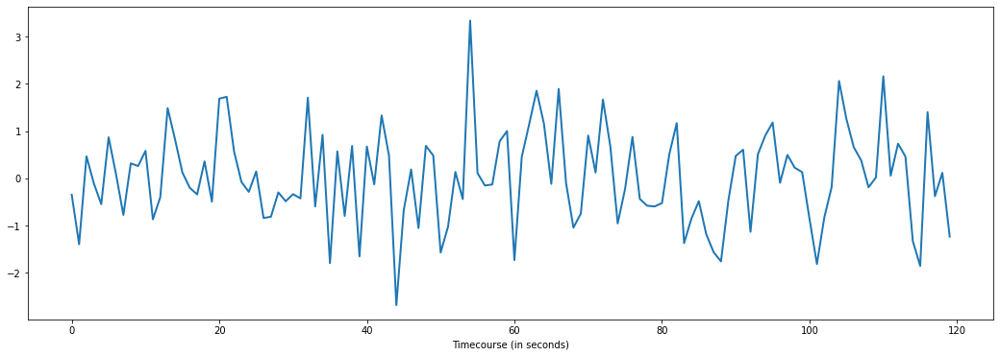

.. creating design matrix ..
.. done creating design matrix ..
.. computing initialization ..
.. done initialization ..
.. completed 500 out of 2939 ..
.. completed 1000 out of 2939 ..
.. completed 1500 out of 2939 ..
.. completed 2000 out of 2939 ..
.. completed 2500 out of 2939 ..


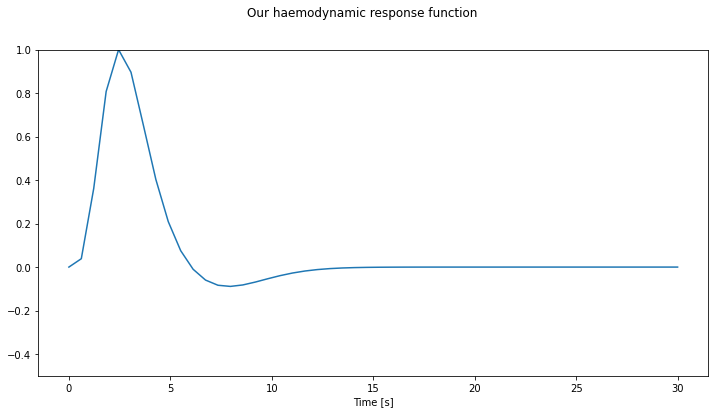

100%|██████████| 3375/3375 [00:58<00:00, 57.61it/s]


rsqs shape:  (3375, 2939)
best_fitting_model: [2340 2100  885 ...  900 1170  162]
Count the rsq-less-than-0.15 voxels number is 2581
Valid index in the cortex [  59   60   61   79   80   81   82   83   84   85   86   87   94   95
   96   97   99  108  109  115  128  129  166  168  185  188  189  190
  192  208  209  210  211  221  222  241  242  243  258  259  275  278
  302  309  310  315  322  350  351  360  368  377  383  447  448  456
  476  500  502  528  529  530  531  543  554  558  559  560  561  574
  575  591  592  604  605  606  624  635  637  638  639  658  659  667
  668  669  670  672  702  703  705  706  726  740  741  750  761  786
  787  824  829  831  832  843  852  853  867  868  869  870  871  883
  896  897  910  911  912  913  923  924  925  926  937  938  939  955
  967  971  972  977  978  979  985  986  987 1010 1011 1016 1017 1018
 1025 1026 1027 1028 1063 1064 1065 1066 1067 1100 1101 1102 1103 1104
 1105 1107 1108 1137 1138 1139 1141 1142 1144 1171 1172 1173

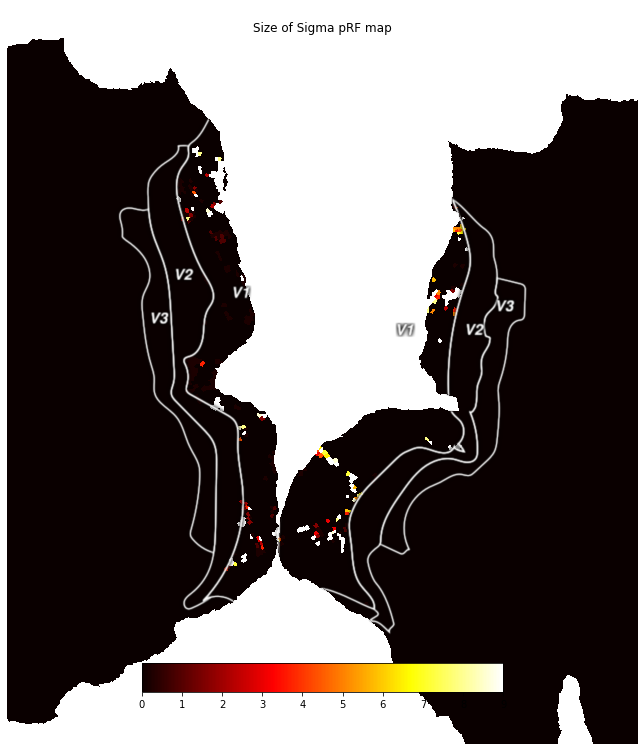

In [ ]:
hrfs_v1, _ = hrf_estimation(ROI_tcs_v1)

hrf_v1 = generated_hrf(hrfs_v1, 30)

grid_model_timecourses_conv_v1 = sp.signal.fftconvolve(grid_model_timecourses, hrf_v1, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]

valid_index_v1_hrf, x0_v1_hrf, y0_v1_hrf, sigma_v1_hrf, _ = find_valid_voxel_information(ROI_tcs_v1, grid_model_timecourses_conv_v1)
# plot v1 size map
voxels_v1, _ = ROI_tcs_v1.shape
x_y_s_v1_hrf = zero_filling(voxels_v1, valid_index_v1_hrf, np.array([x0_v1_hrf, y0_v1_hrf, sigma_v1_hrf]).T)
output_v1_hrf, _, _ = expand_to_hemis(total_voxels, voxels_v1, roi_v1, x_y_s_v1_hrf.T)

f = cx.quickshow(cx.Vertex(np.array(output_v1_hrf), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Size of Sigma pRF map')
zoom_to_roi('hcp_999999')

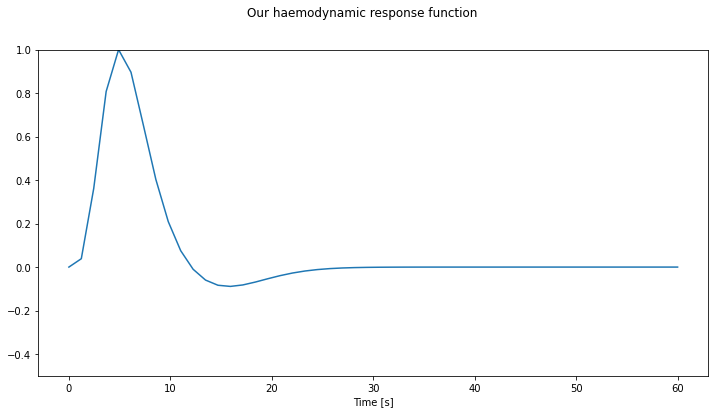

100%|██████████| 3375/3375 [00:36<00:00, 92.44it/s]


rsqs shape:  (3375, 2939)
best_fitting_model: [1620 1865  435 ... 2460 2685 2685]
Count the rsq-less-than-0.15 voxels number is 1394
Valid index in the cortex [  22   31   33 ... 2810 2836 2900]
valid_index shape:  (1545,)
Valid   x0  in the cortex [ 2.85714286  1.42857143 -2.85714286 ... 10.          2.85714286
 10.        ]
Valid   y0  in the cortex [ 8.57142857 -1.42857143  0.         ...  0.          1.42857143
  7.14285714]
Valid sigma in the cortex [9.30357143 5.125      6.51785714 ... 9.30357143 3.03571429 0.25      ]
(1545, 3)
Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 9.303571428571429, 0, 0, 0, 0, 0, 0, 0, 0, 5.125, 0, 6.517857142857142, 7.910714285714286, 0, 0, 0, 7.910714285714286, 8.607142857142858, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.9464285714285714, 0.9464285714285714, 0.9464285714285714, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 

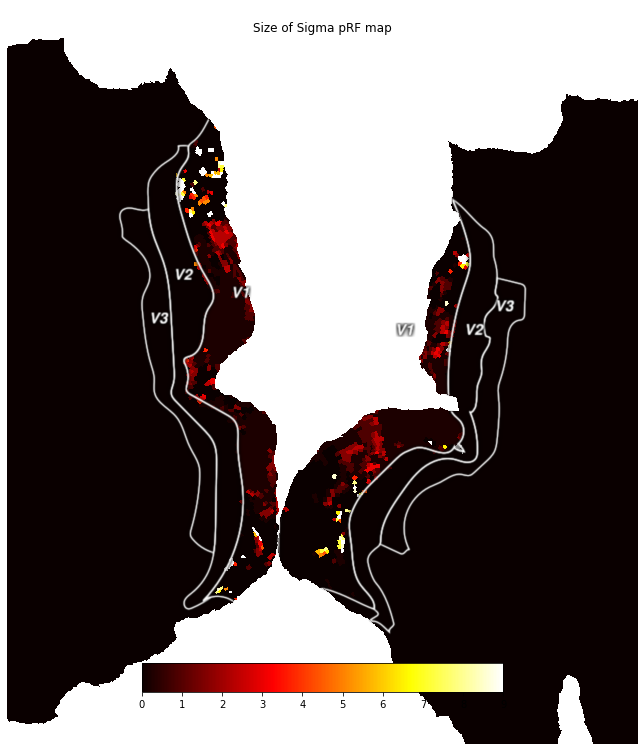

In [ ]:
hrf_v1 = generated_hrf(hrfs_v1, 60)

grid_model_timecourses_conv_v1 = sp.signal.fftconvolve(grid_model_timecourses, hrf_v1, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]

valid_index_v1_hrf, x0_v1_hrf, y0_v1_hrf, sigma_v1_hrf, _ = find_valid_voxel_information(ROI_tcs_v1, grid_model_timecourses_conv_v1)
# plot v1 size map
voxels_v1, _ = ROI_tcs_v1.shape
x_y_s_v1_hrf = zero_filling(voxels_v1, valid_index_v1_hrf, np.array([x0_v1_hrf, y0_v1_hrf, sigma_v1_hrf]).T)
output_v1_hrf, _, _ = expand_to_hemis(total_voxels, voxels_v1, roi_v1, x_y_s_v1_hrf.T)

f = cx.quickshow(cx.Vertex(np.array(output_v1_hrf), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Size of Sigma pRF map')
zoom_to_roi('hcp_999999')

# **QUESTION 4**

https://github.com/kdesimone/popeye/blob/master/popeye/css.py

Model fitting. We fit the CSS model to each voxel using the
beta-weights (BOLD response amplitudes) estimated in the GLM. Model
fitting was performed using nonlinear optimization. The stimulus was prepared by downsampling the apertures to 100 x 100 pixels. Stimulus values ranged from 0 (no contrast) to 1 (full contrast). To ensure reasonable model estimates,
we constrained the x0 and y0 parameters to be within a region three
times the size of the stimulus and the {\sigma} and n parameters to be
positive. The x0 and y0  parameters were seeded with 50.5 (the center
of the stimulus), the {\sigma} parameter was seeded with 100, and the g
parameter was seeded with 1. To avoid local minima, we first
optimized the x0, y0, {\sigma}, and g parameters with the n parameter fixed at
0.5 and then optimized all parameters simultaneously. A post hoc
linear approximation was used to convert pixel units into degrees of
retinal angle.

Using CSS model on V1&V2&V3

Without Threshold


  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [02:04<00:00, 27.17it/s]


rsqs shape:  (3375, 6613)
best_fitting_model: [1620 1620  210 ... 1350   89  209]
Count the rsq-less-than-0.15 voxels number is 2316
Valid index in the cortex [  26   30   35 ... 6595 6607 6608]
valid_index shape:  (4297,)
Valid   x0  in the cortex [ 1.42857143 -2.85714286  0.         ...  2.85714286 10.
 10.        ]
Valid   y0  in the cortex [ 1.42857143  4.28571429  0.         ...  1.42857143 -5.71428571
 -5.71428571]
Valid sigma in the cortex [2.33928571 2.33928571 0.25       ... 0.94642857 0.25       0.25      ]
Sigma in zero_filling: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 2.3392857142857144, 0, 0, 0, 0, 0.25, 1.6428571428571428, 2.3392857142857144, 0, 1.6428571428571428, 0, 1.6428571428571428, 1.6428571428571428, 0, 0, 0.9464285714285714, 0.9464285714285714, 1.6428571428571428, 2.3392857142857144, 0, 0, 0, 0, 0, 2.3392857142857144, 1.6428571428571428, 0, 1.6428571428571428, 0.9464285714285714, 0.9464285714285714

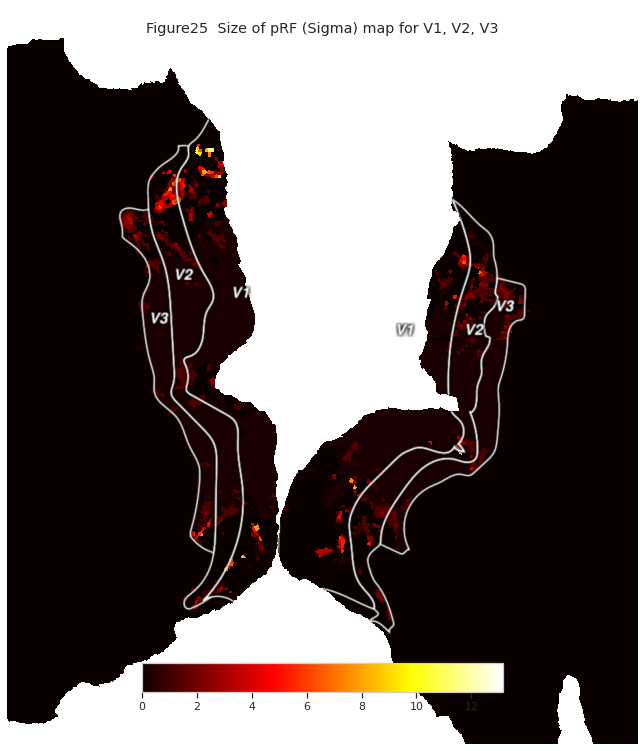

In [ ]:
roi_v123 = 'V123'
n = 0.5
grid_model_timecourses **= n
# and we perform the actual convolution in a fast way. 
model = sp.signal.fftconvolve(grid_model_timecourses, hrf, mode='full', axes=(-1))[..., :grid_model_timecourses.shape[-1]]

#CSS model
# units
model = (model - np.mean(model)) / np.mean(model)

ROI_tcs_v123 = psc(tseries_raw[atlas_data_both_hemis_v123 == roi_index_dict[roi_v123]])
print('Without Threshold')
valid_index_v123_nl, x0_v123_nl, y0_v123_nl, sigma_v123_nl, _ = find_valid_voxel_information(ROI_tcs_v123, model)

# plot all visual roi size map
voxels_v123, _ = ROI_tcs_v123.shape
x_y_s_v123_nl = zero_filling(voxels_v123, valid_index_v123_nl, np.array([x0_v123_nl, y0_v123_nl, sigma_v123_nl]).T)
output_v123_nl, _, _ = expand_to_hemis(total_voxels, voxels_v123, roi_v123, x_y_s_v123_nl.T)

print(max(output_v123_nl))

#  We define pRF size, sigma-size, to be the standard deviation of the Gaussian profile
output_v123_nl = output_v123_nl/np.sqrt(n)

print(max(output_v123_nl))
fig = 25
f = cx.quickshow(cx.Vertex(np.array(output_v123_nl), subject='hcp_999999', cmap='hot', vmin=min(output_v123_nl), vmax=max(output_v123_nl)));
f.suptitle('Figure' + str(fig) + '  Size of pRF (Sigma) map for V1, V2, V3')
zoom_to_roi('hcp_999999')

Using CSS model on all visual cortex

  0%|          | 0/3375 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
100%|██████████| 3375/3375 [03:38<00:00, 15.46it/s]


rsqs shape:  (3375, 10881)
best_fitting_model: [2252 1605 1621 ... 3224 3224 3254]
Count the rsq-less-than-0.15 voxels number is 2672
Valid index in the cortex [    0    27    31 ... 10878 10879 10880]
valid_index shape:  (8209,)
Valid   x0  in the cortex [-10.           1.42857143  -2.85714286 ...  -4.28571429  -4.28571429
  -1.42857143]
Valid   y0  in the cortex [ 4.28571429  2.85714286  2.85714286 ... 10.         10.
 10.        ]
Valid sigma in the cortex [ 1.64285714  5.125       4.42857143 ... 10.         10.
 10.        ]
Sigma in zero_filling: [1.6428571428571428, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5.125, 0, 0, 0, 4.428571428571429, 0, 0, 0, 0, 0.9464285714285714, 3.7321428571428568, 5.125, 0, 3.7321428571428568, 0, 3.7321428571428568, 4.428571428571429, 0, 0, 1.6428571428571428, 3.0357142857142856, 3.7321428571428568, 5.125, 0, 0, 0, 0, 0, 5.125, 4.428571428571429, 0, 5.821428571428571, 2.3392857142857144, 3.0357142857142856, 3.732142

Text(0.5, 0.98, 'Figure22  Size of pRF (Sigma) map for all visual (Q4)')

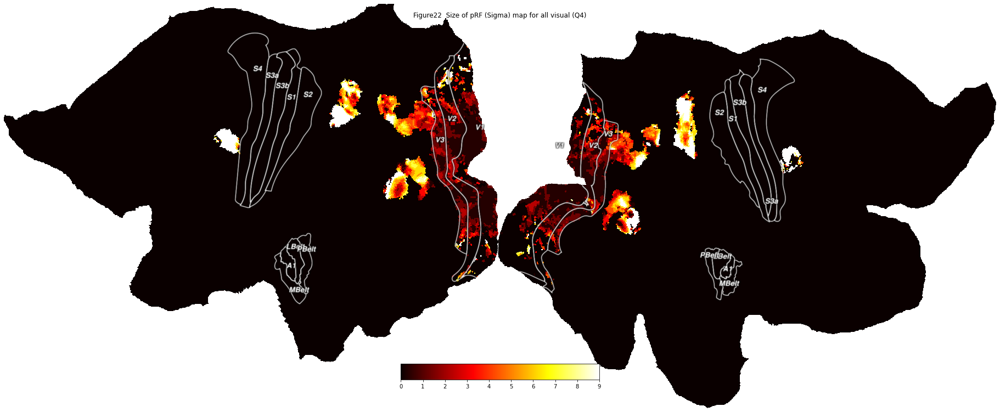

In [ ]:
ROI_tcs_av = psc(tseries_raw[atlas_data_both_hemis_av == roi_index_dict[roi_av]])

valid_index_av_nl, x0_av_nl, y0_av_nl, sigma_av_nl, rsqs_av_nl = find_valid_voxel_information(ROI_tcs_av, model)

voxels_av, _ = ROI_tcs_av.shape
x_y_s_av_nl = zero_filling(voxels_av, valid_index_av_nl, np.array([x0_av_nl, y0_av_nl, sigma_av_nl]).T)
output_av_nl, output_x0_av_nl, output_y0_av_nl = expand_to_hemis(total_voxels, voxels_av, roi_av, x_y_s_av_nl.T)
output_av_nl = output_av_nl/np.sqrt(n)
print(max(output_av_nl))

fig = 22
f = cx.quickshow(cx.Vertex(np.array(output_av_nl), subject='hcp_999999', cmap='hot', vmin=0, vmax=9));
f.suptitle('Figure' + str(fig) + '  Size of pRF (Sigma) map for all visual (Q4)')
# zoom_to_roi('hcp_999999')
# grid_model_timecourses_2 = np.array([model_timecourse(np.rot90(gauss2D_iso_cart(X, Y, mu=(x0,y0), sigma=sigma, normalize_RFs=False)), new_dms) for x0,y0,sigma in zip(x0_av_nl, y0_av_nl, sigma_av_nl)])

Index in expand_to_hemis: [4, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 2739, 2740, 2765, 2766, 2767, 2790, 2791, 2792, 2814, 2815, 2816, 2817, 2825, 2837, 2838, 2839, 2840, 2845, 2846, 2848, 2859, 2860, 2861, 2862, 2863, 2864, 2865, 2866, 2867, 2868, 2869, 2870, 2871, 2872, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2919, 2920, 2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2937, 2938, 2939, 2940, 2941, 2942, 2943, 2944, 2945, 2946, 2947, 2948, 2954, 2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965, 2970, 2971, 2972, 2973, 2974, 2975, 2976, 2977, 2978, 2985, 2986, 2987, 2988, 2999, 3000, 3001, 3012, 3013, 3024, 9181, 9182, 9183, 9184, 9185, 9186, 9187, 9188, 9189, 9190, 9191, 9192, 9193, 9194, 9195, 9196, 9314, 9388, 9389, 9460, 9461, 9462, 9463, 9532, 9533, 9534, 9535, 9601, 9602, 9603

Text(0.5, 0.98, 'Figure24   Cross-validation accuracy for individual voxels Q(4)')

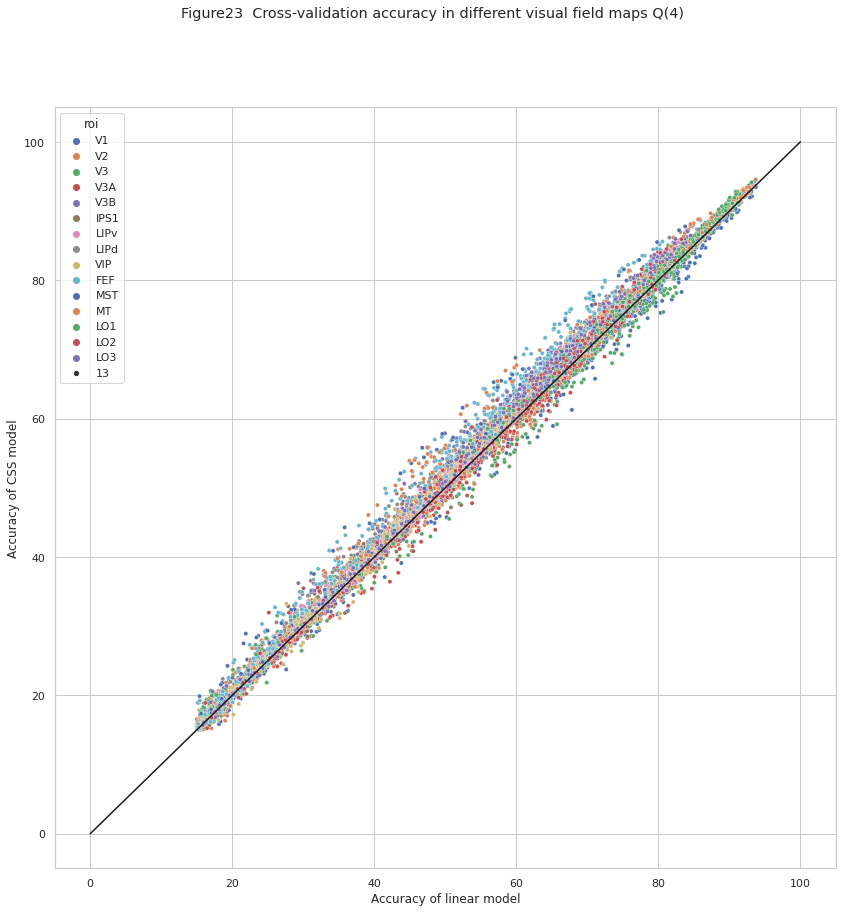

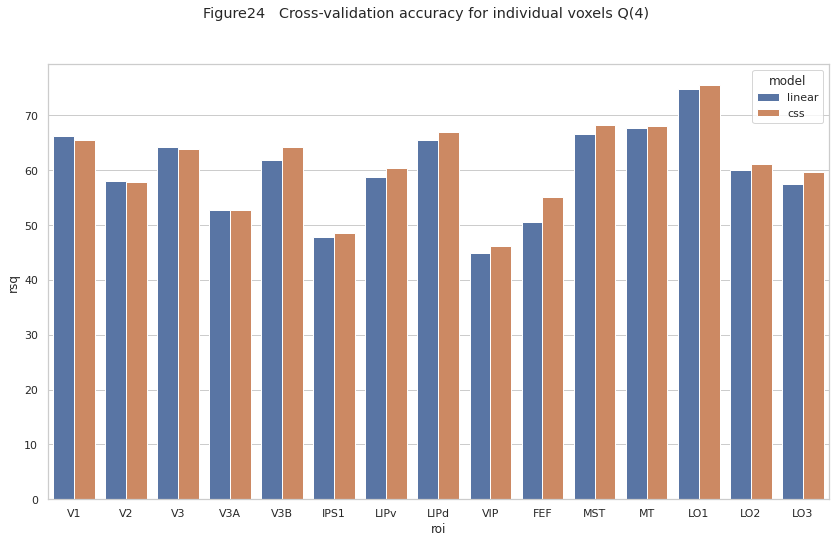

In [ ]:
rsqs_hemis_av_nl = np.array(expand_rsq_to_hemis(total_voxels, voxels_av, roi_av, rsqs_av_nl))*100
rsqs_hemis_av_l  = np.array(expand_rsq_to_hemis(total_voxels, voxels_av, roi_av, rsqs_av))*100

visual_list = ['V1', 'V2', 'V3', 'V3A', 'V3B', 'IPS1', 'LIPv', 'LIPd', 'VIP', 'FEF', 'MST', 'MT', 'LO1', 'LO2', 'LO3']

for l in visual_list:
  name = l + "_index"
  locals()[l + "_index"] = []

for i in range(total_voxels):
  for li in visual_list:
    if atlas_data_both_hemis[i] == roi_index_dict[li]:
     locals()[li + "_index"].append(i)

names = locals()
for l in visual_list:
  name1 = 'accuracy_' + l + '_nl'
  name2 = 'accuracy_' + l + '_l' 
  locals()['accuracy_' + l + '_nl'] = rsqs_hemis_av_nl[names.get(str(l) + '_index')]
  locals()['accuracy_' + l + '_l'] = rsqs_hemis_av_l[names.get(str(l) + '_index')]

for l in visual_list:
  name1 = 'median_accuracy_' + l + '_nl'
  name2 = 'std_accuracy_' + l + '_nl'
  locals()['median_accuracy_' + l + '_nl'] = np.median(names.get('accuracy_' + l + '_nl')[names.get('accuracy_' + l + '_nl') != 0])
  locals()['std_accuracy_' + l + '_nl'] = np.std(names.get('accuracy_' + l + '_nl')[names.get('accuracy_' + l + '_nl') != 0])
  name3 = 'median_accuracy_' + l + '_l'
  name4 = 'std_accuracy_' + l + '_l'
  locals()['median_accuracy_' + l + '_l'] = np.median(names.get('accuracy_' + l + '_l')[names.get('accuracy_' + l + '_l') != 0])
  locals()['std_accuracy_' + l + '_l'] = np.std(names.get('accuracy_' + l + '_l')[names.get('accuracy_' + l + '_nl') != 0])

accuracy_css_list = []
accuracy_linear_list = []
roi_list = []

for l in visual_list:
   accuracy_css_list = accuracy_css_list + list(names.get('accuracy_' + str(l) + '_nl'))
   accuracy_linear_list = accuracy_linear_list + list(names.get('accuracy_' + str(l) + '_l'))
   roi_list = roi_list + [str(l)]*len(list(names.get('accuracy_' + str(l) + '_nl')))
  
df_individual = pd.DataFrame(np.array([accuracy_css_list, accuracy_linear_list, roi_list]).T,
                   columns=['Accuracy of CSS model', 'Accuracy of linear model', 'roi'])
df_individual = df_individual.explode(['Accuracy of CSS model', 'Accuracy of linear model'])
df_individual[['Accuracy of CSS model', 'Accuracy of linear model']] = df_individual[['Accuracy of CSS model', 'Accuracy of linear model']].astype('float')
drop_A = df_individual.index[df_individual['Accuracy of CSS model'] == 0.0].tolist()
drop_B = df_individual.index[df_individual['Accuracy of linear model'] == 0.0].tolist()
c = drop_A + drop_B
df_individual = df_individual.drop(df_individual.index[c])

plt.figure(figsize=(14, 14))
sns.scatterplot(data=df_individual, x="Accuracy of linear model", y="Accuracy of CSS model", hue="roi", palette="deep", size=13)
x=np.linspace(0,100,100) 
plt.plot(x,x,'k-')
fig = 23
plt.suptitle('Figure' + str(fig) + '  Cross-validation accuracy in different visual field maps Q(4)')

median_list_l = []
std_list_l = []
median_list_nl = []
std_list_nl = []
for l in visual_list:
  median_list_l.append(names.get('median_accuracy_' + l + '_l'))
  std_list_l.append(names.get('std_accuracy_' + l + '_l'))
  median_list_nl.append(names.get('median_accuracy_' + l + '_nl'))
  std_list_nl.append(names.get('std_accuracy_' + l + '_nl'))

median_list = median_list_l + median_list_nl
name_list = visual_list + visual_list
model_list = ['linear'] * len(visual_list) + ['css'] * len(visual_list)
std_list = std_list_l + std_list_nl
df = pd.DataFrame(np.array([median_list, std_list, name_list, model_list]).T,
                   columns=['rsq', 'sd', 'roi', 'model'])
# display(df)
df = df.explode('rsq')
df['rsq'] = df['rsq'].astype('float')
plt.figure(figsize=(14, 8))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x="roi", y="rsq", hue="model", data=df, ci="sd")
fig += 1
plt.suptitle('Figure' + str(fig) + '   Cross-validation accuracy for individual voxels Q(4)')


To plot polar angle on the surface, you should use a circular colormap because phase is a circular measure. Please see the pycortex website for a collection of colormaps: https://gallantlab.github.io/colormaps.html

## Your task

Ok, now you have all the ingredients to perform a full pRF analysis on the data you have. You should be able to perform the grid-search pRF fitting across voxels/vertices, and plot the results on the surface. 

**Your goal is to replicate Figures 5, 6, and 8 from the original Dumoulin 2008 paper, and describe these results in detail in the report.**

Your best bet is to start with just the first 3 visual regions, V1, V2, and V3. A passing grade, say, a 6.5 to 7.5 can be attained by a `sec` replication of these 3 figures of the original pRF paper, and a thorough and insightful discussion of the similarities and deviations from the original (the exact grade depending on the writing). Note that you aren't expected to produce 3D plots of the cortical surface, but you should make your plots on the flatmap you've been using. This will make Figure 5 look more like the figure on the right: 
<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/laYGGmS.png" alt="Example of retinotopy on flatmap" width="300" align="right" />

Then, there is a sequence of additional steps that can get you to a higher grade. They are ordered according to increasing difficulty. 

1. Perform fitting on more visual regions, as listed in the ROI dictionary. With these results you can create ROI-based plots cf. Figure 8, as well as fill in the surface plots even further. Answer the following questions: 
  - do the borders between these regions from the atlas line up with polar angle reversals, just like in V1, V2, V3? Can you speculate why is that (not) the case?
2. np.linalg.lstsq can fit on 2D data, that is, the whole brain simultaneously. That means that with slight changes to the explanatory code above you can speed up your fitting and show results for the entire brain, even! If you manage to do this, plot the rsq of the best-fitting model throughout the brain. You should also be able to see that there are large regions in frontal cortex that are retinotopic!
3. In the original paper, the authors describe the effects of changing the HRF to pRF fits. Since the experiment of the HRF mapper project was run on the same subject as the pRF experiment (Tomas), this means that you can now perform that project's estimation of HRF shape per vertex, and check whether this changes the fit quality in V1, V2, and V3. The way to do this is to estimate the mean HRF shape for V1, V2, and V3 and then use those to fit the pRFs from those regions. You don't need to go further than these regions since our HRF mapper didn't activate much higher than V3.
4. A more recent addition to the original model adds a nonlinearity to the model (the original model is a linear model). That is, the model's timecourse $s$ is converted to $s^n$, where $n$, the exponent, has a value between 0 and 1. Read [this paper](http://kendrickkay.net/papers/KayJNeurophysiology2013.pdf) and implement its model, perform its fits using a grid fit procedure and check whether this model improves fits differentially across different ROIs, similar to their Figure 6 & 7B. 

**Note:** TBH, I don't expect any of you to pull of number 4, and number 3 is already advanced bonus material. But it will give you something to aim for, because it does give you an example of the type of work we do in the lab. 


# Project 2: Soma-Mapper

This section will explain the experiment, background and analysis plans for the Soma-mapper dataset.  You should feel free to use any and all information in this "Project Explanation" section in your own report. Before going through this section, though, read the following relevant articles: [New Whole-Body Sensory-Motor Gradients Revealed Using Phase-Locked Analysis and Verified Using Multivoxel Pattern Analysis and Functional Connectivity, Zeharia et al, 2015](https://www.jneurosci.org/content/jneuro/35/7/2845.full.pdf), and [The ‘creatures’ of the human cortical somatosensory system, Saadon-Grosman et al, 2020](https://academic.oup.com/braincomms/article/2/1/fcaa003/5709029). If you have any questions about the type of experiment we're going to be looking at, and the different analysis steps, please ask me.

<img style="float:left; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/8P79rY0.png" alt="Model pipeline" width="500" align="left" />

## Somatotopic Mapper: the Experiment. 

This experiment was conducted by Ines, the course TA, for her PhD project. It's a motor mapper - and not a somatosensory mapper like in one of the original articles - that served to map out the subject's motor strip in the central sulcus. 

Subjects viewed a movie of an avatar that moved its facial muscles, hands and legs in a quasi-cyclic order that was identical across runs. On some cycles subjects moved both hands/legs, and on some they only moved one side. With a design like this we can investigate and chart not just the lateralized motor map, but also whether responses in for example the right-hand region are similar when we move the right hand, or both. You can see example timecourses from two voxels; one from the hand and one from the face. There are even [studies reporting pRF-like analyses](https://www.sciencedirect.com/science/article/pii/S105381191830569X) (see the pRF project if you want to know more) on experiments such as these. But for now, we won't be going there. 

The data that we will analyze here is the average across 5 runs for a single subject. We don't want to be "scraping the bottom of the barrel", so using this averaged data means that it is very high-signal data, and we can go into detail a bit. We will analyze these data using a 'standard' GLM, and will then inspect the sensitivities along the central sulcus. **Can we find the hand-, leg-, and face regions of the motor cortex? Let's find out!**



## Experimental Design

This experimental design is a blend between an event-related and a block design. We can find what happened when on the screen by inspecting what's in the `events.tsv` file. Files like this are standard BIDS formatted meta-data, that allow other researchers to immediately understand what we did (with the explanations in the paper, of course). 

Let's see if we can make sense of this. 

In [ ]:
import pandas as pd
expt_df = pd.read_csv('/content/data/soma_mapper_59k/sub-01_ses-01_task-soma_run-median_events.tsv', sep='\t')
expt_df.head(20)

### Experimental timecourse

This provides quite a complete description of what happened when. For example, you see that events on lines 14 and 15 occurred simultaneously; both hands were moved at this point in time. But event nr 4 was just the left hand's finger 1 moving.  

With this information we can start to construct our design matrix. The idea here is exceedingly similar to our earlier notebook practicals (so you'll be able to re-use a lot of things that you've learned there), but now our design is a bit more complicated. But, we're also more experienced scientists so we'll be fine. Let's get going. 

In [ ]:
# what types of stimuli were shown, and what bodyparts were actually moved?
# unique_event_types = np.unique(expt_df['trial_type'])
# print(unique_event_types)

# let's order these in a sensible way so that when we decide to loop over them, 
# it's easy to keep in mind what we're doing
unique_event_types = ['eyebrows', 'eyes', 'mouth', 'tongue', 'lhand_fing1', 'lhand_fing2', 'lhand_fing3', 'lhand_fing4', 'lhand_fing5', 'lleg',  'rhand_fing1', 'rhand_fing2', 'rhand_fing3',
 'rhand_fing4', 'rhand_fing5', 'rleg']

# so, we can use the pandas DataFrame 
# to easily take the event times for an example event type
# you can use this simple syntax yourself lateron
event_times = np.array(expt_df[expt_df['trial_type'] == 'rhand_fing2']['onset'])

In [ ]:
# okay, now that we have event times, we'll be able to create a fine-timing timecourse. 
# I will tell you a secret: the TR in this experiment was 1.6s - you can find this info
# in the figshare website also. 
tr = 1.6

# create 0.1 s timescale regressor, and fill in the events
upscaled_times = np.arange(0, tseries_raw.shape[1]*tr, 0.1)
neural_event_timecourse = np.zeros(int(tseries_raw.shape[1]*tr*10))
# we'll pretend the events were instantaneous, since this will not
# impact the expected response shapes much
neural_event_timecourse[np.round(event_times * 10).astype(int)] = 1 


from nilearn.glm.first_level.hemodynamic_models import _gamma_difference_hrf

hrf = _gamma_difference_hrf(tr=tr ,oversampling=16, onset=-tr/2)
hrf /= hrf.max() # <- normalize HRF

bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]

f = plt.figure(figsize=(20,5))
plt.plot(upscaled_times, neural_event_timecourse, label='neural')
plt.plot(upscaled_times, bold_event_timecourse, label='BOLD')
plt.suptitle('Our model predictions')
plt.xlabel('Time [s]');

## First GLM 

Now that we've got a single-regressor design matrix, we can start to perform a GLM analysis on the brain. We'll first look at explained variance and beta weights to get an idea of whether this all makes sense. 

In [ ]:
sub_sampled_regressor = bold_event_timecourse[::16]
dm = np.vstack([np.ones_like(sub_sampled_regressor), sub_sampled_regressor]).T

betas, _, _, _ = np.linalg.lstsq(dm, tseries_raw.T)
# let's look at betas[1], since those are our tongue betas 

yhat = np.dot(betas.T, dm.T)
rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

# we can visualize the rsq and beta weights separately
f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=0.5));

masked_betas = betas[1]
# masked_betas[rsq < 0.3] = np.nan

f2 = cx.quickshow(cx.Vertex(masked_betas, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3, alpha=rsq));

# or use one to mask the other using a 2D Vertex object, and plotting that. 
# there seems to be a rendering issue, but we'll leave it at this.
# f12 = cx.quickshow(cx.Vertex2D(rsq, betas[1], subject='hcp_999999', cmap='BuWtRd_alpha', vmin=0.1, vmax=1, vmin2=-3, vmax2=3));

## More complete GLM

OK, now that we're starting to see that we can find something going on in motor cortex (and get positive and negative beta weights), we need to run a full GLM with all event types simultaneously encoded in the design matrix. 

You see, there's a conceptual problem with running all of these regressors in separate GLMs, and you can see from this last figure. We used the right hand finger regressor, but we also see right (and not contralateral left) give a similar if fainter pattern of BOLD responses. From the earlier explanations you should be able to answer the question: _"Why is that?"_

In any case, we'll need to perform an actual GLM to get around this problem, so that is what we'll do. Our first task is to convert the above code into a function that creates the regressors and cleans things up a bit. For further code that you'll write yourselves, follow this example: if things become more complicated in terms of analysis it often helps to provide more structure in your code. 

In [ ]:
def create_BOLD_regressor(event_times, n_timepoints, tr=1.6, supersampleratio=10):

    # create 0.1 s timescale regressor, and fill in the events
    upscaled_times = np.arange(0, n_timepoints*tr, 1/supersampleratio)
    neural_event_timecourse = np.zeros(int(n_timepoints*tr*supersampleratio))
    # we'll pretend the events were instantaneous, since this will not
    # impact the expected response shapes much. For events with variable durations
    # you'll want to make sure this doesn't happen :-)
    neural_event_timecourse[np.round(event_times * supersampleratio).astype(int)] = 1 

    hrf = _gamma_difference_hrf(tr=tr ,oversampling=tr*supersampleratio, onset=-tr/2)
    hrf /= hrf.max() # <- normalize HRF

    bold_event_timecourse = np.convolve(neural_event_timecourse, hrf, 'full')[:neural_event_timecourse.shape[0]]
    sub_sampled_regressor = bold_event_timecourse[::int(tr*supersampleratio)]
    return sub_sampled_regressor

def create_design_matrix(regressor_types, expt_df, data):
    regressors = [np.ones(data.shape[1])]
    for regressor_type in regressor_types:
        event_times = np.array(expt_df[expt_df['trial_type'] == regressor_type]['onset'])
        regressors.append(create_BOLD_regressor(event_times, data.shape[1]))
    return np.array(regressors)

dm = create_design_matrix(regressor_types=unique_event_types, expt_df=expt_df, data=tseries_raw)

betas, _, _, _ = np.linalg.lstsq(dm.T, tseries_raw.T)
yhat = np.dot(betas.T, dm)

rsq = 1-(yhat-tseries_raw).var(1)/tseries_raw.var(1)

f1 = cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0, vmax=1));

## Some interpretation.

Boom, that's a lot of explained variance in different parts of the brain! We're plotting the proportion of within-set explained variance of the GLM analysis up there. What does this pattern mean? There is a clear pattern around the central sulcus. But a few other things seem to 'light up' too. Some of these correspond to known somatotopy like the maps we know from the papers we've read. 

**But others don't. Can you identify these and explain why we do see them here?**

You will likely see these weird regions pop up in later requested analyses, too. Your interpretation is essential here, and should be reflected in your writing of the report. Also, don't forget to mention your choices in terms of preprocessing. 

## Your task

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/Hj9spSs.png" alt="Homunculus" width="600" align="right" />

The nice part about these maps is that they give us something to hold on to - we know that we should be seeing them, we know that our bodies are represented contralaterally, and we know that there should be a set of somatotopic gradients. But how exactly do they run in this subject? For example, as you see, the ordering of the fingers on the Homunculus maps to the right are a bit ambiguous. Also, in much of the preceding literature such as the Zeharia study linked to above, the data were quite strongly smoothed. We're not doing that here, because it would diminish our spatial detail. Keep in mind that we're likely going to be looking at more detailed gradients than you see in those older studies. 

**Diving into the map structure of somatotopic cortex is your task for this project report.** Create the following visualizations:

1. Show the T-statistic of the contrast of "right hand" vs "left hand" to signify contralaterality of the hand representations. This should give you a broad idea of where the hand representation is in our S-named regions of interest (the ones that are green in the HCP flatmap explanation above). Use your knowledge from the glm practical to calculate these statistics, and use a t-statistic threshold of 4 in your visualizations. Do the same for the left foot vs the right foot. 
2. Then, contrast the face vs an implicit baseline (an unbalanced contrast)
    - Is the very coarse map of faces, hands, and feet we're seeing until now contiguous on the surface? Or are there some holes? If not, why do you think this is the case? Can you tie this back to the different regressors we have in our design?
3. Now, subdivide the hand into its fingers, and test the left vs right contrast for each finger. For this analysis, create 5 separate flatmaps. 
4. But how are these ordered? Kind of hard to see now, with these separate figures. In the end, we want to create the actual somatotopic gradient on the surface! This is what we'll do. 
    - The first step is to figure out the winning finger for each voxel - use `np.argmax` for this. 
    - Now, re-code this such that you create a finger-line, running as follows: `[-5, -4, -3, -2, -1, 1, 2, 3, 4, 5]`. That is, from the left pinky to thumb and then from the right thumb to pinky. Set everything outside the hand regions you found in the previous analysis to `0` or `np.nan`. Now, visualize this using the `CyanBlueGrayRedPink`, `nipy_spectral`, or `J4` colormaps to bring about the finger maps on the surface. Or, if you come up with your own coloring, by all means go ahead! Is this map monotonic? In your report, you should relate these qualities of the map to the literature we gave you, and literature that you've discovered yourself.
    - In this experiment, subjects' movements would also have produced sensations. This means it's likely that you'll see these maps both in somatosensory AND motor cortex. In the Homunculus figure shown to the right here, there are slight differences between the two. Do your findings replicate this?
5. Lastly, what about the face? Create a similar gradient representation of the face, top to bottom. What part of the face is most strongly represented? Is the resulting map monotonic? Again, what have you found about this map in the literature?
6. **bonus** Oftentimes, neural tuning isn't about just the peak tuning location, but also the width of the tuning function. Specifically, we'd expect the tuning width to broaden as we move away from the primary regions towards more high-level regions. Can you think of a way to quantify this 'tuning width' for this experiment? And if so, can you plot this on the surface, as well as for different ROIs? 
7. **bonus** **bonus** Perhaps you guessed it, you could answer question [6.] if you fit a somatotopic pRF model to the data, exactly according to how [this paper](https://www.sciencedirect.com/science/article/pii/S105381191830569X) did it. That is, you can try to fit the soma-pRFs using the `gauss1D_cart` function below, on the beta values that come from the GLM for just the left hand, just the right hand, and/or just the face. Like in a visual pRF experiment, the outcomes would be the peak of the pRF ($\mu$ or `mu`, which should be identical/similar to the outcomes of your answer to question 4) and the width of the tuning in the body part. In auditory and visual cortex, these tuning widths become broader as we move up the auditory and visual hierarchies - is that the case also for these somatotopic maps? You can answer these questions by plotting the tuning width on the surface.

In [ ]:
def gauss1D_cart(x, mu=0.0, sigma=1.0):
    """gauss1D_cart

    gauss1D_cart takes a 1D array x, a mean and standard deviation,
    and produces a gaussian with given parameters, with a peak of height 1.

    Parameters
    ----------
    x : numpy.ndarray (1D)
        space on which to calculate the gauss
    mu : float, optional
        mean/mode of gaussian (the default is 0.0)
    sigma : float, optional
        standard deviation of gaussian (the default is 1.0)

    Returns
    -------
    numpy.ndarray
        gaussian values at x
    """

    return np.exp(-((x-mu)**2)/(2*sigma**2))

In [ ]:
rhands = np.array([1 if 'rhand' in uet else 0 for uet in unique_event_types])
lhands = np.array([-1 if 'lhand' in uet else 0 for uet in unique_event_types])
contrast_vector = np.r_[0, rhands+lhands] # the intercept regressor was never in the event types list

c_betas = np.dot(contrast_vector, betas)

N = tseries_raw.shape[1]
P = betas.shape[0]
df = (N - P)

sigma_hat = np.sum((tseries_raw - yhat) ** 2, axis=1) / df
des_var = contrast_vector.dot(np.linalg.pinv(dm.dot(dm.T))).dot(contrast_vector.T)

t = c_betas / np.sqrt(sigma_hat * des_var)
t[np.abs(t) < 4] = t[np.abs(t) < 4]/4

f2 = cx.quickshow(cx.Vertex(t, subject='hcp_999999', cmap='CyanBlueGrayRedPink', vmin=-10, vmax=10));
f2.suptitle('left hand vs right hand contrast');

# Project 3: Haemodynamic Response Mapper

This section will explain the experiment, background and analysis plans for the HRF-mapper dataset.  You should feel free to use any and all information in this "Project Explanation" section in your own report. Before going through this section, though, read [our explanation of deconvolution](https://nideconv.readthedocs.io/en/latest/tutorials/plot_what_is_deconvolution.html), and the following relevant but advanced article: [A temporal decomposition method for identifying venous effects in task-based fMRI, Kay et al, 2020](https://www.nature.com/articles/s41592-020-0941-6), as well as the Boynton paper you already read from Canvas. If you have any questions about the type of experiment we're going to be looking at, and the different analysis steps, please ask me.

## Haemodynamic Response Mapper: the Goal, and the Experiment.

The shape of the haemodynamic response is usually assumed in standard fMRI analysis. But as we're moving to 7T, we're having to make sure that our methods and assumptions still work. Can we still depend on a reasonably fixed shape of the BOLD response, or do we have to take other things into account? In this experiment, we mapped the BOLD response in visual cortex. 

How do you go about this? Well, in this exceedingly simple experiment, we showed brief, full-screen flickering checkerboard stimuli to our participant (Tomas). The intervals between the presentations were drawn randomly, and more specifically from an exponential distribution. We know from [theoretical work](https://pubmed.ncbi.nlm.nih.gov/11144754/) that this is ideal for the estimation of the HRF shape. 

We'll go through how we try to estimate the shape of the BOLD response with the so-called Finite Impulse Response model (which is a fancy name for a relatively simple analysis). We'll also see how this estimation interacts with nuisance regression, and then quantify how the shape of the HRF depends on our measurements. Let's go!

## FIR model

The Finite Impulse-Response model is really simple. It tries to estimate, using a GLM, the response generated at a range of timepoints after an event. By estimating the response strength at a range of intervals after the events of interest, we can reconstruct the average post-event signal time-course. This fitting the shape of the HRF is also referred to as 'deconvolution', with which we find out with what response our neural events were convolved with to produce our signals. Our [explanation of deconvolution](https://nideconv.readthedocs.io/en/latest/tutorials/plot_what_is_deconvolution.html) explains why we wouldn't perform this type of analysis by simple epoched averaging. With a very slow BOLD response and relatively closely spaced events, epoched averaging of time-courses would count overlapping responses 'double'. So, we need to perform this GLM-based fit to fairly assign signal to post-event timepoints. Please make sure you understand this logic before continuing. 

### The FIR design matrix

We'll first dive into the design matrix we use for FIR analysis.

In [ ]:
# we'll assume, for now, that we're interested in 20 timepoints after the events
n_timepoints = 20
dm_one_event = np.eye(n_timepoints)

# we simulate some random event times, synced to the TR (important!): 
event_TRs = np.round(np.cumsum(3+np.random.exponential(scale=6, size=10))).astype(int)
total_dm = np.zeros((event_TRs[-1]+n_timepoints+event_TRs[0], n_timepoints))
for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += dm_one_event

# and some plotting code
plt.figure(figsize=(20,10))
ax1 = plt.subplot2grid((2, 6), (0, 0), colspan=1)
ax2 = plt.subplot2grid((2, 6), (0, 1), colspan=5)
ax3 = plt.subplot2grid((2, 6), (1, 1), colspan=5)

ax1.imshow(dm_one_event, aspect=1)
ax1.set_title('single-event FIR design matrix')
ax1.set_xlabel('timepoint post-event')
ax1.set_ylabel('regressor')
ax2.imshow(total_dm.T)
ax2.set_title('multiple-event FIR design matrix')
ax2.set_ylabel('regressor')
ax3.plot(total_dm.sum(1), 'k--')
ax3.set_title('summed regressors')
ax3.set_xlabel('timepoint in experiment')
ax3.set_xlim([0,event_TRs[-1]+n_timepoints+event_TRs[0]])
plt.tight_layout()

How does this design matrix allow us to capture stacked responses? Well, if BOLD responses are likely to be stacked together in the experiment - that is, due to events occurring close together, these regressors will all be trying to explain the same timepoints of data. This means that in the least-squares solution that the GLM obtains the signal variance will be distributed between the different regressors which stand for different post-event timepoints. If this still feels weird, please re-consult the explanation linked to above. 

For now, we'll continue with our actual signal time-courses and event times. 

In [ ]:
!ls /content/data/hrf_mapper_59k/

# we'll load all the different event times we have, but will focus on the stimulus presentations for now.
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

# and, for convenience, we'll also read in the confounds for later use here. 
# for example, the bold_confounds dataframe contains slow drift regressors...
# these are called CosineXXX.
import pandas as pd
bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), delimiter='\t')
bold_confounds.head()

In [ ]:
# when were these events?
print(stim_times)
plt.hist(np.diff(stim_times), bins=20);
plt.xlabel('time [s]');

In [ ]:
# From the output above, you see that the events didn't occur at TR intervals. 
# we'll work with that in a bit. For now, we'll pretend that they did, and 
# round them off to the nearest TR (0.945s in this experiment)
tr = 0.945
event_TRs = np.round(stim_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
event_TRs = event_TRs[event_TRs < (tseries_raw.shape[1] - n_timepoints)]

# But hey, now we're almost in the same place as with our simulated events! 
# This means we can create the design matrix immediately by code we already used!
total_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += dm_one_event

# Then, if we were to just add an intercept and disregard our preprocessing, we 
# could start performing the GLM!

glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, total_dm))

plt.figure(figsize=(20,3))
plt.imshow(glm_dm.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

## Fitting the FIR model

Remember when we told you that the GLM is the basis for most of the analyses we do on fMRI data? This here is yet another example. Having built the design matrix, we can now perform a very simple GLM analysis, and we'll have our estimates of the BOLD response HRF shapes!

In [ ]:
# psc calculations can cause division by zero
tseries_psc = np.nan_to_num(psc(tseries_raw))

betas, _, _, _ = np.linalg.lstsq(glm_dm, tseries_psc.T)

yhat = np.dot(betas.T, glm_dm.T)
rsq = 1-(yhat-tseries_psc).var(1)/tseries_psc.var(1)

In [ ]:
# the rsq measure tells us where the voxels are whose signal is explained 
# using the FIR model. Not suprisingly, a simple visual stimulus causes
# BOLD responses mainly in low-level visual cortex.

cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='inferno', vmin=0.05, vmax=0.25));

In [ ]:
# we could use this cell to plot all time-points as flatmaps.
# This allows you to see the BOLD response unfold on the surface of the cortex
# Plotting this many flatmaps is going to take a while, so use with caution.

f, sps = plt.subplots(n_timepoints, 1, figsize=(15,150))

for i, beta in enumerate(betas[1:]): # intercept is not so interesting :)
    cx.quickshow(cx.Vertex(beta*rsq, subject='hcp_999999', cmap='seismic', vmin=-3, vmax=3), fig=sps[i]);

In [ ]:
rsq_threshold = 0.05
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == 1

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
# how many?
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

plt.figure(figsize=(20,8))
for i, tc in enumerate(responsive_V1_vertex_FIR_timecourses.T):
    plt.plot(np.arange(n_timepoints)*tr, tc, c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
plt.xlabel('time [s]')
plt.ylabel('% signal change');

## Your task

Like with each of the other projects, your mission is to try to perform as many as possible of the underlying tasks. **Note:** You **do NOT** have to do them all for a passing grade. But, as with any project you sometimes have to cut things short and write up the results you do have, instead of keep working on creating more results. 

1. We have a lot more information about the experiment than just the stimulus presentation times: we have eyetracking results, so we know when the subject made an eye movement, and when he blinked (in the `sacc_times` and `blink_times` variables, respectively). What happens when you add these to the design matrix as separate time-courses to be estimated? Pick the best-fitting voxel for each of V1, V2, and V3, and plot its time-course for all three types of event: **stimulus, blink, and saccade**. Also plot the average response-time-course in V1, V2, and V3. **BONUS:** add the 95% confidence interval across voxels in each region as a shaded region to these latter plots.  
2. We also have a bunch of slow drift and nuisance regressors that we may want to incorporate. This is likely going to make our fits, in rsq, a lot better. But does this make the estimated time-courses any better? Check this, by adding the aCompCorr, tCompCorr, CosineXXX, and FD/DVARS regressors to your design matrix. Make sure you change the np.nan values in those regressors before you try the GLM. The outcome: a re-plot of the average response time-courses for V1, V2, and V3 - but also that same voxel you plotted before (the best-fitting one from question 1). The goal is to plot these HRF shapes with and without the confounds. Does the HRF shape change as a result of adding nuisance regressors to the design matrix?
    - What's really cool is that we can also investigate how the nuisances map onto the surface. So, plot the T-statistic for each of the aCompCorr regressors onto flatmaps to inspect this. Do these regions overlap with the earlier rsq visualization?
3. But wait. When we think deeply about what we're doing right now, something is off. You saw that the events in our experiment happened at random times, and not at every TR! This means we're throwing away a lot of timing-related information by rounding event times to the TR, and that's a big, big shame. There are a couple of ways of trying to fix this, but the easiest is to pretend we have more data timepoints than we do have. Specifically, we can 'harmonica' the data by a factor of three (i.e. the sequence of values [2.3, 4.5, 2.1] in the time-course would become [2.3, 2.3, 2.3, 4.5, 4.5, 4.5, 2.1, 2.1, 2.1]) so that our made-up TR is now 1/3 of what it used to be (we could also do 4, 5, 6 etc. for a 1/4, 1/5 or 1/6 made-up TR). Then, we can round the event times in our experiment to that made-up TR -- effectively increasing the time resolution of our analysis by a factor of 3 (or 4, 5, or 6). Because the experimental events were jittered across the TR, this actually lets us capture the shape of the BOLD response at a higher temporal precision. But of course, you will understand from all of our degrees-of-freedom discussions that when we do something like this we cannot use the standard statistics. Luckily, we care only for the shape of the BOLD response here. Your task is to perform the analysis you performed at point 2 with 3-fold 'harmonica' of the data (using the numpy function [numpy.repeat](https://numpy.org/doc/stable/reference/generated/numpy.repeat.html)). Remember to handle the nuisance factors correctly also! Show the results for the best-fitting voxels and average of V1, V1, and V3 with the appropriate time axis, again for each of the 3 types of events in the experiment. Discuss why this trick works in your report, and what its downsides and/or caveats are.... 
4. Another way of fitting the response shapes is to use a different set of basis functions, for example a standard HRF and its time and dispersion derivative. You can import these functions as follows: 
`from nilearn.glm.first_level.hemodynamic_models import spm_hrf, spm_time_derivative, spm_dispersion_derivative`
This means that you can perform a GLM, where the beta weights for each of these HRF shapes together determine the shape of the BOLD response for that vertex/voxel. Does this analysis result in similar shape estimates as the full, smooth FIR version that you did here? You can look at the 10 best voxels and draw your conclusions. 
5. **bonus** We looked at veins in the raw data section of the introduction. If you've read the advanced Kay et al paper, you'll know that venous contributions actually impact the shape of the HRF. Veins show up as darker voxels in a T2* EPI image like we have here. Your task is to investigate whether vein contribution changes the shape of the BOLD response in visual cortex. Plot the average HRF shape for dimmer and brighter voxels in each region separately. Since we're interested in the shape of the HRF, it will work best if you normalize the BOLD responses, i.e. divide them by their maximal value (per vertex/voxel) so that the peaks line up on the y-axis. You will understand that this works best at as high as possible time resolution of the analysis, since then we will have the best estimate of the shape of the BOLD response.
6. **bonus** **bonus** If you're completely on a roll, feel free to also do the pRF project, and use the fitted HRF from this project there. You can find a more detailed explanation of how to do this in that project's Task explanation. **Note:** This is a very advanced assignment. You don't have to do this at all. But if you pull it off, that's bonus points and I would recommend you to anyone who is searching for PhD students :) 


###**REPORT**  



## Title 


# Patterns over patterns: Retinotopic activity of visual areas and areas not previously expected to be visual.

## Abstract


For most human behaviour we rely heavily on visual input. Whether it is navigating our environment reading, or for social interactions. Understanding how the brain encodes visual information therefore is incredibly valuable to neuroscientific research. Encoding models have been on the rise in recent years, especially ones that aim to map receptive fields on brain space. With our report we aim to do two things. First, we aim to replicate the findings of previous studies on population receptive field mapping of the visual areas V1, V2 and V3 in terms of size, polar angle and eccentricity. Second, we try to expand previous findings by including other regions of interest starting with areas that have been already linked to visual processing. However, we are also conducting a whole brain analysis to find retinotopic areas in the human cortex which have not previously been linked to vision. Generally, our findings replicate previous results. On top of that, our findings also mostly seem to hold true for later visual processing areas. Our whole brain analysis found that certain areas in the parietal and frontal lobes also explain a large amount of the variance of our data. They can, therefore, be termed retinotopic. Using HRF fitting also caused more voxels to surpass the explained variance threshold we set, by increasing the fit of our model. No meaningful differences were obtained when we used a non-linear model to fit our data. This, however, might have been due to our somewhat superficial fitting procedure.

## Introduction

Why this research? What does this specific experiment teach us about the brain? Be sure to discuss the articles that go with your project, and any and all additional articles that you've found. Feel free to add figures from published articles to clarify the approach. 

Something general like vision is "probably" the sense we most rely on when we navigate the environment. Understanding how our brain encodes visual stimuli is therefore really important. It will help us how we perceive the world and perhaps even help us understand how people with certain disabilities perceive the world then. The visual cortex is the main cortical region of the brain that receives, integrates, and processes visual information transmitted by the retina, and the retinotopic organization is one of the most fundamental and well-described organizational principles of the visual cortex [1]. Retinal heterotopic tissue is present at every level of the visual hierarchy and is thought to play a crucial role in the brain's ability to encode visual-spatial information [1]. In other words, the central nervous system maps sensory inputs onto topographically organized representations [2]. Thus, when the cerebral cortex tries to interpret different aspects of a visual image, such as its spectral composition, motion, and direction, the cerebral cortex's circuits are organized, by using the receptive fields that hold the most critical information about the image, its spatial organization [4], which means the human visual system preserves image structure in visual cortex regions with multiple visual functions of the visual field [3]. 

In the field of vision, the introduction of functional magnetic resonance imaging (fMRI) made it possible to identify visual field maps in the human cortex, and researchers used it to noninvasively measure visual field representations in living brains (retinal topology), laying the foundation for detailed investigations of the properties of visual cortex [2]. In Wandell’s [4] paper, they divided the visual cortex into distinct maps of the visual field: (1) medial occipital (V1, V2, V3), (2) lateral occipital (LO-1, LO-2, hMT+), (3) ventral occipital (hV4, VO-1, VO-2), (4) dorsal occipital (V3A, V3B), and (5) posterior parietal cortex (IPS-0 to IPS-4). Evidence of other maps is being sought.

The measurement of human visual field maps will help us accomplish multiple goals. First of all, they help us test the hypothesis that cortical regions are responsible for specific perceptual functions and understand the cortical organization of visual functions by characterizing the responses in specific visual field maps [4]. Secondly, they provide useful information about the possible perceptual functions of specific cortical regions, like visual field eccentricity [4]. Third, they can be used for detailed analyses of visual system pathologies [4]. For instance, in human albinism retinocortical miswiring lead to the single imaging voxels with bilateral dual pRFs [1]. Another study suggested changes in the primary visual cortex (V1) occur during normal aging and in Alzheimer's disease [5]. Furthermore, visual field maps researches showed that the topology of functional connectivity networks is heritable, including in the early sensory cortex [6], giving the knowledge of Stability and plasticity in the adult visual cortex [7]. Forth, visual field maps help us for interspecies comparisons [4], as the discovery of the V4 visual region in monkeys and humans [8]. Finally, visual field maps provide a useful way to compare or combine the responses of individual observers or groups of observers, because the alignment of gross anatomical features makes it difficult to align the cellular structures or functional areas [4].

Our study is a distributed network of millions of neurons, which is hard to model such distributed and complex circuits, so we rely on systems measurement and computational models to characterize the networks that produce singleton records [7]. Some conventional mapping methods for human visual field maps like Traveling-Wave Method use eccentricity and angle these two measurements specify the most effective visual field position in polar coordinates. But they can not explain all the information in time series [4]. Therefore, Dumoulin and Wandell developed methods for using the fMRI time series to model neuronal populations by computing a model of the pRF [9]. The pRF method estimates the visual field map, the pRF size, laterality and surround suppression using the temporal responses (including rings, wedges, and moving bars) to multiple stimuli [4] [9]. This model-based approach reconstructs cortical visual field maps more accurately than traditional mapping methods. Good correlations between data sets of Vertex-wise polar angle, eccentricity, and pRF size estimates in another study suggest that the model is reproducible in different data [3]. In addition, this pRF model has assumed that the response to the contrast model is the linear sum over the whole field of view, which is still inconsistent with the actual situation, so an additional computational model is developed in which compressed static nonlinearity is applied after the linear space sum [10]. In this report, we replicated Figures 5, 6, and 8 from the original Dumoulin 2008 paper, then expand the ROI first to other visual areas and then the whole brain. Finally, we add nonlinearity to improve the model to improve fits.

## Methods 

In the methods section, you should describe the experiment and your analyses in as much detail as possible, or at least to the level of detail required for others to replicate your findings. Clearly you don't have all the information regarding scanning parameters, etc, so we won't fault you for not including those here. 

In the experiment lines depicted in different orientations were displayed to the participant, while the participant’s brain activity was measured using a 7-T-fMRI. 
The model that forms the basis of our analyses is a Gaussian function in Cartesian 2-dimensional space. In this model, each voxel has its own peak at given location in the visual field, where x0 and y0 correspond to the horizontal and vertical location of the peak, respectively. The σ-value of the model depicts the width of the receptive field. Therefore, by knowing these coordinates it can be determined where in the visual field each voxel shows peak activation and how big the size of the receptive field is. On top of that, when analysing groups of voxels and hence populations of receptive fields (pRFs), careful calculations of the voxel’s ‘preferred’ locations can be mapped to create eccentricity or polar angle maps of the brain.
For this analysis to work, we had to do several things first. First, we needed to create a model predicting the time course of activity. Next, we had to convolve our model with an HRF to obtain a BOLD-response prediction for the voxels. Furthermore, because we were dealing with a 7-T-MRI scan it was necessary to shift the HRF by half a TR, to keep our predictions aligned with the data. Several pre-processing steps were undertaken to reduce noise and create the images used in this study. For instance, we used a high-pass filter to regress out temporal drift. We transformed the brain space to a create a flat surface on which we fitted our parameters using least squares fitting. Additionally, we used an explained variance value of rsq>0.15 as a cut-off value for including voxels into the analysis. Any voxel with an explained variance of less than 15% was excluded. On top of that, we used region of interest (ROI) based analyses for the first parts of our results. For the first steps we selected the areas V1, V2 and V3 in the visual cortex as ROIs, then expanded it in further analyses to other visual areas like the ventral intraparietal cortex (VIP), the lateral intraparietal cortex (LIP), the anterior V3 (V3a) and the middle temporal visual area (MT).  Afterwards we expanded the ROI to the whole brain.
To replicate the data from the paper by Dumoulin and Wandell, we first created scatterplots mapping the pRFs[9]. The scatterplots closely resemble the visual field, since the y0 is plotted on the y-axis and the x0 is plotted on the x-axis. The Gaussian spread, represented by each pRFs σ-value, is depicted by the radius of each pRF. 

Next, we analysed the voxels in the regions V1, V2 and V3 in terms of polar angle mapping. The range we used for polar angles from -π to π, therefore representing a full circle. This contrasts the methods used by Dumoulin and Wandell as they only shown the polar angle encoding for one hemisphere and its corresponding hemifield[9]. The advantage in our methodology is that ipsilateral processing is included in our results, while it was omitted in the results by Dumoulin and Wandell although they found evidence for it even in earlier visual processing areas[9]. The value 0 in this graph represents the furthest left angle in a circle. -π and π correspond to the furthest right point in terms of visual angle, therefore. 
Multiple linear regressions were conducted to depict the relationship between the continuous variables eccentricity and pRF size. The visual areas are herein plotted as different lines within the graph. 
In a later analysis we used an estimation of the participant’s mean HRF shape of the areas V1, V2 and V3. This newly mapped HRF was used to replace the previously used HRF, so that comparisons between the standard HRF and the participant’s HRF could be drawn. In a last analysis we added non-linearity to investigate whether this would improve the fit of our model. We used Compressive Spatial Summation (CSS), which (as the name suggests) compresses the signal at higher inputs. To achieve this an exponent (n) that ranges between 0 and 1 was added to the time course variable s. Since the exponent is always larger than 0, but smaller than 1, compression takes place. Additionally, the σ-value for the pRFs was divided by the square root of n. As in the paper by Kay et al., we fixed n at 0.5 and ran one instance of fitting. 


## Results

It's easiest to base your results section around a few (say, 4 or 5) key figures that illustrate what you've done and what you've found. These can be illustrations, flatmaps, time-courses and/or anything that you decide is a cool visualization of your results. You can start with a description of the data as you're getting it, basing yourself on the *Questions concerning signal quality* etc. above. 

Be sure to describe your figures with adequate captions. For these results, we will focus on qualitative descriptions and not so much on hard stats - which are harder to do on single subjects. 

I hope you will have fun creating this project and I also hope that your findings will reflect the fun you have. 

For our first analysis we included the areas V1, V2 and V3 as ROIs. Only Voxels with an explained variance (rsq) of 0.15 were included. Below scatterplots plotting the pRf coordinates and the Gaussian spreads (in the plots referred to as ‘sigma’) are displayed for each region separately. 

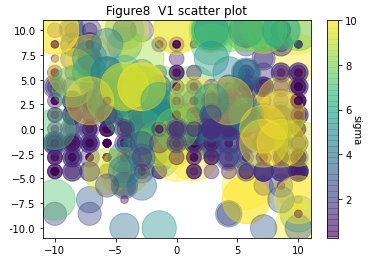

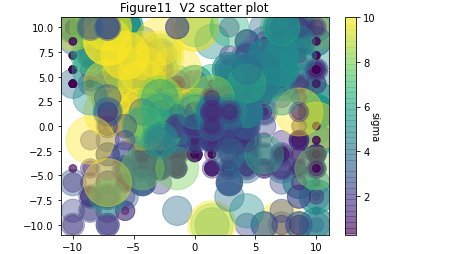

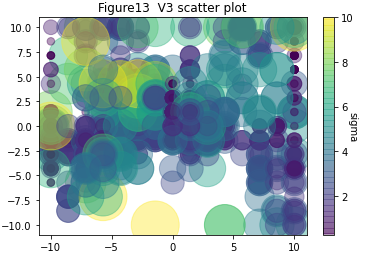

The spaces that are not covered by any pRF (i.e., the empty spaces found mostly in the bottom half of the scatterplots) can be explained by the threshold of rsq= 0.15. To check for this, we ran a scatterplot for all three ROIs together once with and once without the threshold. The figure below shows the outcome of this. As expected, without the threshold the visual space was covered much more than with the threshold in which patches of empty spaces were apparent. Nevertheless, for our further analyses we kept using the threshold of rsq=0.15 to avoid including voxels that do not sufficiently explain our data.

The scatterplot of V1,V2 and V3 with the threshold:


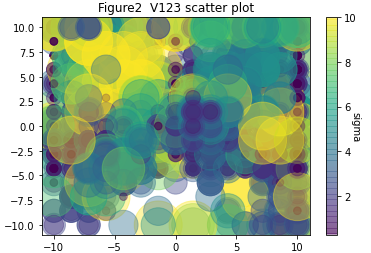

The scatterplot of V1, V2 and V3 without using any threshold:


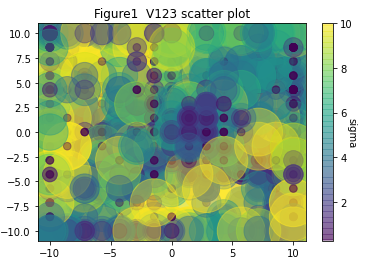

For our first set of analyses, we aimed to replicate the findings by Dumoulin and Wandell [9]. Therefore, we looked at the voxels in V1, V2 and V3. First, we analysed our ROIs by looking at the voxels’ response to eccentricities. The figure below shows two major points. One of which being that eccentricities, as found in the paper by Dumoulin and Wandell, are retinotopic[9]. This means that eccentricities that are close to each other in space (e.g., 3 deg visual angle and 4 deg visual angle) are also processed for the most part in neighbouring voxels. The other major point that can be concluded from this figure is that for the most part voxels positioned more laterally on the brain surface map higher eccentricities.

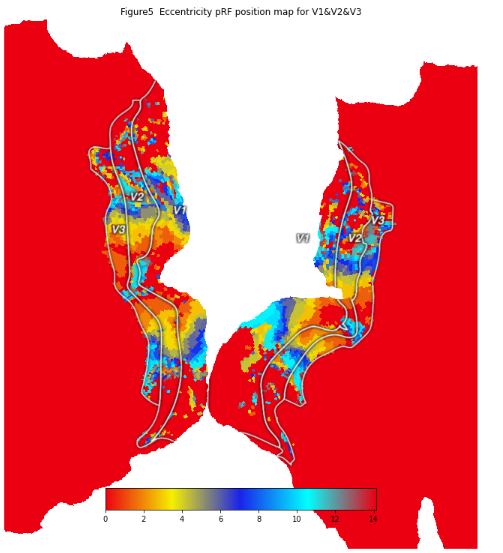

Next, we analysed the encoding of polar angles in the areas V1, V2 and V3. The corresponding figure is shown below. What can be generally concluded from this figure is that, similar to the eccentricity results, points that are adjacent to each other in terms of polar angle are processed by neighbouring voxels. This is also in accordance with previous findings such as the one in the paper by Dumoulin and Wandell [9]. On top of that we were able to replicate the polar angle reversal as produced by Dumoulin and Wandell [9]. As mentioned before the point 0 in our figure corresponds to the furthest left angle. Therefore, we expect it to be processed mainly in the right hemisphere. This can be seen below. The yellow field at about – π/2 corresponds to the top part of a polar angle circle. Looking at our figure, we can see that the polar angle corresponding to the colour yellow is processed in the more ventral part of our ROIs, which is in accordance with the polar angle reversal found by Dumoulin and Wandell[9]. While we focused only on the angle for the furthest left and furthest top part of the polar angles, this effect exists for all polar angles and for both hemispheres as can be seen below.

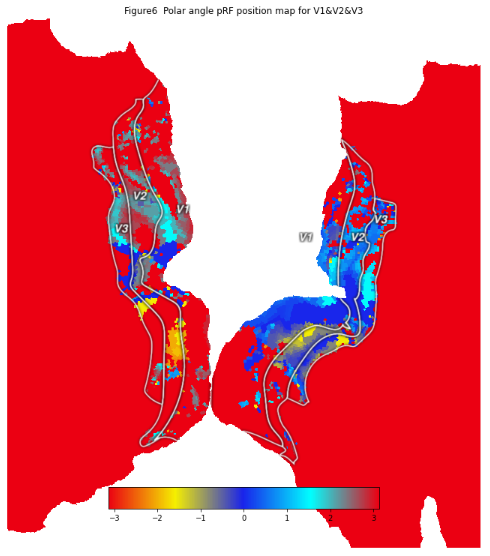

The third figure in the paper by Dumoulin and Wandell that we aimed to replicate plots the relationship between eccentricities and pRF sizes[9]. In the figure below the relationship between the eccentricities and pRFs of our data are shown, with separate lines for each of our three areas. As in the original paper, we found a positive, linear relationship between eccentricities and pRF sizes. In accordance to the original results we also found that for each eccentricity the pRF size in V2 is larger than the pRF size in V1. While Dumoulin and Wandell also found that the area V3 displayed higher pRF sizes than V2 and V1 at each eccentricity, we were unable to find this effect[9]. This may also be due to the fact that there seems to be larger variances between participants when regarding the relationship between eccentricities and pRFs, as depicted by in the original paper.

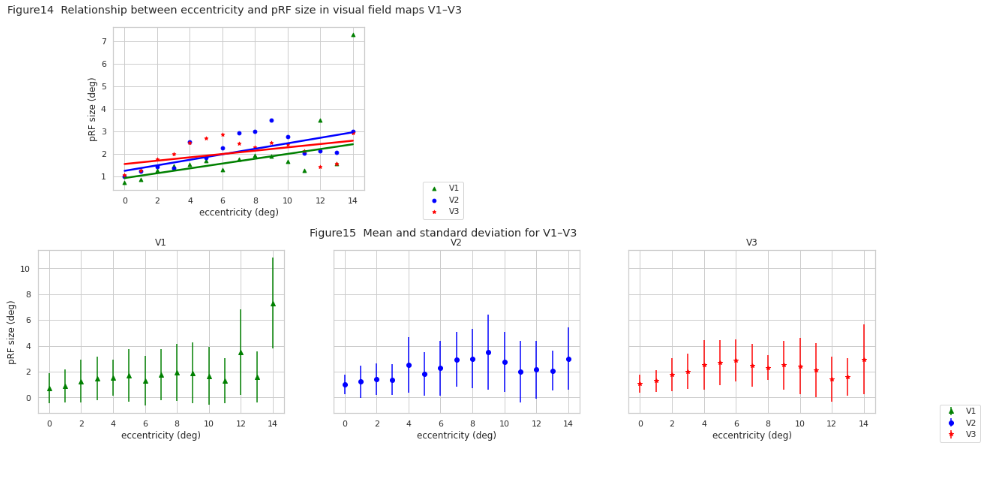

Another analysis we conducted was the mapping of pRF sizes on the brain surface. Considering that eccentricities increase with increasing distance to the centre of visual cortex and that eccentricities are positively correlated to pRF sizes, we expected to find increases in pRF sizes at larger distances to the visual cortex centre. The figure below confirms our results. While pRF sizes in the centre of the visual cortex are small, the pRF size steadily increases with increasing distance to the centre of V1.

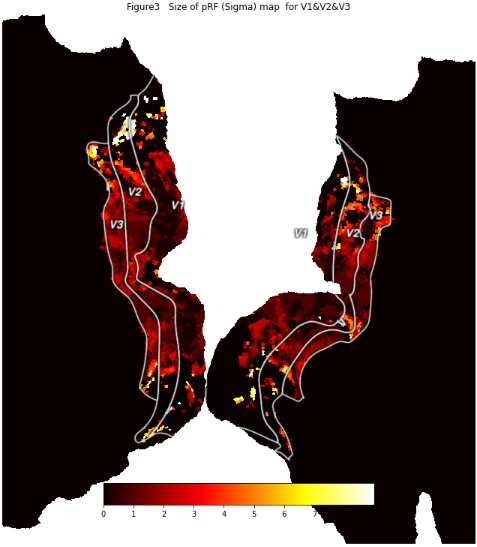

After replicating the results in the paper by Dumoulin and Wandell, we expanded our analysis to include other visual regions such as the VIP, LIP, V3a and MT[9]. In the figure below the polar angle mapping for all our ROIs is depicted. While we can see clear polar angle reversals in areas like the LIP or the VIP, it is much harder to conclude the existence of polar angle reversals in the MT or the VA3, for example. In the figure below, the V3a is the area on the dorsal half of the brain, adjacent to the V3. The MT is positioned ventrally to the V3a, adjacent to the V3. The VIP and LIP form the islands of activation posterior to the S2 and anterior to the V3a.

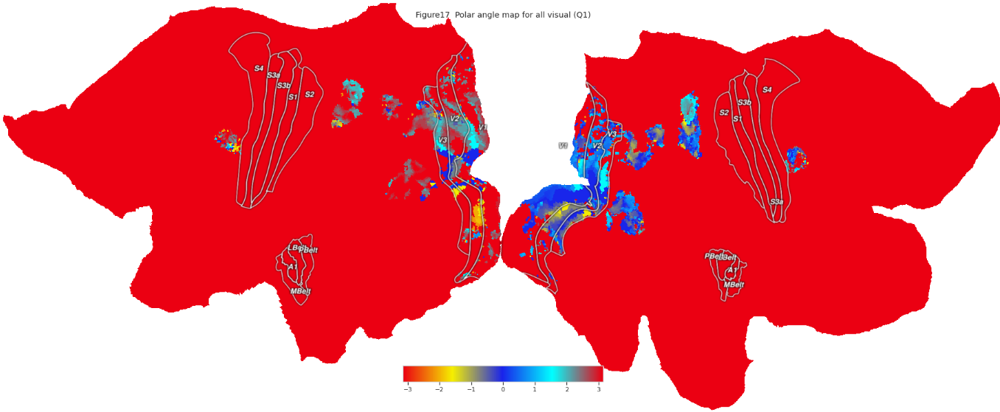

For eccentricities the figure below depicts that most areas outside of V1-V3 still show the general pattern that neighbouring voxels encode similar eccentricities. Compared to the eccentricities in V1, the areas we newly included in this analysis show relatively less processing of smaller eccentricities and therefore relatively more encoding of higher eccentricities. The previous finding that nearby eccentricity values are encoded by neighbouring voxels holds generally true for the newly added areas as well.

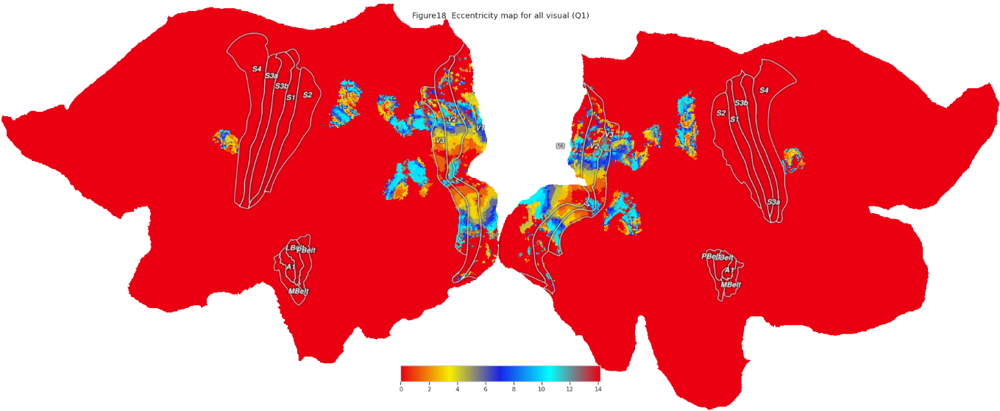

For the relationship between eccentricities and pRF sizes, the linear positve relationship that was described in the previous section can also be found for most of the areas included in this analysis. For the area V3a there is a slight negative relationship between eccentricity and pRF size. For the area V3, which showed a slight positive relationship between eccentricity and pRf size in the previous analysis, now depicts a slightly negative relationship between these two factors. This may be attributable to a change in the error term now that more voxels and regressors are included in the analysis. 

In terms of pRF sizes mapped on the brain, we can conclude that the later visual processing areas’ voxels generally encode larger pRFs, compared to early visual processing areas like the V1. This may be explained by the need for high specificity in early visual areas, such as the V1, especially in the central area that encodes information from the fovea. On top of that, later visual processing areas such as the LIP voxels may encode larger pRFs, because of a need for more global visual processing and (sensory) information integration.

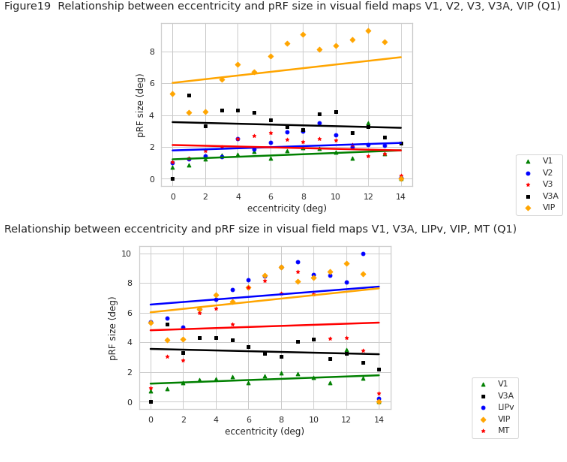

The next step we took to analyse retinotopic activity, was to expand our ROI to the whole brain. The threshold value of rsq=0.15 was kept the same as in our previous analyses to avoid including voxels that do not sufficiently correlate with our measured data. Below a figure is shown, which maps the explained variance to our data over the whole brain. Any voxel depicted here has an rsq above 0.15 and is therefore explaining at least 15% of the data. The scale depicted at the bottom of the figure shows the colour code for the amount of explained variance for each voxel. As can be concluded from this figure, there are many voxels and even whole areas that explain large amounts of our data. While these generally explain less variance than most parts of the visual cortices, many areas in the frontal and parietal lobe explain more than 50% of the data. Therefore, the frontal lobe and parietal lobes show retinotopic activity.

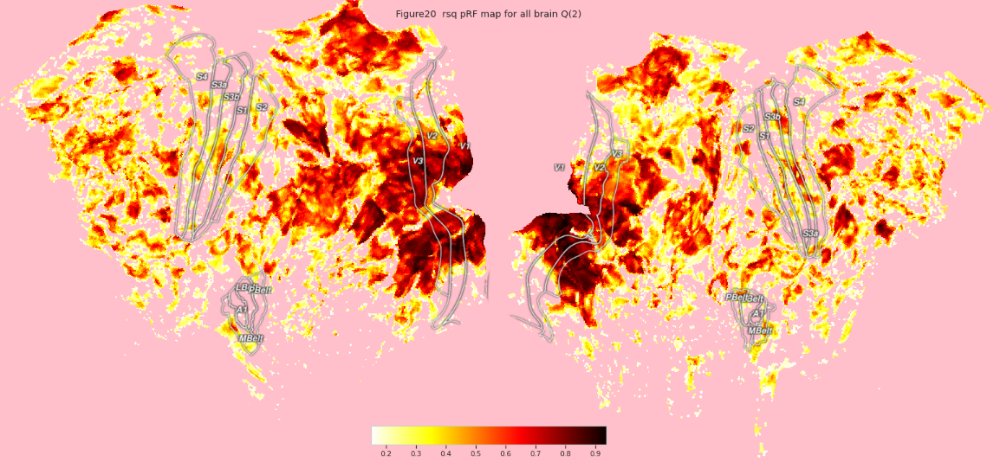

We further analysed this by looking at the size of the pRFs in the whole brain, to try to understand why these areas might be retinotopic. As can be seen below, areas depicted in this analysis which lie outside the visual cortices, have Gaussian spreads of around 8-10 sigma. Therefore, these areas respond to larger receptive fields. As mentioned in the previous paragraph, this may be due to the fact that areas in these regions (especially in non-primary regions) integrate information and process information on a more global scale.


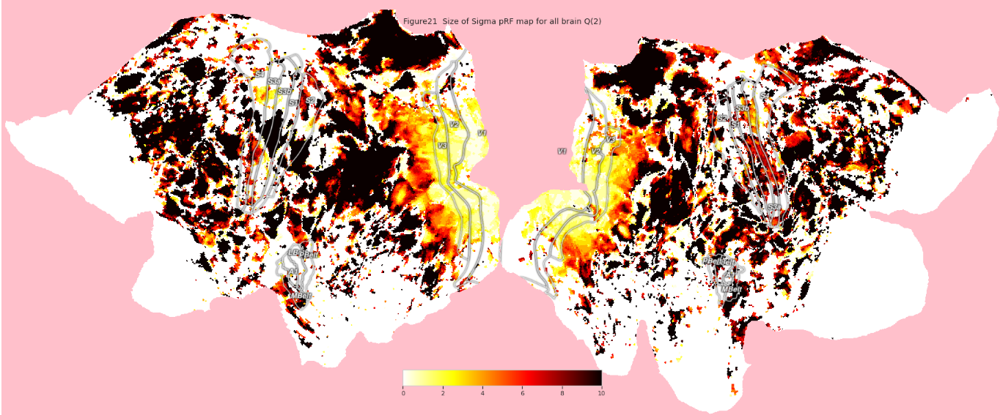

A further step we took in our analysis was to conduct the pRF size mapping on the brain surface with the exception that in this iteration we used a tool to map the participant’s HRF. This ought to provide a better fit to our model. In the graph below the two figures depict the fitted HRF which uses the mean activation of V1, V2 and V3 with a 30 seconds and 60 seconds, respectively.  Interestingly, estimating the participant’s HRF decreases the median fit to the model, but increases the amount of voxels that surpass the treshold of rsq =0.15 from 4224 to 4251 voxel. So, compared to the analysis without the fitted HRF, more voxels now pass the explained variance threshold of 0.15. Changing the time course from 30 seconds to 60 seconds did not meaningfully affect the quality of the pRF map. 


The two figures below depicts the fitted HRF:

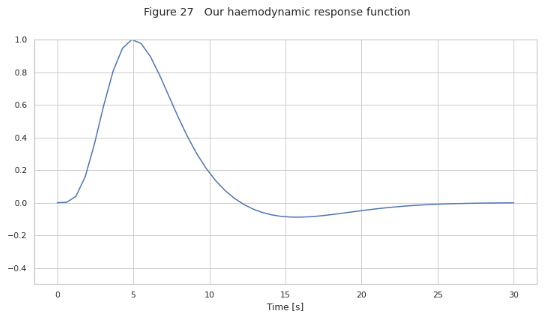

THe graph below depicts the difference in explained variance between the usage of a standard and a fitted HRF



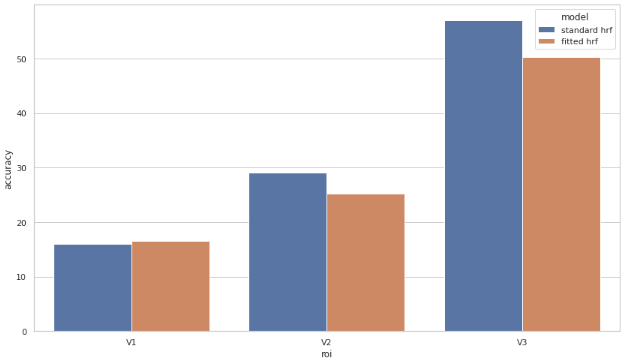

When using a fitted HRF based solely on the V1 activation, the time course plays a much larger role, however. As can be seen below, the HRF with a 30 second time course causes most voxels to be below the explained variance threshold of rsq =0.15. Increasing the time course to 60 seconds however causes a much larger amount of voxels to pass this threshold. In this instant increasing the time course has a significant influence on the model’s fit. In the figures below the pRF sizes in the V1 are shown. The first figure uses a 30 seconds time course, while the second one uses a 60 seconds one.

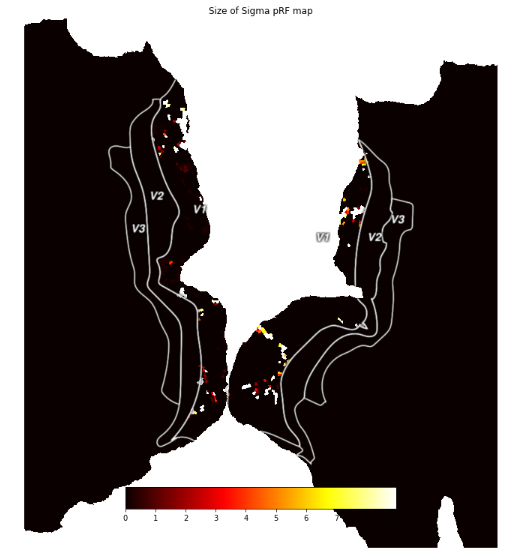

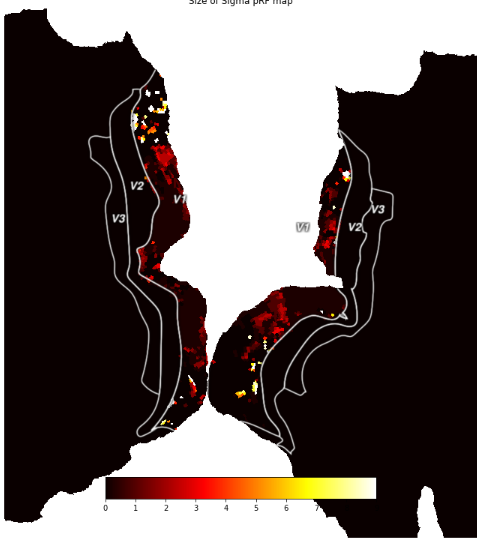

The usage of the non-linear CSS model did not have a large influence on our data. Overall there was a slight improvement in the accuracy of our model's prediction, however, the explained variance for the areas V1, V2 and V3 slightly decreased, as can be seen in the figures below.

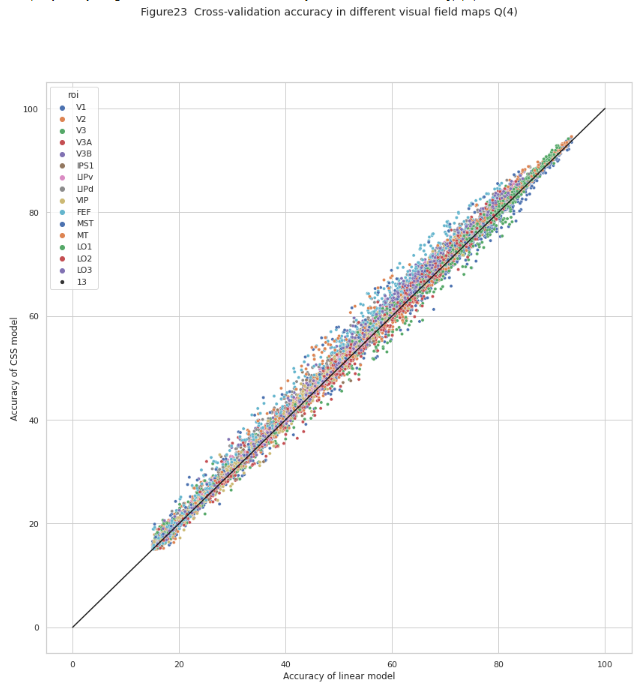

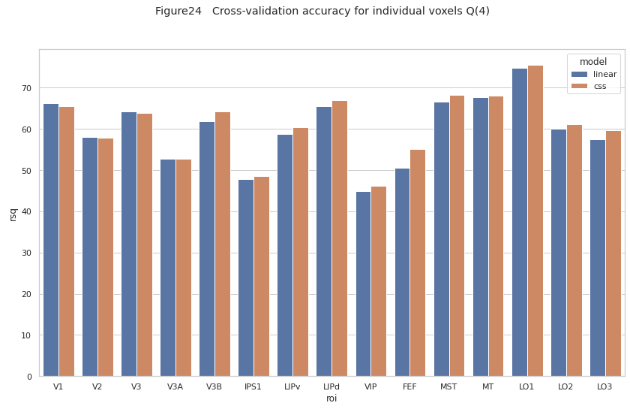

The discrepancy in the results we obtained compared to the ones by Kay et al. might be due to the difference in the fitting procedures used. For example, in their study, bootstrapping was utilisied to fit the model 30 times, while we only fitted once [10]. We might have obtained the same outcome, if we had used similar procedures. The figures below display the pRF sizes for only the regions V1-V3 and all traditionally considered visual regions, respectively. These figures illustrate the point that our usage of CSS, did not result in any meaningful differences.

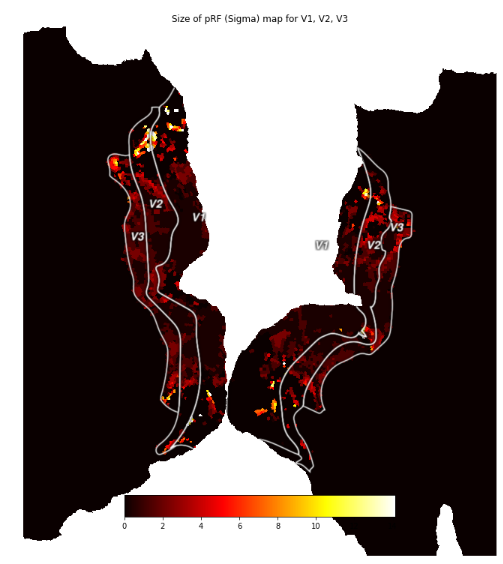

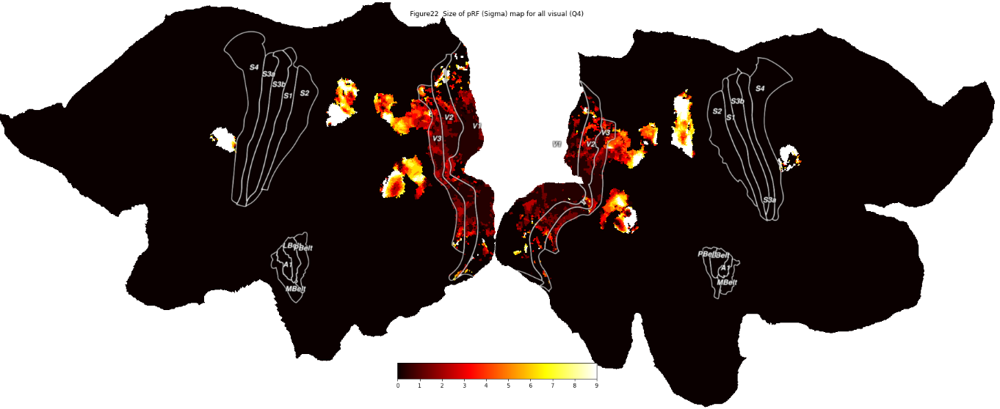

## Discussion


In the current study, we used an encoding model to analyse how visual information are mapped on the brain. We were able to replicate previous findings, that showed retinotopic organisation in the visual cortex for polar angle, pRF size and eccentricity in the areas V1, V2 and V3. We were also able to find the phenomenon known as polar angle reversal in these ROI. Furthermore, we confirmed the positive correlations between pRF size and eccentricities for the V1, V2 and V3. 

We managed to expand this information, by our findings that other visual areas such as the V3a, MT, VIP and LIP also show topographic organisation for visual stimuli in terms of polar angles or eccentricity in this case. The pRF sizes for the voxels belonging to these newly included areas, were generally larger than the pRF sizes corresponding to voxels in the earlier visual processing areas, such as the V1. This may be due to the fact, that the areas that were included for the second analysis step are thought to be involved in more complex information processing which would presume information integration (e.g. LIP or VIP). 

Another step that we undertook was to expand the ROI to the entire brain. Due to the fact, that we only included voxels with an explained variance of 0.15 or higher, we were able to exclude much noise due to random voxel activation. The whole-brain analysis resulted in two major findings. First, there are areas in other lobes of the brain, (e.g., the frontal or parietal lobe) that explained large amounts of the variance of the data. Therefore, these areas are implicated in visual processing. Second, these areas have been found to encode much larger pRFs than the majority of the areas V1-V3 do. This could again be explained by the idea, that these areas are involved in more complex and global visual processing. Nevertheless, it should be noted that the finding that other lobes of the brain encode visual information, should cause a paradigm shift in the way we label brain area’s functions. Reducing certain areas to simply one function causes a narrow view on how information is processed across the brain. Disregarding the frontal cortex as a non-visual area, when analysing a vision-related experiment, would likely cause an unnecessary loss of information.

To improve the fit of our data we used an HRF mapper that used the mean of the visual areas V1-V3, in an extra analysis. The ROIs for this analysis were reduced to V1-V3, as we were only interested in how a fitted HRF can influence our outcomes. We found that for an HRF based on the means of V1,V2 and V3, more voxels surpassed the threshold we set of rsq=0.15. Changing the length of the time course from 30 seconds to 60 seconds did not have a meaningful effect. However, this effect was much larger when we regarded an HRF based only on V1. Here, also a change in the time course from 30 seconds to 60 seconds significantly improved the amount of voxels that surpassed the threshold. Using an HRF may therefore be a good way to increase the explained variance of a model.

The non-linear CSS model seems to be a promising addition to increase the fit of models. It should be noted, however, that extensive fitting procedures are necessary to obtain an increase in overall explained variance. As we showed, if the CSS is not well fitted, it may even perform slightly worse than the linear model. Nevertheless, this is less an issue with CSS but rather a problem with proper fitting.

For future research, it may be of interest to examine how other visual properties, like colour for example, are represented in the brain. Furthermore, we would like to appeal to researchers to analyse the brain first of all more in terms of patterns but also more globally. Our finding that the frontal lobe is displaying activity linked to visual processing would not have been possible if we had not expanded our ROIs to include not traditionally regarded visual areas of the brain. Another outlook could be to investigate whether subcortical areas show similar patterns for visual stimuli, for example the entorhinal cortex or the hippocampus who have been found to be involved in spatial navigation[11]. 

## References:
[1] Duwell, E. J., Woertz, E. N., Mathis, J., Carroll, J., & DeYoe, E. A. (2021). Aberrant visual population receptive fields in human albinism. Journal of vision, 21(5), 19-19.

[2] Benson, N. C., Jamison, K. W., Arcaro, M. J., Vu, A. T., Glasser, M. F., Coalson, T. S., ... & Kay, K. (2018). The Human Connectome Project 7 Tesla retinotopy dataset: Description and population receptive field analysis. Journal of vision, 18(13), 23-23.

[3] Himmelberg, M. M., Kurzawski, J. W., Benson, N. C., Pelli, D. G., Carrasco, M., & Winawer, J. (2021). Cross-dataset reproducibility of human retinotopic maps. Neuroimage, 244, 118609.

[4] Wandell, B. A., Dumoulin, S. O., & Brewer, A. A. (2007). Visual field maps in human cortex. Neuron, 56(2), 366-383.

[5] Brewer, A. A., & Barton, B. (2014). Visual cortex in aging and Alzheimer's disease: changes in visual field maps and population receptive fields. Frontiers in psychology, 5, 74.

[6] Alvarez, I., Finlayson, N. J., Ei, S., de Haas, B., Greenwood, J. A., & Schwarzkopf, D. S. (2021). Heritable functional architecture in human visual cortex. NeuroImage, 239, 118286.

[7]Wandell, B. A., & Winawer, J. (2015). Computational neuroimaging and population receptive fields. Trends in cognitive sciences, 19(6), 349-357.

[8] Winawer, J., & Witthoft, N. (2015). Human V4 and ventral occipital retinotopic maps. Visual neuroscience, 32.

[9] Dumoulin, S. O., & Wandell, B. A. (2008). Population receptive field estimates in human visual cortex. Neuroimage, 39(2), 647-660.

[10] Kay, K. N., Winawer, J., Mezer, A., & Wandell, B. A. (2013). Compressive spatial summation in human visual cortex. Journal of neurophysiology, 110(2), 481-494.

[11]Behrens, T. E. J., Muller, T. H., Whittington, J. C. R., Mark, S., Baram, A. B., Stachenfeld, K. L., & Kurth-Nelson, Z. (2018). What is a cognitive map? organizing knowledge for flexible behavior. Neuron, 100(2), 490–509. https://doi.org/10.1016/j.neuron.2018.10.002